<a href="https://colab.research.google.com/github/KethanSaiV/XAI-Driven-Breast-Cancer-Histopathology-Classification/blob/main/BreaKHis_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -q grad-cam lime shap staintools spams torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 108.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 28.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 91.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 56.7 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × Building wheel for spams (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for spams
ERROR: ERROR: Failed to build installa

In [ ]:
# ── CONFIGURE THIS ──────────────────────────────────────────────────────────
EXTRACT_TO    = '/content/breakhis'
DATA_ROOT     = f'{EXTRACT_TO}/BreaKHis 400X'   # folder name has a space
BATCH_SIZE    = 32
EPOCHS        = 20
IMG_SIZE      = 224
NUM_WORKERS   = 2
SEED          = 42
# ────────────────────────────────────────────────────────────────────────────

In [ ]:
import os, shutil, tarfile, zipfile

os.makedirs(EXTRACT_TO, exist_ok=True)

if ZIP_PATH.endswith('.tar.gz') or ZIP_PATH.endswith('.tgz'):
    with tarfile.open(ZIP_PATH, 'r:gz') as tar:
        tar.extractall(EXTRACT_TO)
elif ZIP_PATH.endswith('.zip'):
    with zipfile.ZipFile(ZIP_PATH, 'r') as zf:
        zf.extractall(EXTRACT_TO)

print('Extraction complete.')

# Show folder structure
for root, dirs, files in os.walk(EXTRACT_TO):
    level = root.replace(EXTRACT_TO, '').count(os.sep)
    if level < 5:
        indent = ' ' * 2 * level
        print(f'{indent}{os.path.basename(root)}/')
        if level == 4:
            print(f'{indent}  [{len(files)} files]')

Extraction complete.
breakhis/
  BreaKHis 400X/
    test/
      malignant/
      benign/
    train/
      malignant/
      benign/


In [ ]:
import glob, random
import numpy as np
import pandas as pd
from pathlib import Path

random.seed(SEED)
np.random.seed(SEED)

def load_split(split):
    records = []
    for label_name, label_idx in [('benign', 0), ('malignant', 1)]:
        imgs = (glob.glob(f'{DATA_ROOT}/{split}/{label_name}/*.png') +
                glob.glob(f'{DATA_ROOT}/{split}/{label_name}/*.jpg'))
        for p in imgs:
            records.append({'path': p, 'label': label_idx, 'label_name': label_name})
    return pd.DataFrame(records).sample(frac=1, random_state=SEED).reset_index(drop=True)

train_df = load_split('train')
test_df  = load_split('test')

# Carve 15% of train → val
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(train_df, test_size=0.15, stratify=train_df['label'], random_state=SEED)
train_df = train_df.reset_index(drop=True)
val_df   = val_df.reset_index(drop=True)

print(f'Train : {len(train_df)} — {train_df["label_name"].value_counts().to_dict()}')
print(f'Val   : {len(val_df)}   — {val_df["label_name"].value_counts().to_dict()}')
print(f'Test  : {len(test_df)}  — {test_df["label_name"].value_counts().to_dict()}')

Train : 975 — {'malignant': 660, 'benign': 315}
Val   : 173   — {'malignant': 117, 'benign': 56}
Test  : 545  — {'malignant': 369, 'benign': 176}


In [ ]:
import cv2
import numpy as np

# Macenko stain normalization — lightweight implementation without staintools dependency issues
def macenko_normalize(img, reference=None):
    """
    img: HxWx3 uint8 RGB numpy array
    Returns normalized HxWx3 uint8 RGB array.
    If reference is None, only OD conversion is applied (safe fallback).
    """
    img = img.astype(np.float32) + 1e-6
    OD = -np.log(img / 255.0)
    OD[OD < 0] = 0

    if reference is None:
        # Just return normalized as-is (useful for baseline)
        out = np.exp(-OD) * 255
        return np.clip(out, 0, 255).astype(np.uint8)

    # Full SVD-based Macenko
    OD_hat = OD[OD.sum(axis=2) > 0.15]
    if len(OD_hat) == 0:
        return img.astype(np.uint8)

    _, _, V = np.linalg.svd(OD_hat, full_matrices=False)
    V = V[:2].T
    phi = np.arctan2(OD_hat @ V[:, 1], OD_hat @ V[:, 0])
    min_phi, max_phi = np.percentile(phi, 1), np.percentile(phi, 99)
    v1 = V @ np.array([np.cos(min_phi), np.sin(min_phi)])
    v2 = V @ np.array([np.cos(max_phi), np.sin(max_phi)])
    if v1[0] > v2[0]: v1, v2 = v2, v1
    HE = np.array([v1, v2]).T

    C = np.linalg.lstsq(HE, OD.reshape(-1, 3).T, rcond=None)[0]
    maxC = np.percentile(C, 99, axis=1, keepdims=True)
    C_norm = C / (maxC + 1e-6)
    # Use reference maxC
    C_norm *= reference

    OD_norm = HE @ C_norm
    out = np.exp(-OD_norm.T.reshape(img.shape[:2] + (3,))) * 255
    return np.clip(out, 0, 255).astype(np.uint8)

# Pick a reference image (first training image)
REF_IMG = cv2.cvtColor(cv2.imread(train_df['path'][0]), cv2.COLOR_BGR2RGB)
print('Reference image loaded:', train_df['path'][0])
print('Stain normalization ready (Macenko SVD method).')

Reference image loaded: /content/breakhis/BreaKHis 400X/train/malignant/SOB_M_DC-14-9461-400-012.png
Stain normalization ready (Macenko SVD method).


In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

torch.manual_seed(SEED)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Device:', device)

MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]

train_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])

val_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])

class BreakHisDataset(Dataset):
    def __init__(self, df, transform=None, normalize_stain=False):
        self.df = df.reset_index(drop=True)
        self.transform = transform
        self.normalize_stain = normalize_stain

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = cv2.cvtColor(cv2.imread(row['path']), cv2.COLOR_BGR2RGB)
        if self.normalize_stain:
            img = macenko_normalize(img)   # apply normalization
        img = Image.fromarray(img)
        if self.transform:
            img = self.transform(img)
        return img, row['label']

train_ds = BreakHisDataset(train_df, transform=train_tf, normalize_stain=True)
val_ds   = BreakHisDataset(val_df,   transform=val_tf,   normalize_stain=True)
test_ds  = BreakHisDataset(test_df,  transform=val_tf,   normalize_stain=True)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

print(f'Train batches: {len(train_loader)} | Val batches: {len(val_loader)} | Test batches: {len(test_loader)}')

Device: cuda
Train batches: 31 | Val batches: 6 | Test batches: 18


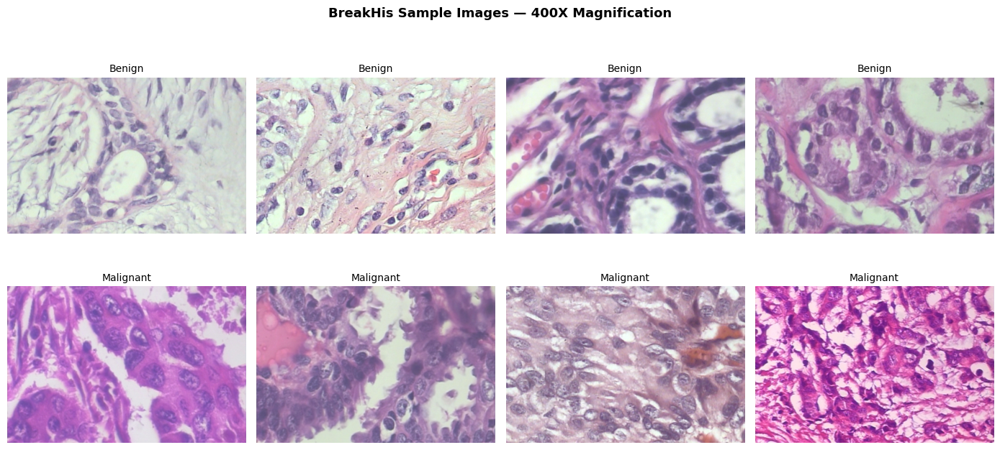

Saved to /content/sample_images.png


In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 4, figsize=(14, 7))
classes = ['benign', 'malignant']

for row_idx, cls in enumerate(classes):
    subset = train_df[train_df['label_name'] == cls].sample(4, random_state=SEED)
    for col_idx, (_, sample) in enumerate(subset.iterrows()):
        img = cv2.cvtColor(cv2.imread(sample['path']), cv2.COLOR_BGR2RGB)
        axes[row_idx, col_idx].imshow(img)
        axes[row_idx, col_idx].set_title(cls.capitalize(), fontsize=10)
        axes[row_idx, col_idx].axis('off')

plt.suptitle('BreakHis Sample Images — 400X Magnification', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/sample_images.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved to /content/sample_images.png')

In [ ]:
import torchvision.models as models

def build_model(name, num_classes=2, pretrained=True):
    weights = 'DEFAULT' if pretrained else None

    if name == 'efficientnet_v2_s':
        m = models.efficientnet_v2_s(weights=weights)
        m.classifier[1] = nn.Linear(m.classifier[1].in_features, num_classes)

    elif name == 'convnext_small':
        m = models.convnext_small(weights=weights)
        m.classifier[2] = nn.Linear(m.classifier[2].in_features, num_classes)

    elif name == 'resnet50':
        m = models.resnet50(weights=weights)
        m.fc = nn.Linear(m.fc.in_features, num_classes)

    elif name == 'densenet121':
        m = models.densenet121(weights=weights)
        m.classifier = nn.Linear(m.classifier.in_features, num_classes)

    else:
        raise ValueError(f'Unknown model: {name}')

    return m.to(device)

MODEL_NAMES = ['efficientnet_v2_s', 'convnext_small', 'resnet50', 'densenet121']
print('Model definitions ready.')

Model definitions ready.


In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score
import copy, time

def train_one_epoch(model, loader, criterion, optimizer):
    model.train()
    total_loss, preds_all, labels_all = 0, [], []
    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        out  = model(imgs)
        loss = criterion(out, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * len(imgs)
        preds_all.extend(out.argmax(1).cpu().numpy())
        labels_all.extend(labels.cpu().numpy())
    return total_loss / len(loader.dataset), accuracy_score(labels_all, preds_all)

@torch.no_grad()
def evaluate(model, loader, criterion):
    model.eval()
    total_loss, preds_all, probs_all, labels_all = 0, [], [], []
    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)
        out  = model(imgs)
        loss = criterion(out, labels)
        total_loss += loss.item() * len(imgs)
        probs = torch.softmax(out, dim=1)[:, 1].cpu().numpy()
        preds_all.extend(out.argmax(1).cpu().numpy())
        probs_all.extend(probs)
        labels_all.extend(labels.cpu().numpy())
    acc  = accuracy_score(labels_all, preds_all)
    auc  = roc_auc_score(labels_all, probs_all)
    f1   = f1_score(labels_all, preds_all)
    return total_loss / len(loader.dataset), acc, auc, f1


def train_model(model_name):
    print(f'\n{'='*50}\nTraining: {model_name}\n{'='*50}')
    model     = build_model(model_name)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

    best_val_auc  = 0
    best_weights  = None
    history       = []

    for epoch in range(1, EPOCHS + 1):
        t0 = time.time()
        tr_loss, tr_acc = train_one_epoch(model, train_loader, criterion, optimizer)
        vl_loss, vl_acc, vl_auc, vl_f1 = evaluate(model, val_loader, criterion)
        scheduler.step()

        history.append({'epoch': epoch, 'tr_loss': tr_loss, 'tr_acc': tr_acc,
                        'vl_loss': vl_loss, 'vl_acc': vl_acc, 'vl_auc': vl_auc, 'vl_f1': vl_f1})

        if vl_auc > best_val_auc:
            best_val_auc = vl_auc
            best_weights = copy.deepcopy(model.state_dict())

        print(f'Epoch {epoch:02d}/{EPOCHS} | '
              f'Tr Loss: {tr_loss:.4f} Acc: {tr_acc:.4f} | '
              f'Val Loss: {vl_loss:.4f} Acc: {vl_acc:.4f} AUC: {vl_auc:.4f} F1: {vl_f1:.4f} | '
              f'{time.time()-t0:.1f}s')

    model.load_state_dict(best_weights)
    save_path = f'/content/{model_name}_best.pth'
    torch.save(best_weights, save_path)
    print(f'Best model saved: {save_path} (Val AUC: {best_val_auc:.4f})')
    return model, history

print('Training utilities ready.')

Training utilities ready.


In [ ]:
# Train all models — this will take ~30-60 min on T4 GPU
trained_models = {}
all_histories  = {}

for mname in MODEL_NAMES:
    model, history = train_model(mname)
    trained_models[mname] = model
    all_histories[mname]  = history


Training: efficientnet_v2_s
Downloading: "https://download.pytorch.org/models/efficientnet_v2_s-dd5fe13b.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_s-dd5fe13b.pth


100%|██████████| 82.7M/82.7M [00:00<00:00, 106MB/s]


Epoch 01/20 | Tr Loss: 0.4681 Acc: 0.7723 | Val Loss: 0.4983 Acc: 0.7977 AUC: 0.9420 F1: 0.8689 | 31.6s
Epoch 02/20 | Tr Loss: 0.2808 Acc: 0.8790 | Val Loss: 0.1768 Acc: 0.9595 AUC: 0.9878 F1: 0.9700 | 29.6s
Epoch 03/20 | Tr Loss: 0.2002 Acc: 0.9200 | Val Loss: 0.1566 Acc: 0.9422 AUC: 0.9773 F1: 0.9583 | 30.6s
Epoch 04/20 | Tr Loss: 0.1304 Acc: 0.9508 | Val Loss: 0.1822 Acc: 0.9422 AUC: 0.9741 F1: 0.9580 | 31.6s
Epoch 05/20 | Tr Loss: 0.1214 Acc: 0.9528 | Val Loss: 0.1523 Acc: 0.9480 AUC: 0.9811 F1: 0.9617 | 31.6s
Epoch 06/20 | Tr Loss: 0.1074 Acc: 0.9672 | Val Loss: 0.1474 Acc: 0.9538 AUC: 0.9867 F1: 0.9655 | 30.3s
Epoch 07/20 | Tr Loss: 0.0616 Acc: 0.9754 | Val Loss: 0.2220 Acc: 0.9306 AUC: 0.9882 F1: 0.9500 | 32.0s
Epoch 08/20 | Tr Loss: 0.0544 Acc: 0.9774 | Val Loss: 0.1673 Acc: 0.9538 AUC: 0.9879 F1: 0.9661 | 28.7s
Epoch 09/20 | Tr Loss: 0.0832 Acc: 0.9723 | Val Loss: 0.1618 Acc: 0.9595 AUC: 0.9824 F1: 0.9702 | 29.1s
Epoch 10/20 | Tr Loss: 0.0695 Acc: 0.9795 | Val Loss: 0.1189 Acc

100%|██████████| 192M/192M [00:01<00:00, 160MB/s]


Epoch 01/20 | Tr Loss: 0.5980 Acc: 0.6810 | Val Loss: 0.5263 Acc: 0.7919 AUC: 0.8304 F1: 0.8636 | 49.9s
Epoch 02/20 | Tr Loss: 0.4174 Acc: 0.8451 | Val Loss: 0.3939 Acc: 0.8497 AUC: 0.8826 F1: 0.8917 | 37.0s
Epoch 03/20 | Tr Loss: 0.3515 Acc: 0.8708 | Val Loss: 0.3391 Acc: 0.8786 AUC: 0.9478 F1: 0.9157 | 38.5s
Epoch 04/20 | Tr Loss: 0.3215 Acc: 0.8769 | Val Loss: 0.2694 Acc: 0.8844 AUC: 0.9548 F1: 0.9167 | 36.3s
Epoch 05/20 | Tr Loss: 0.3248 Acc: 0.8841 | Val Loss: 0.2559 Acc: 0.9075 AUC: 0.9629 F1: 0.9310 | 37.8s
Epoch 06/20 | Tr Loss: 0.2791 Acc: 0.8954 | Val Loss: 0.2669 Acc: 0.8728 AUC: 0.9670 F1: 0.9091 | 36.1s
Epoch 07/20 | Tr Loss: 0.2490 Acc: 0.9026 | Val Loss: 0.2198 Acc: 0.9075 AUC: 0.9741 F1: 0.9310 | 37.6s
Epoch 08/20 | Tr Loss: 0.1882 Acc: 0.9323 | Val Loss: 0.1741 Acc: 0.9422 AUC: 0.9844 F1: 0.9583 | 36.5s
Epoch 09/20 | Tr Loss: 0.2459 Acc: 0.9026 | Val Loss: 0.1731 Acc: 0.9364 AUC: 0.9806 F1: 0.9528 | 37.6s
Epoch 10/20 | Tr Loss: 0.1378 Acc: 0.9497 | Val Loss: 0.1969 Acc

100%|██████████| 97.8M/97.8M [00:00<00:00, 184MB/s]


Epoch 01/20 | Tr Loss: 0.4461 Acc: 0.8174 | Val Loss: 0.2908 Acc: 0.8902 AUC: 0.9492 F1: 0.9218 | 28.6s
Epoch 02/20 | Tr Loss: 0.2905 Acc: 0.8800 | Val Loss: 0.3993 Acc: 0.9017 AUC: 0.9327 F1: 0.9306 | 28.6s
Epoch 03/20 | Tr Loss: 0.2048 Acc: 0.9251 | Val Loss: 0.2616 Acc: 0.9133 AUC: 0.9617 F1: 0.9339 | 28.4s
Epoch 04/20 | Tr Loss: 0.1648 Acc: 0.9456 | Val Loss: 0.1434 Acc: 0.9364 AUC: 0.9864 F1: 0.9524 | 28.4s
Epoch 05/20 | Tr Loss: 0.1208 Acc: 0.9579 | Val Loss: 0.1695 Acc: 0.9364 AUC: 0.9870 F1: 0.9540 | 28.7s
Epoch 06/20 | Tr Loss: 0.1306 Acc: 0.9497 | Val Loss: 0.2169 Acc: 0.9075 AUC: 0.9721 F1: 0.9344 | 28.7s
Epoch 07/20 | Tr Loss: 0.0920 Acc: 0.9744 | Val Loss: 0.2356 Acc: 0.9191 AUC: 0.9837 F1: 0.9381 | 28.1s
Epoch 08/20 | Tr Loss: 0.1117 Acc: 0.9559 | Val Loss: 0.1771 Acc: 0.9422 AUC: 0.9826 F1: 0.9583 | 28.5s
Epoch 09/20 | Tr Loss: 0.0974 Acc: 0.9641 | Val Loss: 0.1675 Acc: 0.9538 AUC: 0.9905 F1: 0.9669 | 28.5s
Epoch 10/20 | Tr Loss: 0.0707 Acc: 0.9754 | Val Loss: 0.1099 Acc

100%|██████████| 30.8M/30.8M [00:00<00:00, 151MB/s]


Epoch 01/20 | Tr Loss: 0.3777 Acc: 0.8246 | Val Loss: 0.2455 Acc: 0.9075 AUC: 0.9628 F1: 0.9310 | 28.2s
Epoch 02/20 | Tr Loss: 0.2210 Acc: 0.9169 | Val Loss: 0.1254 Acc: 0.9653 AUC: 0.9887 F1: 0.9746 | 27.9s
Epoch 03/20 | Tr Loss: 0.1798 Acc: 0.9303 | Val Loss: 0.3399 Acc: 0.9075 AUC: 0.9582 F1: 0.9344 | 27.1s
Epoch 04/20 | Tr Loss: 0.1428 Acc: 0.9538 | Val Loss: 0.1559 Acc: 0.9364 AUC: 0.9911 F1: 0.9547 | 28.1s
Epoch 05/20 | Tr Loss: 0.1103 Acc: 0.9610 | Val Loss: 0.1702 Acc: 0.9364 AUC: 0.9843 F1: 0.9520 | 28.5s
Epoch 06/20 | Tr Loss: 0.1260 Acc: 0.9579 | Val Loss: 0.1128 Acc: 0.9422 AUC: 0.9939 F1: 0.9583 | 28.4s
Epoch 07/20 | Tr Loss: 0.0994 Acc: 0.9621 | Val Loss: 0.1483 Acc: 0.9480 AUC: 0.9905 F1: 0.9610 | 28.5s
Epoch 08/20 | Tr Loss: 0.1317 Acc: 0.9446 | Val Loss: 0.1565 Acc: 0.9538 AUC: 0.9852 F1: 0.9652 | 28.4s
Epoch 09/20 | Tr Loss: 0.0864 Acc: 0.9692 | Val Loss: 0.0994 Acc: 0.9769 AUC: 0.9928 F1: 0.9829 | 28.2s
Epoch 10/20 | Tr Loss: 0.0566 Acc: 0.9774 | Val Loss: 0.0814 Acc

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

results = []
for mname, model in trained_models.items():
    criterion = nn.CrossEntropyLoss()
    _, acc, auc, f1 = evaluate(model, test_loader, criterion)

    # Sensitivity / Specificity
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for imgs, labels in test_loader:
            out = model(imgs.to(device))
            all_preds.extend(out.argmax(1).cpu().numpy())
            all_labels.extend(labels.numpy())

    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0

    results.append({'Model': mname, 'Accuracy': acc, 'AUC': auc,
                    'F1': f1, 'Sensitivity': sensitivity, 'Specificity': specificity})
    print(f'{mname}: Acc={acc:.4f} AUC={auc:.4f} F1={f1:.4f} Se={sensitivity:.4f} Sp={specificity:.4f}')

results_df = pd.DataFrame(results)
print('\n--- Final Results Table ---')
print(results_df.to_string(index=False))
results_df.to_csv('/content/results_table.csv', index=False)
print('Saved to /content/results_table.csv')

efficientnet_v2_s: Acc=0.9596 AUC=0.9892 F1=0.9700 Se=0.9648 Sp=0.9489
convnext_small: Acc=0.9615 AUC=0.9913 F1=0.9713 Se=0.9621 Sp=0.9602
resnet50: Acc=0.9706 AUC=0.9921 F1=0.9785 Se=0.9864 Sp=0.9375
densenet121: Acc=0.9633 AUC=0.9946 F1=0.9728 Se=0.9675 Sp=0.9545

--- Final Results Table ---
            Model  Accuracy      AUC       F1  Sensitivity  Specificity
efficientnet_v2_s  0.959633 0.989191 0.970027      0.96477     0.948864
   convnext_small  0.961468 0.991316 0.971272      0.96206     0.960227
         resnet50  0.970642 0.992070 0.978495      0.98645     0.937500
      densenet121  0.963303 0.994580 0.972752      0.96748     0.954545
Saved to /content/results_table.csv


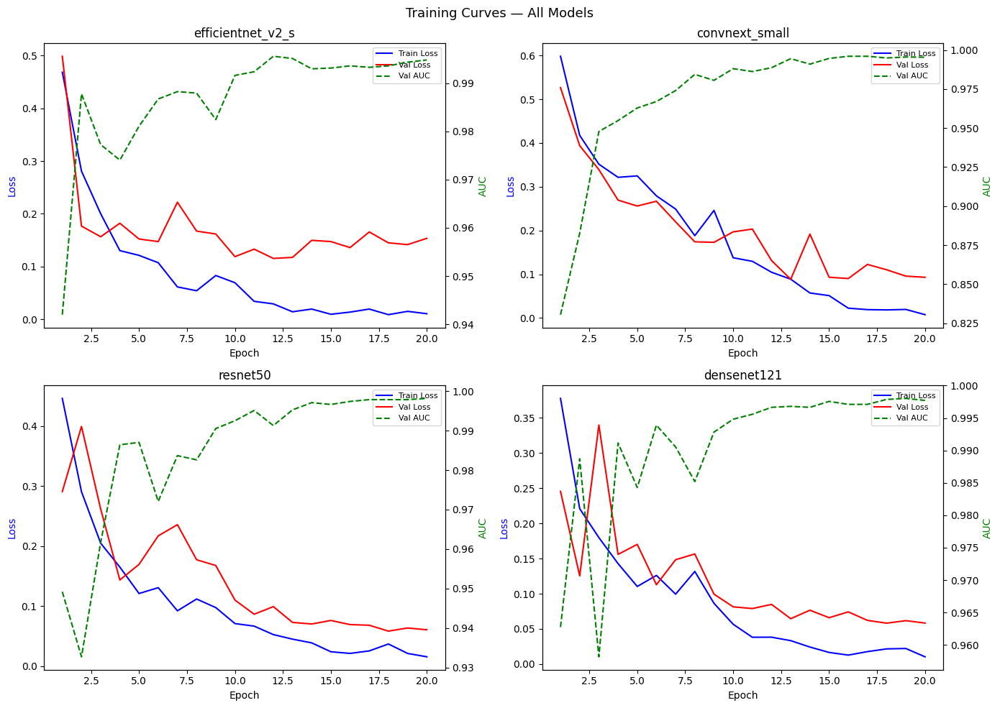

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for ax, (mname, history) in zip(axes, all_histories.items()):
    epochs   = [h['epoch'] for h in history]
    tr_loss  = [h['tr_loss'] for h in history]
    vl_loss  = [h['vl_loss'] for h in history]
    vl_auc   = [h['vl_auc']  for h in history]

    ax2 = ax.twinx()
    ax.plot(epochs, tr_loss, 'b-', label='Train Loss')
    ax.plot(epochs, vl_loss, 'r-', label='Val Loss')
    ax2.plot(epochs, vl_auc, 'g--', label='Val AUC')

    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss', color='b')
    ax2.set_ylabel('AUC', color='g')
    ax.set_title(mname)
    lines1, labels1 = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax.legend(lines1 + lines2, labels1 + labels2, loc='upper right', fontsize=8)

plt.suptitle('Training Curves — All Models', fontsize=13)
plt.tight_layout()
plt.savefig('/content/training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
!pip install -q grad-cam

In [ ]:
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

def get_target_layer(model, mname):
    if mname == 'efficientnet_v2_s':
        return [model.features[-1]]
    elif mname == 'convnext_small':
        return [model.features[-1][-1].block[-1]]
    elif mname == 'resnet50':
        return [model.layer4[-1]]
    elif mname == 'densenet121':
        return [model.features.denseblock4]

def denormalize(tensor):
    mean = torch.tensor(MEAN).view(3, 1, 1)
    std  = torch.tensor(STD).view(3, 1, 1)
    return (tensor * std + mean).clamp(0, 1)

# Pick 4 test images (2 benign, 2 malignant)
sample_rows = pd.concat([
    test_df[test_df['label'] == 0].sample(2, random_state=SEED),
    test_df[test_df['label'] == 1].sample(2, random_state=SEED)
]).reset_index(drop=True)

sample_imgs  = []
sample_rgbs  = []
for _, row in sample_rows.iterrows():
    img_raw = cv2.cvtColor(cv2.imread(row['path']), cv2.COLOR_BGR2RGB)
    img_raw = cv2.resize(img_raw, (IMG_SIZE, IMG_SIZE))
    sample_rgbs.append(img_raw.astype(np.float32) / 255.0)
    tensor = val_tf(Image.fromarray(img_raw))
    sample_imgs.append(tensor)

print('XAI sample images ready.')

XAI sample images ready.


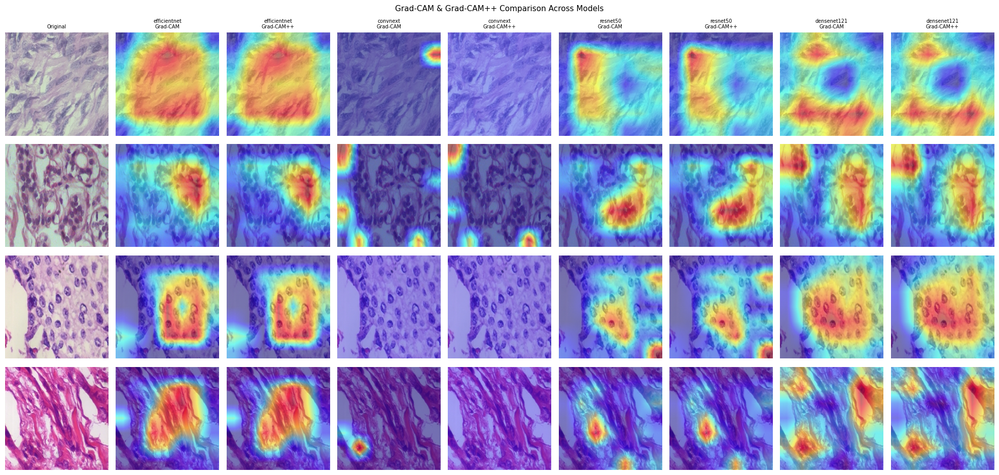

Saved: /content/gradcam_comparison.png


In [ ]:
# Generate Grad-CAM and Grad-CAM++ for all models on the 4 sample images
# Rows: sample images | Cols per model: original | Grad-CAM | Grad-CAM++

n_samples = len(sample_imgs)
n_models  = len(MODEL_NAMES)
n_cols    = n_models * 2 + 1   # original + (gradcam + gradcam++) per model

fig, axes = plt.subplots(n_samples, n_cols, figsize=(n_cols * 2.2, n_samples * 2.4))

col_headers = ['Original'] + [f'{m.split("_")[0]}\nGrad-CAM' if i%2==0
               else f'{m.split("_")[0]}\nGrad-CAM++'
               for m in MODEL_NAMES for i in range(2)]

for col_idx, header in enumerate(col_headers):
    axes[0, col_idx].set_title(header, fontsize=7)

for row_idx in range(n_samples):
    rgb   = sample_rgbs[row_idx]
    inp   = sample_imgs[row_idx].unsqueeze(0).to(device)
    label = sample_rows.iloc[row_idx]['label_name']

    axes[row_idx, 0].imshow(rgb)
    axes[row_idx, 0].set_ylabel(label.capitalize(), fontsize=8)
    axes[row_idx, 0].axis('off')

    col = 1
    for mname, model in trained_models.items():
        target_layers = get_target_layer(model, mname)
        target_class  = [ClassifierOutputTarget(sample_rows.iloc[row_idx]['label'])]

        for CAMClass in [GradCAM, GradCAMPlusPlus]:
            cam = CAMClass(model=model, target_layers=target_layers)
            grayscale_cam = cam(input_tensor=inp, targets=target_class)[0]
            viz = show_cam_on_image(rgb, grayscale_cam, use_rgb=True)
            axes[row_idx, col].imshow(viz)
            axes[row_idx, col].axis('off')
            col += 1

plt.suptitle('Grad-CAM & Grad-CAM++ Comparison Across Models', fontsize=11)
plt.tight_layout()
plt.savefig('/content/gradcam_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: /content/gradcam_comparison.png')

In [ ]:
!pip install -q lime

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

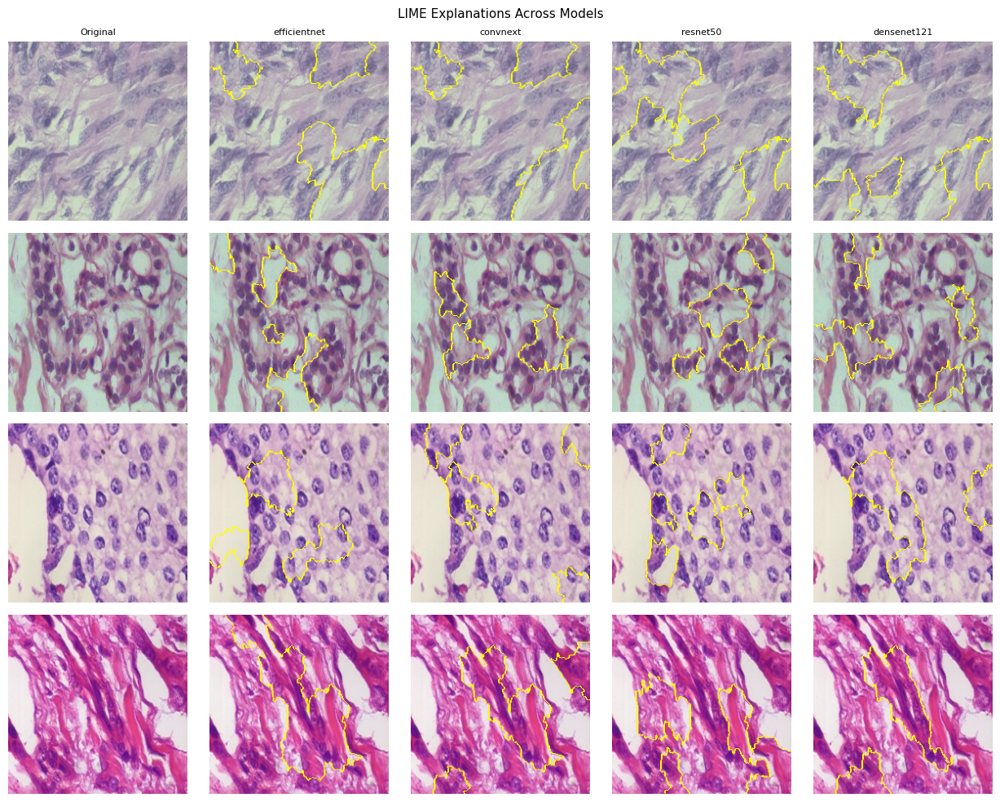

Saved: /content/lime_comparison.png


In [ ]:
from lime import lime_image
from skimage.segmentation import mark_boundaries

def lime_predict_fn(model):
    def predict(images):
        # images: (N, H, W, 3) float64 in [0,1]
        batch = []
        for img in images:
            t = val_tf(Image.fromarray((img * 255).astype(np.uint8)))
            batch.append(t)
        batch = torch.stack(batch).to(device)
        with torch.no_grad():
            probs = torch.softmax(model(batch), dim=1).cpu().numpy()
        return probs
    return predict

explainer = lime_image.LimeImageExplainer()

fig, axes = plt.subplots(n_samples, n_models + 1, figsize=((n_models + 1) * 2.5, n_samples * 2.5))

for col_idx, mname in enumerate(['Original'] + MODEL_NAMES):
    axes[0, col_idx].set_title('Original' if col_idx == 0 else mname.split('_')[0], fontsize=8)

for row_idx in range(n_samples):
    rgb   = sample_rgbs[row_idx]
    label = sample_rows.iloc[row_idx]['label_name']

    axes[row_idx, 0].imshow(rgb)
    axes[row_idx, 0].set_ylabel(label.capitalize(), fontsize=8)
    axes[row_idx, 0].axis('off')

    for col_idx, (mname, model) in enumerate(trained_models.items(), start=1):
        explanation = explainer.explain_instance(
            (rgb * 255).astype(np.uint8),
            lime_predict_fn(model),
            top_labels=2, hide_color=0, num_samples=500
        )
        img_lime, mask = explanation.get_image_and_mask(
            explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False
        )
        axes[row_idx, col_idx].imshow(mark_boundaries(img_lime.astype(np.float32) / 255, mask))
        axes[row_idx, col_idx].axis('off')

plt.suptitle('LIME Explanations Across Models', fontsize=11)
plt.tight_layout()
plt.savefig('/content/lime_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: /content/lime_comparison.png')

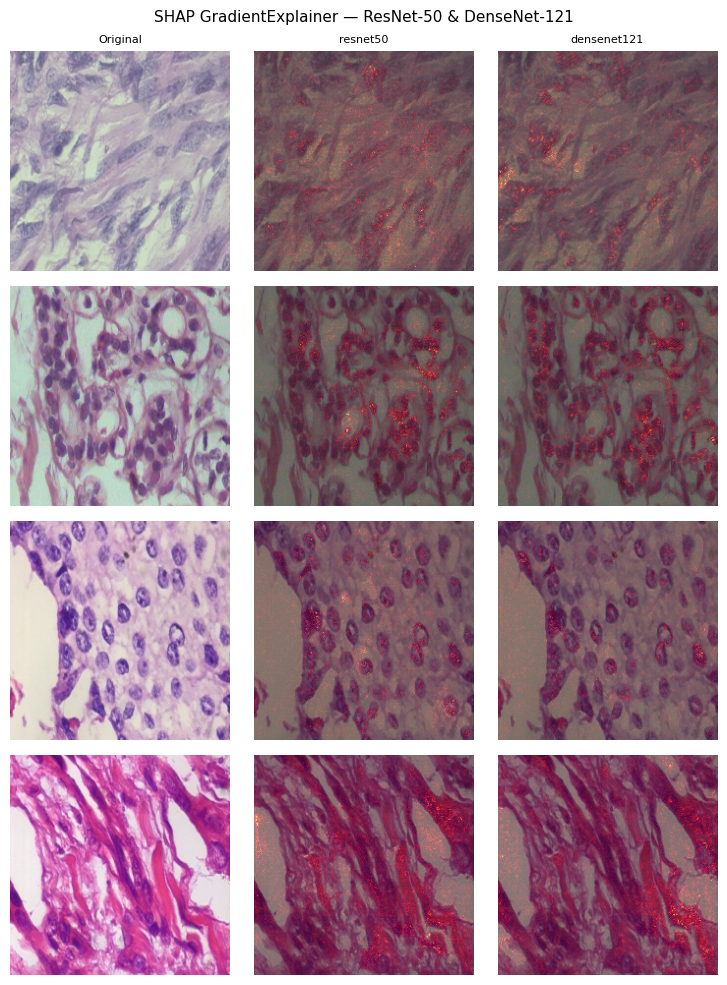

Saved: /content/shap_comparison.png


In [ ]:
import shap

def disable_inplace(model):
    for module in model.modules():
        if hasattr(module, 'inplace'):
            module.inplace = False

bg_imgs = []
for i, row in train_df.sample(50, random_state=SEED).iterrows():
    img = cv2.cvtColor(cv2.imread(row['path']), cv2.COLOR_BGR2RGB)
    bg_imgs.append(val_tf(Image.fromarray(img)))
background = torch.stack(bg_imgs).to(device)

test_input = torch.stack(sample_imgs).to(device)

SHAP_MODELS = ['resnet50', 'densenet121']
n_shap = len(SHAP_MODELS)

fig, axes = plt.subplots(n_samples, n_shap + 1, figsize=((n_shap + 1) * 2.5, n_samples * 2.5))

for col_idx, mname in enumerate(['Original'] + SHAP_MODELS):
    axes[0, col_idx].set_title('Original' if col_idx == 0 else mname.split('_')[0], fontsize=8)

for row_idx in range(n_samples):
    axes[row_idx, 0].imshow(sample_rgbs[row_idx])
    axes[row_idx, 0].set_ylabel(sample_rows.iloc[row_idx]['label_name'].capitalize(), fontsize=8)
    axes[row_idx, 0].axis('off')

for col_idx, mname in enumerate(SHAP_MODELS, start=1):
    model = trained_models[mname]
    model.eval()
    disable_inplace(model)

    explainer = shap.GradientExplainer(model, background)
    shap_vals = explainer.shap_values(test_input)

    for row_idx in range(n_samples):
        label = sample_rows.iloc[row_idx]['label']

        if isinstance(shap_vals, list):
            sv = shap_vals[label][row_idx]
        else:
            # Binary case: shap_vals shape is (N, 3, H, W, 2) — pick the predicted class
            sv = shap_vals[row_idx, :, :, :, label]

        sv = np.array(sv)
        if sv.ndim == 3:
            sv_mean = np.abs(sv).mean(axis=0)   # (3, H, W) → (H, W)
        elif sv.ndim == 2:
            sv_mean = np.abs(sv)                 # already (H, W)
        else:
            sv_mean = np.abs(sv).mean(axis=-1)   # fallback

        sv_norm    = (sv_mean - sv_mean.min()) / (sv_mean.max() - sv_mean.min() + 1e-8)
        sv_resized = cv2.resize(sv_norm.astype(np.float32), (IMG_SIZE, IMG_SIZE))

        axes[row_idx, col_idx].imshow(sample_rgbs[row_idx])
        axes[row_idx, col_idx].imshow(sv_resized, cmap='hot', alpha=0.5)
        axes[row_idx, col_idx].axis('off')

plt.suptitle('SHAP GradientExplainer — ResNet-50 & DenseNet-121', fontsize=11)
plt.tight_layout()
plt.savefig('/content/shap_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: /content/shap_comparison.png')

In [ ]:
test_df['patient'] = test_df['path'].apply(lambda p: '-'.join(Path(p).stem.split('-')[1:3]))

In [ ]:
# Majority-vote aggregation at patient level
from collections import Counter

best_model_name = results_df.loc[results_df['AUC'].idxmax(), 'Model']
best_model      = trained_models[best_model_name]
print(f'Using best model for patient-level: {best_model_name}')

best_model.eval()
patch_preds, patch_labels, patch_patients = [], [], []

for _, row in test_df.iterrows():
    img = cv2.cvtColor(cv2.imread(row['path']), cv2.COLOR_BGR2RGB)
    tensor = val_tf(Image.fromarray(img)).unsqueeze(0).to(device)
    with torch.no_grad():
        pred = best_model(tensor).argmax(1).item()
    patch_preds.append(pred)
    patch_labels.append(row['label'])
    patch_patients.append(row['patient'])

pred_df = pd.DataFrame({'patient': patch_patients, 'true': patch_labels, 'pred': patch_preds})

patient_results = []
for patient, grp in pred_df.groupby('patient'):
    majority_vote = Counter(grp['pred']).most_common(1)[0][0]
    true_label    = grp['true'].iloc[0]
    patient_results.append({'patient': patient, 'true': true_label, 'pred': majority_vote})

pat_df   = pd.DataFrame(patient_results)
pat_acc  = accuracy_score(pat_df['true'], pat_df['pred'])
pat_f1   = f1_score(pat_df['true'], pat_df['pred'])
print(f'\nPatient-level Accuracy : {pat_acc:.4f}')
print(f'Patient-level F1       : {pat_f1:.4f}')
print(f'Patients evaluated     : {len(pat_df)}')

Using best model for patient-level: densenet121

Patient-level Accuracy : 0.9750
Patient-level F1       : 0.9821
Patients evaluated     : 80


In [ ]:
import shutil

SAVE_DIR = '/content/drive/MyDrive/BreakHis_Results'
os.makedirs(SAVE_DIR, exist_ok=True)

files_to_save = [
    '/content/sample_images.png',
    '/content/training_curves.png',
    '/content/gradcam_comparison.png',
    '/content/lime_comparison.png',
    '/content/shap_comparison.png',
    '/content/results_table.csv',
]
for mname in MODEL_NAMES:
    files_to_save.append(f'/content/{mname}_best.pth')

for f in files_to_save:
    if os.path.exists(f):
        shutil.copy(f, SAVE_DIR)
        print(f'Saved: {f} → {SAVE_DIR}')

print('\n=== FINAL RESULTS ===')
print(results_df.to_string(index=False))
print(f'\nBest model: {best_model_name}')
print(f'Patient-level Accuracy: {pat_acc:.4f} | F1: {pat_f1:.4f}')

Saved: /content/sample_images.png → /content/drive/MyDrive/BreakHis_Results
Saved: /content/training_curves.png → /content/drive/MyDrive/BreakHis_Results
Saved: /content/gradcam_comparison.png → /content/drive/MyDrive/BreakHis_Results
Saved: /content/lime_comparison.png → /content/drive/MyDrive/BreakHis_Results
Saved: /content/shap_comparison.png → /content/drive/MyDrive/BreakHis_Results
Saved: /content/results_table.csv → /content/drive/MyDrive/BreakHis_Results
Saved: /content/efficientnet_v2_s_best.pth → /content/drive/MyDrive/BreakHis_Results
Saved: /content/convnext_small_best.pth → /content/drive/MyDrive/BreakHis_Results
Saved: /content/resnet50_best.pth → /content/drive/MyDrive/BreakHis_Results
Saved: /content/densenet121_best.pth → /content/drive/MyDrive/BreakHis_Results

=== FINAL RESULTS ===
            Model  Accuracy      AUC       F1  Sensitivity  Specificity
efficientnet_v2_s  0.959633 0.989191 0.970027      0.96477     0.948864
   convnext_small  0.961468 0.991316 0.97127

In [ ]:
# Clone repo
!git clone https://github.com/KethanSaiV/XAI-Driven-Breast-Cancer-Histopathology-Classification.git

# Enter repo
%cd XAI-Driven-Breast-Cancer-Histopathology-Classification

# Copy notebook into repo
!cp "/content/BreaKHis_v1.ipynb" .

# Git config
!git config --global user.email "kethansai.official@gmail.com"
!git config --global user.name "Kethan Sai"

# Add and commit
!git add .
!git commit -m "Added BreaKHis XAI classification pipeline"

# Authenticate and push
!git remote set-url origin https://YOUR_GITHUB_TOKEN@github.com/KethanSaiV/XAI-Driven-Breast-Cancer-Histopathology-Classification.git
!git push origin main

Cloning into 'XAI-Driven-Breast-Cancer-Histopathology-Classification'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 3 (delta 0), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (3/3), done.
/content/XAI-Driven-Breast-Cancer-Histopathology-Classification
cp: cannot stat '/content/BreaKHis_v1.ipynb': No such file or directory
On branch main
Your branch is up to date with 'origin/main'.

nothing to commit, working tree clean
fatal: could not read Password for 'https://YOUR_GITHUB_TOKEN@github.com': No such device or address


In [ ]:
!find /content -name "*.ipynb"

/content/drive/MyDrive/Colab Notebooks/Untitled0.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled1.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled2.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled3.ipynb
/content/drive/MyDrive/Colab Notebooks/Copy of Untitled3.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled4.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled5.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled6.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled7.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled8.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled9.ipynb
/content/drive/MyDrive/Colab Notebooks/image registration 2.ipynb
/content/drive/MyDrive/Colab Notebooks/image registration 1.ipynb
/content/drive/MyDrive/Colab Notebooks/project_one.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled10.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled11.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled12.ipynb
/content/drive/MyDrive/Colab N

In [ ]:
import os
print(os.getcwd())
!ls

/content/XAI-Driven-Breast-Cancer-Histopathology-Classification
README.md


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!find /content/drive -name "BreaKHis*.ipynb"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
^C


In [ ]:
!find "/content/drive/MyDrive" -name "*BreaKHis*"


/content/drive/MyDrive/Colab Notebooks/BreaKHis_v1
/content/drive/MyDrive/BreaKHis_v1.zip
^C


In [ ]:
import os
os.getcwd()

'/content/XAI-Driven-Breast-Cancer-Histopathology-Classification'

In [ ]:
!find /content -name "*.ipynb" 2>/dev/null

/content/drive/MyDrive/Colab Notebooks/Untitled0.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled1.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled2.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled3.ipynb
/content/drive/MyDrive/Colab Notebooks/Copy of Untitled3.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled4.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled5.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled6.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled7.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled8.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled9.ipynb
/content/drive/MyDrive/Colab Notebooks/image registration 2.ipynb
/content/drive/MyDrive/Colab Notebooks/image registration 1.ipynb
/content/drive/MyDrive/Colab Notebooks/project_one.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled10.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled11.ipynb
/content/drive/MyDrive/Colab Notebooks/Untitled12.ipynb
/content/drive/MyDrive/Colab N

In [ ]:
!grep -l "BreaKHis" "/content/drive/MyDrive/Colab Notebooks/"*.ipynb

In [ ]:
# v2: build_model with dropout
def build_model(name, num_classes=2, pretrained=True):
    weights = 'DEFAULT' if pretrained else None

    if name == 'efficientnet_v2_s':
        m = models.efficientnet_v2_s(weights=weights)
        m.classifier = nn.Sequential(
            nn.Dropout(p=0.3),
            nn.Linear(m.classifier[1].in_features, num_classes)
        )
    elif name == 'convnext_small':
        m = models.convnext_small(weights=weights)
        m.classifier = nn.Sequential(
            nn.Flatten(1),
            nn.Dropout(p=0.3),
            nn.Linear(m.classifier[2].in_features, num_classes)
        )
    elif name == 'resnet50':
        m = models.resnet50(weights=weights)
        m.fc = nn.Sequential(
            nn.Dropout(p=0.3),
            nn.Linear(m.fc.in_features, num_classes)
        )
    elif name == 'densenet121':
        m = models.densenet121(weights=weights)
        m.classifier = nn.Sequential(
            nn.Dropout(p=0.3),
            nn.Linear(m.classifier.in_features, num_classes)
        )
    else:
        raise ValueError(f'Unknown model: {name}')

    return m.to(device)

In [ ]:
# v2: stronger augmentation
train_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE + 32, IMG_SIZE + 32)),
    transforms.RandomCrop(IMG_SIZE),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.08),
    transforms.RandomGrayscale(p=0.05),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
    transforms.RandomErasing(p=0.2, scale=(0.02, 0.1)),
])

# rebuild datasets and loaders with new augmentation
train_ds_v2 = BreakHisDataset(train_df, transform=train_tf, normalize_stain=True)
train_loader_v2 = DataLoader(train_ds_v2, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)
print('New train loader ready with stronger augmentation.')

New train loader ready with stronger augmentation.


In [ ]:
# v2: train_model with early stopping + gradual unfreeze
def train_model(model_name):
    print(f'\n{"="*50}\nTraining v2: {model_name}\n{"="*50}')
    model = build_model(model_name)
    criterion = nn.CrossEntropyLoss()

    # Phase 1: freeze backbone
    if model_name == 'efficientnet_v2_s':
        for p in model.features.parameters(): p.requires_grad = False
    elif model_name == 'convnext_small':
        for p in model.features.parameters(): p.requires_grad = False
    elif model_name == 'resnet50':
        for name, p in model.named_parameters():
            if not any(x in name for x in ['layer4', 'fc']): p.requires_grad = False
    elif model_name == 'densenet121':
        for name, p in model.named_parameters():
            if not any(x in name for x in ['denseblock4', 'classifier']): p.requires_grad = False

    optimizer = torch.optim.AdamW(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=1e-4, weight_decay=1e-4
    )
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

    best_val_auc, best_weights = 0, None
    patience_counter = 0
    PATIENCE, UNFREEZE_EPOCH = 5, 5
    history = []

    for epoch in range(1, EPOCHS + 1):

        if epoch == UNFREEZE_EPOCH + 1:
            print(f'  >> Unfreezing last 2 blocks at epoch {epoch}')
            if model_name == 'efficientnet_v2_s':
                for p in model.features[-2:].parameters(): p.requires_grad = True
            elif model_name == 'convnext_small':
                for p in model.features[-2:].parameters(): p.requires_grad = True
            elif model_name == 'resnet50':
                for p in model.layer3.parameters(): p.requires_grad = True
                for p in model.layer4.parameters(): p.requires_grad = True
            elif model_name == 'densenet121':
                for p in model.features.denseblock3.parameters(): p.requires_grad = True
                for p in model.features.denseblock4.parameters(): p.requires_grad = True
            optimizer = torch.optim.AdamW(
                filter(lambda p: p.requires_grad, model.parameters()),
                lr=1e-4, weight_decay=1e-4
            )
            scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
                optimizer, T_max=EPOCHS - UNFREEZE_EPOCH
            )

        t0 = time.time()
        tr_loss, tr_acc = train_one_epoch(model, train_loader_v2, criterion, optimizer)
        vl_loss, vl_acc, vl_auc, vl_f1 = evaluate(model, val_loader, criterion)
        scheduler.step()

        history.append({'epoch': epoch, 'tr_loss': tr_loss, 'tr_acc': tr_acc,
                        'vl_loss': vl_loss, 'vl_acc': vl_acc, 'vl_auc': vl_auc, 'vl_f1': vl_f1})

        if vl_auc > best_val_auc:
            best_val_auc = vl_auc
            best_weights = copy.deepcopy(model.state_dict())
            patience_counter = 0
        else:
            patience_counter += 1

        print(f'Epoch {epoch:02d}/{EPOCHS} | '
              f'Tr Loss: {tr_loss:.4f} Acc: {tr_acc:.4f} | '
              f'Val Loss: {vl_loss:.4f} Acc: {vl_acc:.4f} AUC: {vl_auc:.4f} F1: {vl_f1:.4f} | '
              f'{time.time()-t0:.1f}s | Patience: {patience_counter}/{PATIENCE}')

        if patience_counter >= PATIENCE:
            print(f'  >> Early stopping at epoch {epoch}')
            break

    model.load_state_dict(best_weights)
    save_path = f'/content/{model_name}_v2_best.pth'
    torch.save(best_weights, save_path)
    print(f'Best model saved: {save_path} (Val AUC: {best_val_auc:.4f})')
    return model, history

# retrain all 4
trained_models_v2 = {}
all_histories_v2 = {}
for mname in MODEL_NAMES:
    model, history = train_model(mname)
    trained_models_v2[mname] = model
    all_histories_v2[mname] = history


Training v2: efficientnet_v2_s
Epoch 01/20 | Tr Loss: 0.6814 Acc: 0.5631 | Val Loss: 0.6460 Acc: 0.6416 AUC: 0.5577 F1: 0.7634 | 38.2s | Patience: 0/5
Epoch 02/20 | Tr Loss: 0.6383 Acc: 0.6492 | Val Loss: 0.6214 Acc: 0.6647 AUC: 0.6171 F1: 0.7914 | 25.7s | Patience: 0/5
Epoch 03/20 | Tr Loss: 0.6282 Acc: 0.6605 | Val Loss: 0.5996 Acc: 0.6936 AUC: 0.6992 F1: 0.8059 | 27.0s | Patience: 0/5
Epoch 04/20 | Tr Loss: 0.6143 Acc: 0.6800 | Val Loss: 0.5924 Acc: 0.7052 AUC: 0.7141 F1: 0.8159 | 27.0s | Patience: 0/5
Epoch 05/20 | Tr Loss: 0.5981 Acc: 0.6933 | Val Loss: 0.5810 Acc: 0.7341 AUC: 0.7485 F1: 0.8284 | 28.1s | Patience: 0/5
  >> Unfreezing last 2 blocks at epoch 6
Epoch 06/20 | Tr Loss: 0.5328 Acc: 0.7610 | Val Loss: 0.4409 Acc: 0.7977 AUC: 0.8665 F1: 0.8669 | 27.7s | Patience: 0/5
Epoch 07/20 | Tr Loss: 0.4194 Acc: 0.8195 | Val Loss: 0.3480 Acc: 0.8555 AUC: 0.9350 F1: 0.9012 | 27.6s | Patience: 0/5
Epoch 08/20 | Tr Loss: 0.3298 Acc: 0.8585 | Val Loss: 0.2667 Acc: 0.9075 AUC: 0.9550 F1

In [ ]:
# check ConvNeXt classifier structure before fixing
import torchvision.models as models
temp = models.convnext_small(weights='DEFAULT')
print(temp.classifier)
print('in_features:', temp.classifier[2].in_features)

Sequential(
  (0): LayerNorm2d((768,), eps=1e-06, elementwise_affine=True)
  (1): Flatten(start_dim=1, end_dim=-1)
  (2): Linear(in_features=768, out_features=1000, bias=True)
)
in_features: 768


In [ ]:
# v3: fix ConvNeXt classifier — run this cell then retrain convnext only
def build_model(name, num_classes=2, pretrained=True):
    weights = 'DEFAULT' if pretrained else None

    if name == 'efficientnet_v2_s':
        m = models.efficientnet_v2_s(weights=weights)
        m.classifier = nn.Sequential(
            nn.Dropout(p=0.3),
            nn.Linear(m.classifier[1].in_features, num_classes)
        )
    elif name == 'convnext_small':
        m = models.convnext_small(weights=weights)
        in_features = m.classifier[2].in_features
        # keep LayerNorm + Flatten, just replace Linear + add Dropout
        m.classifier[2] = nn.Sequential(
            nn.Dropout(p=0.3),
            nn.Linear(in_features, num_classes)
        )
    elif name == 'resnet50':
        m = models.resnet50(weights=weights)
        m.fc = nn.Sequential(
            nn.Dropout(p=0.3),
            nn.Linear(m.fc.in_features, num_classes)
        )
    elif name == 'densenet121':
        m = models.densenet121(weights=weights)
        m.classifier = nn.Sequential(
            nn.Dropout(p=0.3),
            nn.Linear(m.classifier.in_features, num_classes)
        )
    else:
        raise ValueError(f'Unknown model: {name}')

    return m.to(device)

# retrain convnext only
model, history = train_model('convnext_small')
trained_models_v2['convnext_small'] = model
all_histories_v2['convnext_small'] = history


Training v2: convnext_small
Epoch 01/20 | Tr Loss: 0.6850 Acc: 0.5631 | Val Loss: 0.6535 Acc: 0.6532 AUC: 0.4942 F1: 0.7842 | 34.1s | Patience: 0/5
Epoch 02/20 | Tr Loss: 0.6083 Acc: 0.6851 | Val Loss: 0.6166 Acc: 0.6647 AUC: 0.5981 F1: 0.7943 | 27.2s | Patience: 0/5
Epoch 03/20 | Tr Loss: 0.5776 Acc: 0.7056 | Val Loss: 0.5878 Acc: 0.7110 AUC: 0.6787 F1: 0.8214 | 27.2s | Patience: 0/5
Epoch 04/20 | Tr Loss: 0.5579 Acc: 0.7159 | Val Loss: 0.5644 Acc: 0.7225 AUC: 0.7259 F1: 0.8273 | 28.8s | Patience: 0/5
Epoch 05/20 | Tr Loss: 0.5327 Acc: 0.7395 | Val Loss: 0.5448 Acc: 0.7803 AUC: 0.7566 F1: 0.8593 | 27.9s | Patience: 0/5
  >> Unfreezing last 2 blocks at epoch 6
Epoch 06/20 | Tr Loss: 0.4669 Acc: 0.7928 | Val Loss: 0.4046 Acc: 0.8324 AUC: 0.8562 F1: 0.8826 | 28.4s | Patience: 0/5
Epoch 07/20 | Tr Loss: 0.3658 Acc: 0.8421 | Val Loss: 0.3588 Acc: 0.8497 AUC: 0.8951 F1: 0.8934 | 28.9s | Patience: 0/5
Epoch 08/20 | Tr Loss: 0.3247 Acc: 0.8687 | Val Loss: 0.3263 Acc: 0.8555 AUC: 0.9200 F1: 0

In [ ]:
# evaluate v2 models on test set + compare v1 vs v2
results_v2 = []
for mname, model in trained_models_v2.items():
    criterion = nn.CrossEntropyLoss()
    _, acc, auc, f1 = evaluate(model, test_loader, criterion)

    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for imgs, labels in test_loader:
            out = model(imgs.to(device))
            all_preds.extend(out.argmax(1).cpu().numpy())
            all_labels.extend(labels.numpy())

    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0

    results_v2.append({'Model': mname, 'Accuracy': acc, 'AUC': auc,
                       'F1': f1, 'Sensitivity': sensitivity, 'Specificity': specificity})
    print(f'{mname}: Acc={acc:.4f} AUC={auc:.4f} F1={f1:.4f} Se={sensitivity:.4f} Sp={specificity:.4f}')

results_v2_df = pd.DataFrame(results_v2)

# side by side comparison
print('\n--- V1 vs V2 Test Results ---')
for _, row in results_df.iterrows():
    mname = row['Model']
    v2_row = results_v2_df[results_v2_df['Model'] == mname]
    if len(v2_row) == 0:
        continue
    v2_row = v2_row.iloc[0]
    print(f'\n{mname}:')
    print(f'  V1: Acc={row["Accuracy"]:.4f} AUC={row["AUC"]:.4f} F1={row["F1"]:.4f} Se={row["Sensitivity"]:.4f} Sp={row["Specificity"]:.4f}')
    print(f'  V2: Acc={v2_row["Accuracy"]:.4f} AUC={v2_row["AUC"]:.4f} F1={v2_row["F1"]:.4f} Se={v2_row["Sensitivity"]:.4f} Sp={v2_row["Specificity"]:.4f}')

results_v2_df.to_csv('/content/results_table_v2.csv', index=False)
print('\nSaved to /content/results_table_v2.csv')

efficientnet_v2_s: Acc=0.9229 AUC=0.9710 F1=0.9444 Se=0.9675 Sp=0.8295
convnext_small: Acc=0.8954 AUC=0.9481 F1=0.9229 Se=0.9241 Sp=0.8352
resnet50: Acc=0.9486 AUC=0.9871 F1=0.9624 Se=0.9702 Sp=0.9034
densenet121: Acc=0.9303 AUC=0.9841 F1=0.9475 Se=0.9295 Sp=0.9318

--- V1 vs V2 Test Results ---

efficientnet_v2_s:
  V1: Acc=0.9596 AUC=0.9892 F1=0.9700 Se=0.9648 Sp=0.9489
  V2: Acc=0.9229 AUC=0.9710 F1=0.9444 Se=0.9675 Sp=0.8295

convnext_small:
  V1: Acc=0.9615 AUC=0.9913 F1=0.9713 Se=0.9621 Sp=0.9602
  V2: Acc=0.8954 AUC=0.9481 F1=0.9229 Se=0.9241 Sp=0.8352

resnet50:
  V1: Acc=0.9706 AUC=0.9921 F1=0.9785 Se=0.9864 Sp=0.9375
  V2: Acc=0.9486 AUC=0.9871 F1=0.9624 Se=0.9702 Sp=0.9034

densenet121:
  V1: Acc=0.9633 AUC=0.9946 F1=0.9728 Se=0.9675 Sp=0.9545
  V2: Acc=0.9303 AUC=0.9841 F1=0.9475 Se=0.9295 Sp=0.9318

Saved to /content/results_table_v2.csv


In [ ]:
# ensemble: average softmax probabilities from all 4 V1 models
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, confusion_matrix

@torch.no_grad()
def ensemble_evaluate(models_dict, loader):
    all_probs = []
    all_labels = []

    # collect labels once
    for imgs, labels in loader:
        all_labels.extend(labels.numpy())

    # collect probs from each model
    for mname, model in models_dict.items():
        model.eval()
        probs_this_model = []
        for imgs, labels in loader:
            imgs = imgs.to(device)
            out = model(imgs)
            probs = torch.softmax(out, dim=1)[:, 1].cpu().numpy()
            probs_this_model.extend(probs)
        all_probs.append(probs_this_model)

    # average across models
    avg_probs = np.mean(all_probs, axis=0)
    preds = (avg_probs >= 0.5).astype(int)

    acc = accuracy_score(all_labels, preds)
    auc = roc_auc_score(all_labels, avg_probs)
    f1  = f1_score(all_labels, preds)

    cm = confusion_matrix(all_labels, preds)
    tn, fp, fn, tp = cm.ravel()
    se = tp / (tp + fn)
    sp = tn / (tn + fp)

    return acc, auc, f1, se, sp, avg_probs, all_labels

acc, auc, f1, se, sp, ens_probs, ens_labels = ensemble_evaluate(trained_models, test_loader)
print(f'\nEnsemble (V1, 4 models):')
print(f'Acc={acc:.4f} AUC={auc:.4f} F1={f1:.4f} Se={se:.4f} Sp={sp:.4f}')

# compare against best individual V1 model
print(f'\nBest individual (DenseNet-121 V1):')
print(f'Acc=0.9633 AUC=0.9946 F1=0.9728 Se=0.9675 Sp=0.9545')


Ensemble (V1, 4 models):
Acc=0.9670 AUC=0.9958 F1=0.9756 Se=0.9756 Sp=0.9489

Best individual (DenseNet-121 V1):
Acc=0.9633 AUC=0.9946 F1=0.9728 Se=0.9675 Sp=0.9545


In [ ]:
from pathlib import Path

# BreakHis filename format: SOB_[B/M]_[subtype]-[patient]-[mag]-[frame].png
# subtype codes:
SUBTYPE_MAP = {
    # benign
    'A'  : 'Adenosis',
    'F'  : 'Fibroadenoma',
    'PT' : 'Phyllodes Tumor',
    'TA' : 'Tubular Adenoma',
    # malignant
    'DC' : 'Ductal Carcinoma',
    'LC' : 'Lobular Carcinoma',
    'MC' : 'Mucinous Carcinoma',
    'PC' : 'Papillary Carcinoma',
}

def extract_subtype(path_str):
    stem = Path(path_str).stem          # e.g. SOB_B_F-14-29960-400-001
    parts = stem.split('_')             # ['SOB', 'B', 'F-14-29960-400-001']
    subtype_code = parts[2].split('-')[0]  # 'F'
    return SUBTYPE_MAP.get(subtype_code, f'Unknown({subtype_code})')

# add subtype column to test_df
test_df['subtype'] = test_df['path'].apply(extract_subtype)
print(test_df['subtype'].value_counts())
print(f'\nUnique subtypes found: {test_df["subtype"].nunique()}')
print(f'Any unknowns: {(test_df["subtype"].str.startswith("Unknown")).sum()}')

subtype
Ductal Carcinoma       248
Fibroadenoma            74
Mucinous Carcinoma      50
Papillary Carcinoma     44
Phyllodes Tumor         39
Tubular Adenoma         33
Adenosis                30
Lobular Carcinoma       27
Name: count, dtype: int64

Unique subtypes found: 8
Any unknowns: 0


            Subtype     Class   N  DenseNet121_Acc  Ensemble_Acc  DenseNet121_Errors  Ensemble_Errors
Papillary Carcinoma Malignant  44           0.8864        0.9091                   5                4
 Mucinous Carcinoma Malignant  50           0.9200        0.9200                   4                4
       Fibroadenoma    Benign  74           0.9324        0.9324                   5                5
           Adenosis    Benign  30           0.9667        0.9333                   1                2
    Tubular Adenoma    Benign  33           0.9697        0.9697                   1                1
    Phyllodes Tumor    Benign  39           0.9744        0.9744                   1                1
   Ductal Carcinoma Malignant 248           0.9879        0.9960                   3                1
  Lobular Carcinoma Malignant  27           1.0000        1.0000                   0                0

--- Misclassification Direction ---
Adenosis                  (Benign   ) → miscl

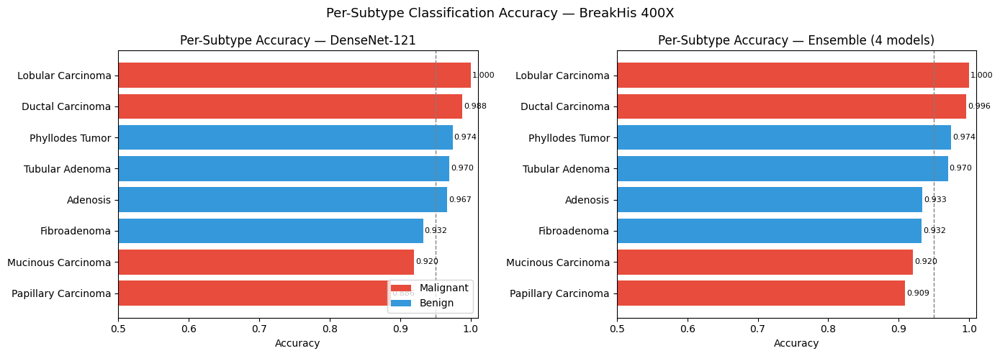

Saved: /content/subtype_accuracy.png


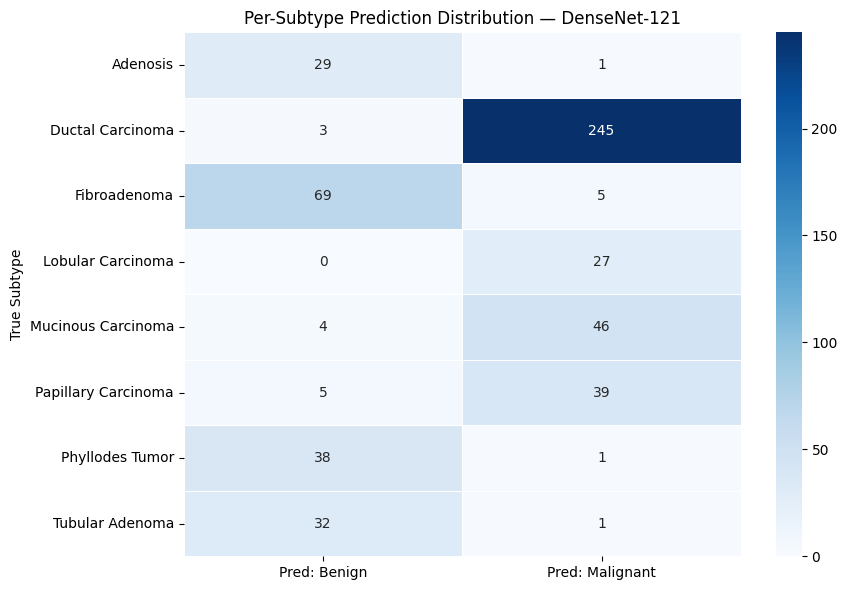

Saved: /content/subtype_confusion_heatmap.png


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# ── 1. get predictions from best individual model (DenseNet-121) + ensemble ──
best_model = trained_models['densenet121']
best_model.eval()

test_preds_dn, test_probs_dn, test_labels_gt = [], [], []
with torch.no_grad():
    for imgs, labels in test_loader:
        out = best_model(imgs.to(device))
        probs = torch.softmax(out, dim=1)[:, 1].cpu().numpy()
        test_preds_dn.extend(out.argmax(1).cpu().numpy())
        test_probs_dn.extend(probs)
        test_labels_gt.extend(labels.numpy())

# ensemble preds (reuse ens_probs from earlier)
ens_preds = (np.array(ens_probs) >= 0.5).astype(int)

# attach to test_df (test_loader is not shuffled so order is preserved)
test_df_eval = test_df.copy().reset_index(drop=True)
test_df_eval['true_label']    = test_labels_gt
test_df_eval['dn_pred']       = test_preds_dn
test_df_eval['ens_pred']      = ens_preds
test_df_eval['dn_correct']    = (test_df_eval['true_label'] == test_df_eval['dn_pred']).astype(int)
test_df_eval['ens_correct']   = (test_df_eval['true_label'] == test_df_eval['ens_pred']).astype(int)

# ── 2. per-subtype accuracy table ──
subtype_stats = []
for subtype, grp in test_df_eval.groupby('subtype'):
    n        = len(grp)
    dn_acc   = grp['dn_correct'].mean()
    ens_acc  = grp['ens_correct'].mean()
    n_wrong_dn  = (grp['dn_correct'] == 0).sum()
    n_wrong_ens = (grp['ens_correct'] == 0).sum()
    true_class  = 'Malignant' if grp['label'].iloc[0] == 1 else 'Benign'
    subtype_stats.append({
        'Subtype': subtype, 'Class': true_class, 'N': n,
        'DenseNet121_Acc': round(dn_acc, 4),
        'Ensemble_Acc':    round(ens_acc, 4),
        'DenseNet121_Errors': n_wrong_dn,
        'Ensemble_Errors':   n_wrong_ens,
    })

subtype_df = pd.DataFrame(subtype_stats).sort_values('DenseNet121_Acc')
print(subtype_df.to_string(index=False))
subtype_df.to_csv('/content/subtype_accuracy.csv', index=False)

# ── 3. misclassification direction (what does each subtype get confused AS) ──
print('\n--- Misclassification Direction ---')
for subtype, grp in test_df_eval.groupby('subtype'):
    wrong = grp[grp['dn_correct'] == 0]
    if len(wrong) == 0:
        continue
    true_class = 'Malignant' if grp['label'].iloc[0] == 1 else 'Benign'
    confused_as = 'Malignant' if wrong['dn_pred'].iloc[0] == 1 else 'Benign'
    print(f'{subtype:25s} ({true_class:9s}) → misclassified as {confused_as} [{len(wrong)}/{len(grp)} errors]')

# ── 4. visualize per-subtype accuracy ──
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

colors = ['#e74c3c' if c == 'Malignant' else '#3498db'
          for c in subtype_df['Class']]

for ax, col, title in zip(axes,
                           ['DenseNet121_Acc', 'Ensemble_Acc'],
                           ['DenseNet-121', 'Ensemble (4 models)']):
    bars = ax.barh(subtype_df['Subtype'], subtype_df[col], color=colors)
    ax.axvline(x=0.95, color='gray', linestyle='--', linewidth=1, label='95% threshold')
    ax.set_xlim(0.5, 1.01)
    ax.set_xlabel('Accuracy')
    ax.set_title(f'Per-Subtype Accuracy — {title}')
    for bar, val in zip(bars, subtype_df[col]):
        ax.text(bar.get_width() + 0.002, bar.get_y() + bar.get_height()/2,
                f'{val:.3f}', va='center', fontsize=8)

# legend
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor='#e74c3c', label='Malignant'),
                   Patch(facecolor='#3498db', label='Benign')]
axes[0].legend(handles=legend_elements, loc='lower right')

plt.suptitle('Per-Subtype Classification Accuracy — BreakHis 400X', fontsize=13)
plt.tight_layout()
plt.savefig('/content/subtype_accuracy.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: /content/subtype_accuracy.png')

# ── 5. subtype confusion heatmap ──
fig, ax = plt.subplots(figsize=(9, 6))
subtype_order = sorted(test_df_eval['subtype'].unique())
conf_matrix = pd.crosstab(
    test_df_eval['subtype'].map(lambda x: x),
    test_df_eval['dn_pred'].map({0: 'Pred: Benign', 1: 'Pred: Malignant'}),
    rownames=['True Subtype'], colnames=['']
)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            linewidths=0.5, ax=ax)
ax.set_title('Per-Subtype Prediction Distribution — DenseNet-121', fontsize=12)
plt.tight_layout()
plt.savefig('/content/subtype_confusion_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: /content/subtype_confusion_heatmap.png')

In [ ]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

# ── pull failure cases for the 3 most interesting subtypes ──
FOCUS_SUBTYPES = {
    'Papillary Carcinoma': {'true': 1, 'reason': 'Malignant → missed as Benign (dangerous FN)'},
    'Mucinous Carcinoma':  {'true': 1, 'reason': 'Malignant → missed as Benign (dangerous FN)'},
    'Fibroadenoma':        {'true': 0, 'reason': 'Benign → called Malignant (FP)'},
}

failure_samples = {}
for subtype, info in FOCUS_SUBTYPES.items():
    wrong = test_df_eval[
        (test_df_eval['subtype'] == subtype) &
        (test_df_eval['dn_correct'] == 0)
    ].reset_index(drop=True)
    failure_samples[subtype] = wrong
    print(f'{subtype}: {len(wrong)} failure cases')
    print(wrong[['path', 'true_label', 'dn_pred']].to_string())
    print()


Papillary Carcinoma: 5 failure cases
                                                                            path  true_label  dn_pred
0  /content/breakhis/BreaKHis 400X/test/malignant/SOB_M_PC-14-15687B-400-002.png           1        0
1    /content/breakhis/BreaKHis 400X/test/malignant/SOB_M_PC-14-9146-400-004.png           1        0
2   /content/breakhis/BreaKHis 400X/test/malignant/SOB_M_PC-15-190EF-400-009.png           1        0
3   /content/breakhis/BreaKHis 400X/test/malignant/SOB_M_PC-15-190EF-400-015.png           1        0
4    /content/breakhis/BreaKHis 400X/test/malignant/SOB_M_PC-14-9146-400-005.png           1        0

Mucinous Carcinoma: 4 failure cases
                                                                            path  true_label  dn_pred
0   /content/breakhis/BreaKHis 400X/test/malignant/SOB_M_MC-14-12773-400-018.png           1        0
1  /content/breakhis/BreaKHis 400X/test/malignant/SOB_M_MC-14-18842D-400-011.png           1        0
2   /con

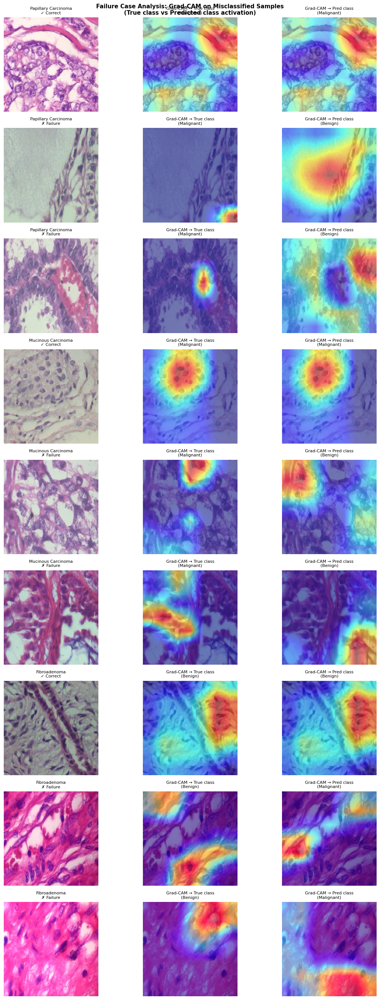

Saved: /content/failure_gradcam.png


In [ ]:
# ── Grad-CAM on failure cases: correct vs incorrect side by side ──
def get_target_layer_dn(model):
    return [model.features.denseblock4]

fig_rows = []
for subtype, info in FOCUS_SUBTYPES.items():
    wrong_cases = failure_samples[subtype]
    # also grab 1 correct case from same subtype for comparison
    correct_cases = test_df_eval[
        (test_df_eval['subtype'] == subtype) &
        (test_df_eval['dn_correct'] == 1)
    ].sample(1, random_state=SEED).reset_index(drop=True)

    for case_type, cases in [('Correct', correct_cases), ('Failure', wrong_cases.head(2))]:
        for _, row in cases.iterrows():
            fig_rows.append({
                'subtype': subtype,
                'case_type': case_type,
                'path': row['path'],
                'true_label': row['true_label'],
                'dn_pred': row['dn_pred'],
                'reason': info['reason']
            })

n_rows = len(fig_rows)
fig, axes = plt.subplots(n_rows, 3, figsize=(12, n_rows * 3))

cam = GradCAM(model=best_model, target_layers=get_target_layer_dn(best_model))

for row_idx, case in enumerate(fig_rows):
    img_raw = cv2.cvtColor(cv2.imread(case['path']), cv2.COLOR_BGR2RGB)
    img_raw = cv2.resize(img_raw, (IMG_SIZE, IMG_SIZE))
    rgb = img_raw.astype(np.float32) / 255.0
    tensor = val_tf(Image.fromarray(img_raw)).unsqueeze(0).to(device)

    # gradcam for true class
    true_target = [ClassifierOutputTarget(case['true_label'])]
    gc_true = cam(input_tensor=tensor, targets=true_target)[0]
    viz_true = show_cam_on_image(rgb, gc_true, use_rgb=True)

    # gradcam for predicted class
    pred_target = [ClassifierOutputTarget(case['dn_pred'])]
    gc_pred = cam(input_tensor=tensor, targets=pred_target)[0]
    viz_pred = show_cam_on_image(rgb, gc_pred, use_rgb=True)

    true_name = 'Malignant' if case['true_label'] == 1 else 'Benign'
    pred_name = 'Malignant' if case['dn_pred'] == 1 else 'Benign'
    status = '✓ Correct' if case['case_type'] == 'Correct' else '✗ Failure'

    axes[row_idx, 0].imshow(rgb)
    axes[row_idx, 0].set_title(f"{case['subtype']}\n{status}", fontsize=8)
    axes[row_idx, 0].set_ylabel(f"True: {true_name}\nPred: {pred_name}", fontsize=7)
    axes[row_idx, 0].axis('off')

    axes[row_idx, 1].imshow(viz_true)
    axes[row_idx, 1].set_title(f'Grad-CAM → True class\n({true_name})', fontsize=8)
    axes[row_idx, 1].axis('off')

    axes[row_idx, 2].imshow(viz_pred)
    axes[row_idx, 2].set_title(f'Grad-CAM → Pred class\n({pred_name})', fontsize=8)
    axes[row_idx, 2].axis('off')

plt.suptitle('Failure Case Analysis: Grad-CAM on Misclassified Samples\n(True class vs Predicted class activation)',
             fontsize=11, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/failure_gradcam.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: /content/failure_gradcam.png')

Models for quantus evaluation: ['convnext_small', 'resnet50', 'densenet121']
Inplace ops disabled.
Eval batch: (50, 3, 224, 224), labels: (50,)

Evaluating: convnext_small
  XAI: gradcam
    FC=nan  Complexity=nan
  XAI: gradcam++
    FC=nan  Complexity=nan

Evaluating: resnet50
  XAI: gradcam
    FC=0.0292  Complexity=11.4454
  XAI: gradcam++
    FC=0.0681  Complexity=11.5181

Evaluating: densenet121
  XAI: gradcam
    FC=-0.0205  Complexity=11.6611
  XAI: gradcam++
    FC=-0.0264  Complexity=11.7756

--- Quantitative XAI Results ---
         Model XAI_Method  Faithfulness_Correlation  Complexity
convnext_small    gradcam                       NaN         NaN
convnext_small  gradcam++                       NaN         NaN
      resnet50    gradcam                    0.0292     11.4454
      resnet50  gradcam++                    0.0681     11.5181
   densenet121    gradcam                   -0.0205     11.6611
   densenet121  gradcam++                   -0.0264     11.7756
Saved: /con

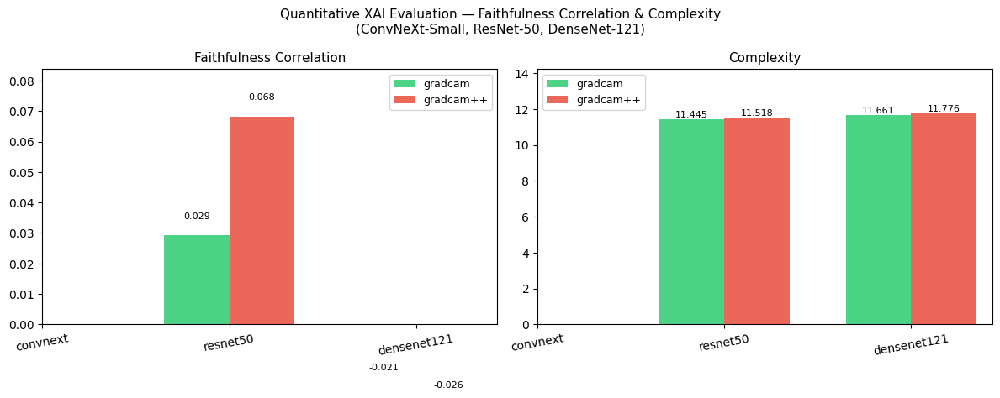

Saved: /content/quantus_results.png


In [ ]:
import quantus
import warnings
warnings.filterwarnings('ignore')
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus

# ── only models compatible with gradient-based CAM ──
QUANTUS_MODELS = {k: v for k, v in trained_models.items()
                  if k != 'efficientnet_v2_s'}
print(f'Models for quantus evaluation: {list(QUANTUS_MODELS.keys())}')

# ── disable inplace for these models ──
def disable_inplace(model):
    for module in model.modules():
        if hasattr(module, 'inplace'):
            module.inplace = False

for mname, model in QUANTUS_MODELS.items():
    disable_inplace(model)
    model.eval()
print('Inplace ops disabled.')

# ── prepare eval batch ──
eval_indices = (
    test_df_eval[test_df_eval['label'] == 0].sample(25, random_state=SEED).index.tolist() +
    test_df_eval[test_df_eval['label'] == 1].sample(25, random_state=SEED).index.tolist()
)
eval_df = test_df_eval.loc[eval_indices].reset_index(drop=True)

eval_imgs, eval_labels = [], []
for _, row in eval_df.iterrows():
    img = cv2.cvtColor(cv2.imread(row['path']), cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    tensor = val_tf(Image.fromarray(img))
    eval_imgs.append(tensor.numpy())
    eval_labels.append(row['label'])

x_batch = np.stack(eval_imgs)
y_batch = np.array(eval_labels)
print(f'Eval batch: {x_batch.shape}, labels: {y_batch.shape}')

# ── attribution function ──
def get_attributions(model, mname, x_batch_np, method='gradcam'):
    disable_inplace(model)
    model.eval()
    target_layers = get_target_layer(model, mname)
    CAMClass = GradCAM if method == 'gradcam' else GradCAMPlusPlus
    attrs = []
    for i in range(len(x_batch_np)):
        inp = torch.tensor(x_batch_np[i:i+1].copy()).float().to(device)
        label = int(y_batch[i])
        try:
            with torch.enable_grad():
                cam_obj = CAMClass(model=model, target_layers=target_layers)
                grayscale = cam_obj(
                    input_tensor=inp,
                    targets=[ClassifierOutputTarget(label)]
                )[0]
        except Exception as e:
            print(f'    CAM failed sample {i}: {e}')
            grayscale = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
        attr = np.stack([grayscale, grayscale, grayscale], axis=0)
        attrs.append(attr)
    return np.stack(attrs)

# ── quantus evaluation ──
results_quantus = []

for mname, model in QUANTUS_MODELS.items():
    disable_inplace(model)
    model.eval()
    print(f'\nEvaluating: {mname}')
    x_tensor = x_batch.copy()

    for xai_name in ['gradcam', 'gradcam++']:
        print(f'  XAI: {xai_name}')
        a_batch = get_attributions(model, mname, x_tensor, method=xai_name)

        # check attributions are non-zero
        if np.all(a_batch == 0):
            print(f'    All-zero attributions, skipping.')
            results_quantus.append({
                'Model': mname, 'XAI_Method': xai_name,
                'Faithfulness_Correlation': float('nan'),
                'Complexity': float('nan'),
            })
            continue

        # Faithfulness Correlation
        try:
            fc = quantus.FaithfulnessCorrelation(
                nr_runs=10,
                subset_size=224,
                perturb_baseline='mean',
                similarity_func=quantus.similarity_func.correlation_pearson,
                abs=False,
                normalise=True,
                return_aggregate=True,
            )
            fc_score = fc(
                model=model,
                x_batch=x_tensor,
                y_batch=y_batch,
                a_batch=a_batch,
                device=device,
            )
            fc_val = float(np.mean(fc_score))
        except Exception as e:
            print(f'    FC error: {e}')
            fc_val = float('nan')

        # Complexity
        try:
            comp = quantus.Complexity(
                normalise=True,
                abs=True,
                return_aggregate=True,
            )
            comp_score = comp(
                model=model,
                x_batch=x_tensor,
                y_batch=y_batch,
                a_batch=a_batch,
                device=device,
            )
            comp_val = float(np.mean(comp_score))
        except Exception as e:
            print(f'    Complexity error: {e}')
            comp_val = float('nan')

        results_quantus.append({
            'Model': mname,
            'XAI_Method': xai_name,
            'Faithfulness_Correlation': round(fc_val, 4),
            'Complexity': round(comp_val, 4),
        })
        print(f'    FC={fc_val:.4f}  Complexity={comp_val:.4f}')

quantus_df = pd.DataFrame(results_quantus)
print('\n--- Quantitative XAI Results ---')
print(quantus_df.to_string(index=False))
quantus_df.to_csv('/content/quantus_results.csv', index=False)
print('Saved: /content/quantus_results.csv')

# ── visualize ──
models_list = list(QUANTUS_MODELS.keys())
xai_methods = ['gradcam', 'gradcam++']
x = np.arange(len(models_list))
width = 0.35

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
colors = ['#2ecc71', '#e74c3c']

for ax, metric in zip(axes, ['Faithfulness_Correlation', 'Complexity']):
    for i, xai in enumerate(xai_methods):
        subset = quantus_df[quantus_df['XAI_Method'] == xai]
        vals = []
        for m in models_list:
            row = subset[subset['Model'] == m]
            vals.append(float(row[metric].values[0]) if len(row) > 0 else 0)
        bars = ax.bar(x + i * width, vals, width=width,
                      label=xai, color=colors[i], alpha=0.85)
        for bar, val in zip(bars, vals):
            if not np.isnan(val):
                ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                        f'{val:.3f}', ha='center', va='bottom', fontsize=8)
    ax.set_xticks(x + width/2)
    ax.set_xticklabels([m.split('_')[0] for m in models_list], rotation=10)
    ax.set_title(metric.replace('_', ' '), fontsize=11)
    ax.legend(fontsize=9)
    ax.set_ylim(0, ax.get_ylim()[1] * 1.15)

plt.suptitle('Quantitative XAI Evaluation — Faithfulness Correlation & Complexity\n(ConvNeXt-Small, ResNet-50, DenseNet-121)',
             fontsize=11)
plt.tight_layout()
plt.savefig('/content/quantus_results.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: /content/quantus_results.png')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os, zipfile

EXTRACT_TO = '/content/breakhis'
ZIP_PATH = '/content/drive/MyDrive/BreaKHis_v1.zip'

os.makedirs(EXTRACT_TO, exist_ok=True)

if not os.path.exists(f'{EXTRACT_TO}/BreaKHis 400X'):
    print('Extracting...')
    with zipfile.ZipFile(ZIP_PATH, 'r') as zf:
        zf.extractall(EXTRACT_TO)
    print('Done.')
else:
    print('Already extracted.')

train_imgs = glob.glob(f'{EXTRACT_TO}/BreaKHis 400X/train/**/*.png', recursive=True)
test_imgs  = glob.glob(f'{EXTRACT_TO}/BreaKHis 400X/test/**/*.png',  recursive=True)
print(f'Train: {len(train_imgs)} | Test: {len(test_imgs)}')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Extracting...
Done.
Train: 1148 | Test: 545


In [ ]:
# ── STEP 2: all imports + config ──
import torch
import torch.nn as nn
import torchvision.models as models
import cv2
import numpy as np
import pandas as pd
from PIL import Image
from torchvision import transforms
from pathlib import Path
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
import glob, random, warnings
warnings.filterwarnings('ignore')

EXTRACT_TO  = '/content/breakhis'
DATA_ROOT   = f'{EXTRACT_TO}/BreaKHis 400X'
BATCH_SIZE  = 32
IMG_SIZE    = 224
NUM_WORKERS = 2
SEED        = 42
MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
print('Device:', device)

val_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])

SUBTYPE_MAP = {
    'A': 'Adenosis',        'F': 'Fibroadenoma',
    'PT': 'Phyllodes Tumor','TA': 'Tubular Adenoma',
    'DC': 'Ductal Carcinoma','LC': 'Lobular Carcinoma',
    'MC': 'Mucinous Carcinoma','PC': 'Papillary Carcinoma',
}

def extract_subtype(path_str):
    stem = Path(path_str).stem
    parts = stem.split('_')
    code = parts[2].split('-')[0]
    return SUBTYPE_MAP.get(code, f'Unknown({code})')

def macenko_normalize(img, reference=None):
    img = img.astype(np.float32) + 1e-6
    OD = -np.log(img / 255.0)
    OD[OD < 0] = 0
    if reference is None:
        out = np.exp(-OD) * 255
        return np.clip(out, 0, 255).astype(np.uint8)
    OD_hat = OD[OD.sum(axis=2) > 0.15]
    if len(OD_hat) == 0:
        return img.astype(np.uint8)
    _, _, V = np.linalg.svd(OD_hat, full_matrices=False)
    V = V[:2].T
    phi = np.arctan2(OD_hat @ V[:, 1], OD_hat @ V[:, 0])
    min_phi, max_phi = np.percentile(phi, 1), np.percentile(phi, 99)
    v1 = V @ np.array([np.cos(min_phi), np.sin(min_phi)])
    v2 = V @ np.array([np.cos(max_phi), np.sin(max_phi)])
    if v1[0] > v2[0]: v1, v2 = v2, v1
    HE = np.array([v1, v2]).T
    C = np.linalg.lstsq(HE, OD.reshape(-1, 3).T, rcond=None)[0]
    maxC = np.percentile(C, 99, axis=1, keepdims=True)
    C_norm = C / (maxC + 1e-6) * reference
    OD_norm = HE @ C_norm
    out = np.exp(-OD_norm.T.reshape(img.shape[:2] + (3,))) * 255
    return np.clip(out, 0, 255).astype(np.uint8)

class BreakHisDataset(Dataset):
    def __init__(self, df, transform=None, normalize_stain=False):
        self.df = df.reset_index(drop=True)
        self.transform = transform
        self.normalize_stain = normalize_stain
    def __len__(self): return len(self.df)
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = cv2.cvtColor(cv2.imread(row['path']), cv2.COLOR_BGR2RGB)
        if self.normalize_stain:
            img = macenko_normalize(img)
        img = Image.fromarray(img)
        if self.transform:
            img = self.transform(img)
        return img, row['label']

def load_split(split):
    records = []
    for label_name, label_idx in [('benign', 0), ('malignant', 1)]:
        imgs = (glob.glob(f'{DATA_ROOT}/{split}/{label_name}/*.png') +
                glob.glob(f'{DATA_ROOT}/{split}/{label_name}/*.jpg'))
        for p in imgs:
            records.append({'path': p, 'label': label_idx, 'label_name': label_name})
    if not records:
        raise ValueError(f'No images found in {DATA_ROOT}/{split}. Check DATA_ROOT path.')
    return pd.DataFrame(records).sample(frac=1, random_state=SEED).reset_index(drop=True)

train_df = load_split('train')
test_df  = load_split('test')
train_df, val_df = train_test_split(train_df, test_size=0.15,
                                     stratify=train_df['label'], random_state=SEED)
train_df = train_df.reset_index(drop=True)
val_df   = val_df.reset_index(drop=True)
test_df  = test_df.reset_index(drop=True)
test_df['subtype'] = test_df['path'].apply(extract_subtype)

test_ds     = BreakHisDataset(test_df, transform=val_tf, normalize_stain=True)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE,
                         shuffle=False, num_workers=NUM_WORKERS)
print(f'Train: {len(train_df)} | Val: {len(val_df)} | Test: {len(test_df)}')
print(f'Subtypes: {test_df["subtype"].value_counts().to_dict()}')

Device: cuda
Train: 975 | Val: 173 | Test: 545
Subtypes: {'Ductal Carcinoma': 248, 'Fibroadenoma': 74, 'Mucinous Carcinoma': 50, 'Papillary Carcinoma': 44, 'Phyllodes Tumor': 39, 'Tubular Adenoma': 33, 'Adenosis': 30, 'Lobular Carcinoma': 27}


In [ ]:
# ── STEP 3: rebuild + load V1 model weights ──
def build_model_v1(name, num_classes=2):
    if name == 'efficientnet_v2_s':
        m = models.efficientnet_v2_s(weights=None)
        m.classifier[1] = nn.Linear(m.classifier[1].in_features, num_classes)
    elif name == 'convnext_small':
        m = models.convnext_small(weights=None)
        m.classifier[2] = nn.Linear(m.classifier[2].in_features, num_classes)
    elif name == 'resnet50':
        m = models.resnet50(weights=None)
        m.fc = nn.Linear(m.fc.in_features, num_classes)
    elif name == 'densenet121':
        m = models.densenet121(weights=None)
        m.classifier = nn.Linear(m.classifier.in_features, num_classes)
    else:
        raise ValueError(f'Unknown model: {name}')
    return m.to(device)

def get_target_layer(model, mname):
    if mname == 'efficientnet_v2_s':
        return [model.features[-1]]
    elif mname == 'convnext_small':
        return [model.features[-1][-1].block[-1]]
    elif mname == 'resnet50':
        return [model.layer4[-1]]
    elif mname == 'densenet121':
        return [model.features.denseblock4]

MODEL_NAMES = ['efficientnet_v2_s', 'convnext_small', 'resnet50', 'densenet121']

# models saved to /content/ not Drive
trained_models = {}
for mname in MODEL_NAMES:
    path = f'/content/{mname}_best.pth'
    if not os.path.exists(path):
        print(f'NOT FOUND: {path}')
        continue
    model = build_model_v1(mname)
    model.load_state_dict(torch.load(path, map_location=device))
    model.eval()
    trained_models[mname] = model
    print(f'Loaded: {mname}')

print(f'\nLoaded {len(trained_models)}/4 models: {list(trained_models.keys())}')

NOT FOUND: /content/efficientnet_v2_s_best.pth
NOT FOUND: /content/convnext_small_best.pth
NOT FOUND: /content/resnet50_best.pth
NOT FOUND: /content/densenet121_best.pth

Loaded 0/4 models: []


In [ ]:
# load all 4 from Drive
trained_models = {}
for mname in MODEL_NAMES:
    drive_path = f'{SAVE_DIR}/{mname}_best.pth'
    model = build_model_v1(mname)
    model.load_state_dict(torch.load(drive_path, map_location=device))
    model.eval()
    trained_models[mname] = model
    print(f'Loaded: {mname}')

print(f'\nAll models loaded: {list(trained_models.keys())}')

Loaded: efficientnet_v2_s
Loaded: convnext_small
Loaded: resnet50
Loaded: densenet121

All models loaded: ['efficientnet_v2_s', 'convnext_small', 'resnet50', 'densenet121']


In [ ]:
# ── full restore: imports + config + data + models ──
import torch, torch.nn as nn, torchvision.models as models
import cv2, numpy as np, pandas as pd, glob, random, os, warnings
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from pathlib import Path
warnings.filterwarnings('ignore')

EXTRACT_TO  = '/content/breakhis'
DATA_ROOT   = f'{EXTRACT_TO}/BreaKHis 400X'
SAVE_DIR    = '/content/drive/MyDrive/BreakHis_Models'
BATCH_SIZE, IMG_SIZE, NUM_WORKERS, SEED = 32, 224, 2, 42
MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)

val_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])

SUBTYPE_MAP = {
    'A':'Adenosis','F':'Fibroadenoma','PT':'Phyllodes Tumor','TA':'Tubular Adenoma',
    'DC':'Ductal Carcinoma','LC':'Lobular Carcinoma',
    'MC':'Mucinous Carcinoma','PC':'Papillary Carcinoma',
}
def extract_subtype(p):
    parts = Path(p).stem.split('_')
    return SUBTYPE_MAP.get(parts[2].split('-')[0], 'Unknown')

def macenko_normalize(img, reference=None):
    img = img.astype(np.float32) + 1e-6
    OD = -np.log(img / 255.0); OD[OD < 0] = 0
    if reference is None:
        return np.clip(np.exp(-OD) * 255, 0, 255).astype(np.uint8)
    OD_hat = OD[OD.sum(axis=2) > 0.15]
    if len(OD_hat) == 0: return img.astype(np.uint8)
    _, _, V = np.linalg.svd(OD_hat, full_matrices=False); V = V[:2].T
    phi = np.arctan2(OD_hat @ V[:,1], OD_hat @ V[:,0])
    v1 = V @ np.array([np.cos(np.percentile(phi,1)),  np.sin(np.percentile(phi,1))])
    v2 = V @ np.array([np.cos(np.percentile(phi,99)), np.sin(np.percentile(phi,99))])
    if v1[0] > v2[0]: v1, v2 = v2, v1
    HE = np.array([v1, v2]).T
    C = np.linalg.lstsq(HE, OD.reshape(-1,3).T, rcond=None)[0]
    C_norm = C / (np.percentile(C,99,axis=1,keepdims=True) + 1e-6) * reference
    return np.clip(np.exp(-(HE @ C_norm).T.reshape(img.shape[:2]+(3,)))*255,0,255).astype(np.uint8)

class BreakHisDataset(Dataset):
    def __init__(self, df, transform=None, normalize_stain=False):
        self.df = df.reset_index(drop=True)
        self.transform = transform
        self.normalize_stain = normalize_stain
    def __len__(self): return len(self.df)
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = cv2.cvtColor(cv2.imread(row['path']), cv2.COLOR_BGR2RGB)
        if self.normalize_stain: img = macenko_normalize(img)
        img = Image.fromarray(img)
        if self.transform: img = self.transform(img)
        return img, row['label']

def load_split(split):
    records = []
    for lname, lidx in [('benign',0),('malignant',1)]:
        for p in (glob.glob(f'{DATA_ROOT}/{split}/{lname}/*.png') +
                  glob.glob(f'{DATA_ROOT}/{split}/{lname}/*.jpg')):
            records.append({'path':p,'label':lidx,'label_name':lname})
    return pd.DataFrame(records).sample(frac=1,random_state=SEED).reset_index(drop=True)

train_df = load_split('train')
test_df  = load_split('test')
train_df, val_df = train_test_split(train_df, test_size=0.15,
                                     stratify=train_df['label'], random_state=SEED)
train_df = train_df.reset_index(drop=True)
val_df   = val_df.reset_index(drop=True)
test_df  = test_df.reset_index(drop=True)
test_df['subtype'] = test_df['path'].apply(extract_subtype)
test_ds     = BreakHisDataset(test_df, transform=val_tf, normalize_stain=True)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
print(f'Train:{len(train_df)} Val:{len(val_df)} Test:{len(test_df)}')

def build_model_v1(name, num_classes=2):
    if name == 'efficientnet_v2_s':
        m = models.efficientnet_v2_s(weights=None)
        m.classifier[1] = nn.Linear(m.classifier[1].in_features, num_classes)
    elif name == 'convnext_small':
        m = models.convnext_small(weights=None)
        m.classifier[2] = nn.Linear(m.classifier[2].in_features, num_classes)
    elif name == 'resnet50':
        m = models.resnet50(weights=None)
        m.fc = nn.Linear(m.fc.in_features, num_classes)
    elif name == 'densenet121':
        m = models.densenet121(weights=None)
        m.classifier = nn.Linear(m.classifier.in_features, num_classes)
    return m.to(device)

def get_target_layer(model, mname):
    if mname == 'efficientnet_v2_s':  return [model.features[-1]]
    elif mname == 'convnext_small':   return [model.features[-1][-1].block[-1]]
    elif mname == 'resnet50':         return [model.layer4[-1]]
    elif mname == 'densenet121':      return [model.features.denseblock4]

def disable_inplace(model):
    for module in model.modules():
        if hasattr(module, 'inplace'):
            module.inplace = False

MODEL_NAMES = ['efficientnet_v2_s','convnext_small','resnet50','densenet121']
trained_models = {}
for mname in MODEL_NAMES:
    model = build_model_v1(mname)
    model.load_state_dict(torch.load(f'{SAVE_DIR}/{mname}_best.pth', map_location=device))
    model.eval()
    trained_models[mname] = model
    print(f'Loaded: {mname}')

print(f'\nReady. Models: {list(trained_models.keys())}')

Train:975 Val:173 Test:545


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/BreakHis_Models/efficientnet_v2_s_best.pth'

In [ ]:
SAVE_DIR = '/content/drive/MyDrive/BreakHis_Results'

trained_models = {}
for mname in MODEL_NAMES:
    path = f'{SAVE_DIR}/{mname}_best.pth'
    model = build_model_v1(mname)
    model.load_state_dict(torch.load(path, map_location=device))
    model.eval()
    trained_models[mname] = model
    print(f'Loaded: {mname}')

print(f'\nAll loaded: {list(trained_models.keys())}')

Loaded: efficientnet_v2_s
Loaded: convnext_small
Loaded: resnet50
Loaded: densenet121

All loaded: ['efficientnet_v2_s', 'convnext_small', 'resnet50', 'densenet121']


In [ ]:
model_cn = trained_models['convnext_small']
model_cn.eval()
disable_inplace(model_cn)

print('=== features[-1][-1] ===')
print(model_cn.features[-1][-1])

tl = get_target_layer(model_cn, 'convnext_small')
print(f'\nCurrent target layer: {tl}')

feature_maps = []
def hook_fn(module, input, output):
    feature_maps.append(output.detach().cpu())

hooks = [layer.register_forward_hook(hook_fn) for layer in tl]
test_inp = torch.randn(1, 3, IMG_SIZE, IMG_SIZE).to(device)
with torch.no_grad():
    _ = model_cn(test_inp)
for h in hooks:
    h.remove()

if feature_maps:
    fm = feature_maps[0]
    print(f'Feature map shape: {fm.shape}')
    print(f'Stats: min={fm.min():.4f} max={fm.max():.4f} mean={fm.mean():.4f}')
    print(f'All zero: {(fm == 0).all().item()}')
else:
    print('No feature maps captured — hook did not fire')

=== features[-1][-1] ===
CNBlock(
  (block): Sequential(
    (0): Conv2d(768, 768, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=768)
    (1): Permute()
    (2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
    (3): Linear(in_features=768, out_features=3072, bias=True)
    (4): GELU(approximate='none')
    (5): Linear(in_features=3072, out_features=768, bias=True)
    (6): Permute()
  )
  (stochastic_depth): StochasticDepth(p=0.4, mode=row)
)

Current target layer: [Permute()]
Feature map shape: torch.Size([1, 768, 7, 7])
Stats: min=-2.2845 max=1.8836 mean=-0.0135
All zero: False


In [ ]:
!pip install -q quantus grad-cam

import quantus
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
import warnings
warnings.filterwarnings('ignore')

# ── only 3 models (EfficientNet excluded permanently) ──
QUANTUS_MODELS = {k: v for k, v in trained_models.items()
                  if k != 'efficientnet_v2_s'}

for mname, model in QUANTUS_MODELS.items():
    disable_inplace(model)
    model.eval()
print(f'Models: {list(QUANTUS_MODELS.keys())}')

# ── prepare eval batch ──
eval_indices = (
    test_df[test_df['label'] == 0].sample(25, random_state=SEED).index.tolist() +
    test_df[test_df['label'] == 1].sample(25, random_state=SEED).index.tolist()
)
eval_df = test_df.loc[eval_indices].reset_index(drop=True)

eval_imgs, eval_labels = [], []
for _, row in eval_df.iterrows():
    img = cv2.cvtColor(cv2.imread(row['path']), cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    eval_imgs.append(val_tf(Image.fromarray(img)).numpy())
    eval_labels.append(row['label'])

x_batch = np.stack(eval_imgs)
y_batch = np.array(eval_labels)
print(f'Eval batch: {x_batch.shape}')

# ── attribution function ──
def get_attributions(model, mname, x_batch_np, method='gradcam'):
    disable_inplace(model)
    model.eval()
    target_layers = get_target_layer(model, mname)
    CAMClass = GradCAM if method == 'gradcam' else GradCAMPlusPlus
    attrs = []
    for i in range(len(x_batch_np)):
        inp = torch.tensor(x_batch_np[i:i+1].copy()).float().to(device)
        label = int(y_batch[i])
        try:
            with torch.enable_grad():
                cam_obj = CAMClass(model=model, target_layers=target_layers)
                grayscale = cam_obj(input_tensor=inp,
                                    targets=[ClassifierOutputTarget(label)])[0]
        except Exception as e:
            print(f'    CAM failed {i}: {e}')
            grayscale = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
        attrs.append(np.stack([grayscale]*3, axis=0))
    return np.stack(attrs)

# ── test attributions first ──
print('\nTesting attributions...')
for mname, model in QUANTUS_MODELS.items():
    a = get_attributions(model, mname, x_batch[:3], method='gradcam')
    print(f'{mname}: shape={a.shape} allzero={np.all(a==0)} max={a.max():.4f}')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 43.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 281.8/281.8 kB 4.9 MB/s eta 0:00:00
Models: ['convnext_small', 'resnet50', 'densenet121']
Eval batch: (50, 3, 224, 224)

Testing attributions...
convnext_small: shape=(3, 3, 224, 224) allzero=False max=1.0000
resnet50: shape=(3, 3, 224, 224) allzero=False max=1.0000
densenet121: shape=(3, 3, 224, 224) allzero=False max=1.0000



Evaluating: convnext_small
  XAI: gradcam
    FC=nan  Complexity=nan
  XAI: gradcam++
    FC=nan  Complexity=nan

Evaluating: resnet50
  XAI: gradcam
    FC=0.0579  Complexity=11.4454
  XAI: gradcam++
    FC=0.0853  Complexity=11.5181

Evaluating: densenet121
  XAI: gradcam
    FC=0.0369  Complexity=11.6611
  XAI: gradcam++
    FC=-0.0115  Complexity=11.7756

--- Quantitative XAI Results ---
         Model XAI_Method  Faithfulness_Correlation  Complexity
convnext_small    gradcam                       NaN         NaN
convnext_small  gradcam++                       NaN         NaN
      resnet50    gradcam                    0.0579     11.4454
      resnet50  gradcam++                    0.0853     11.5181
   densenet121    gradcam                    0.0369     11.6611
   densenet121  gradcam++                   -0.0115     11.7756
Saved to Drive.


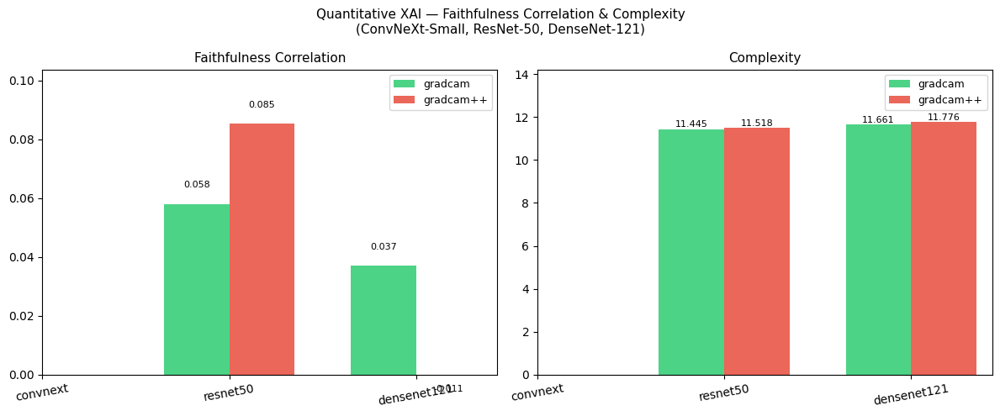

Saved plot to Drive.


In [ ]:
results_quantus = []

for mname, model in QUANTUS_MODELS.items():
    disable_inplace(model)
    model.eval()
    print(f'\nEvaluating: {mname}')

    for xai_name in ['gradcam', 'gradcam++']:
        print(f'  XAI: {xai_name}')
        a_batch = get_attributions(model, mname, x_batch, method=xai_name)

        # Faithfulness Correlation
        try:
            fc = quantus.FaithfulnessCorrelation(
                nr_runs=10,
                subset_size=224,
                perturb_baseline='mean',
                similarity_func=quantus.similarity_func.correlation_pearson,
                abs=False,
                normalise=True,
                return_aggregate=True,
            )
            fc_val = float(np.mean(fc(
                model=model, x_batch=x_batch, y_batch=y_batch,
                a_batch=a_batch, device=device,
            )))
        except Exception as e:
            print(f'    FC error: {e}')
            fc_val = float('nan')

        # Complexity
        try:
            comp = quantus.Complexity(
                normalise=True, abs=True, return_aggregate=True,
            )
            comp_val = float(np.mean(comp(
                model=model, x_batch=x_batch, y_batch=y_batch,
                a_batch=a_batch, device=device,
            )))
        except Exception as e:
            print(f'    Complexity error: {e}')
            comp_val = float('nan')

        results_quantus.append({
            'Model': mname, 'XAI_Method': xai_name,
            'Faithfulness_Correlation': round(fc_val, 4),
            'Complexity': round(comp_val, 4),
        })
        print(f'    FC={fc_val:.4f}  Complexity={comp_val:.4f}')

quantus_df = pd.DataFrame(results_quantus)
print('\n--- Quantitative XAI Results ---')
print(quantus_df.to_string(index=False))
quantus_df.to_csv(f'{SAVE_DIR}/quantus_results.csv', index=False)
print(f'Saved to Drive.')

# ── visualize ──
import matplotlib.pyplot as plt
models_list = list(QUANTUS_MODELS.keys())
x = np.arange(len(models_list))
width = 0.35
colors = ['#2ecc71', '#e74c3c']

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for ax, metric in zip(axes, ['Faithfulness_Correlation', 'Complexity']):
    for i, xai in enumerate(['gradcam', 'gradcam++']):
        subset = quantus_df[quantus_df['XAI_Method'] == xai]
        vals = [float(subset[subset['Model']==m][metric].values[0])
                if len(subset[subset['Model']==m]) > 0 else 0
                for m in models_list]
        bars = ax.bar(x + i*width, vals, width=width,
                      label=xai, color=colors[i], alpha=0.85)
        for bar, val in zip(bars, vals):
            if not np.isnan(val):
                ax.text(bar.get_x() + bar.get_width()/2,
                        bar.get_height() + 0.005,
                        f'{val:.3f}', ha='center', va='bottom', fontsize=8)
    ax.set_xticks(x + width/2)
    ax.set_xticklabels([m.split('_')[0] for m in models_list], rotation=10)
    ax.set_title(metric.replace('_', ' '), fontsize=11)
    ax.legend(fontsize=9)
    ax.set_ylim(0, ax.get_ylim()[1] * 1.15)

plt.suptitle('Quantitative XAI — Faithfulness Correlation & Complexity\n(ConvNeXt-Small, ResNet-50, DenseNet-121)',
             fontsize=11)
plt.tight_layout()
plt.savefig(f'{SAVE_DIR}/quantus_results.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved plot to Drive.')

In [ ]:
# debug ConvNeXt quantus failure
mname = 'convnext_small'
model = QUANTUS_MODELS[mname]
disable_inplace(model)
model.eval()

a_batch = get_attributions(model, mname, x_batch, method='gradcam')
print(f'Attribution stats: shape={a_batch.shape} min={a_batch.min():.4f} max={a_batch.max():.4f} allzero={np.all(a_batch==0)}')
print(f'Non-zero samples: {(a_batch.max(axis=(1,2,3)) > 0).sum()}/50')

# try quantus with verbose error
try:
    fc = quantus.FaithfulnessCorrelation(
        nr_runs=10,
        subset_size=224,
        perturb_baseline='mean',
        similarity_func=quantus.similarity_func.correlation_pearson,
        abs=False,
        normalise=True,
        return_aggregate=False,  # get per-sample scores
    )
    scores = fc(
        model=model, x_batch=x_batch, y_batch=y_batch,
        a_batch=a_batch, device=device,
    )
    print(f'Per-sample scores: {scores}')
    print(f'Non-nan: {np.sum(~np.isnan(scores))}/50')
except Exception as e:
    print(f'Error: {e}')

Attribution stats: shape=(50, 3, 224, 224) min=0.0000 max=1.0000 allzero=False
Non-zero samples: 47/50
Per-sample scores: [0.27623629570007324, -0.523894190788269, 0.0759144052863121, -0.791954755783081, 0.35945218801498413, -0.5982580184936523, -0.5849109888076782, 0.0031480940524488688, -0.2098524570465088, -0.46684837341308594, 0.024273434653878212, -0.2809915244579315, -0.05136236920952797, -0.1445581614971161, 0.7410857677459717, 0.07648865878582001, -0.4567265808582306, 0.09227312356233597, -0.13290323317050934, -0.18903197348117828, 0.34177571535110474, 0.3951806128025055, 0.03527593985199928, -0.2633684575557709, 0.33000320196151733, nan, -0.29489874839782715, 0.21682032942771912, nan, 0.43507230281829834, 0.17530974745750427, 0.04041619971394539, 0.29794156551361084, 0.13277095556259155, 0.3203960061073303, 0.17913679778575897, -0.4148542582988739, -0.09186279773712158, 0.1209690049290657, 0.4284612536430359, 0.3243638277053833, 0.11739897727966309, 0.0978945791721344, -0.5279

In [ ]:
from collections import Counter
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, confusion_matrix

# ── extract patient ID from filename ──
# format: SOB_[B/M]_[subtype]-[patientID]-[mag]-[frame].png
# patient ID = parts 1+2 after splitting stem by '-'
test_df['patient'] = test_df['path'].apply(
    lambda p: '-'.join(Path(p).stem.split('-')[1:3])
)
print(f'Unique patients: {test_df["patient"].nunique()}')
print(test_df[['path','patient','label','subtype']].head(5))

# ── get patch-level predictions from DenseNet-121 ──
best_model = trained_models['densenet121']
best_model.eval()

patch_preds, patch_probs, patch_labels, patch_patients, patch_subtypes = [], [], [], [], []

with torch.no_grad():
    for imgs, labels in test_loader:
        imgs = imgs.to(device)
        out  = best_model(imgs)
        probs = torch.softmax(out, dim=1)[:, 1].cpu().numpy()
        preds = out.argmax(1).cpu().numpy()
        patch_preds.extend(preds)
        patch_probs.extend(probs)
        patch_labels.extend(labels.numpy())

# attach patient + subtype info (test_loader is not shuffled so order preserved)
patch_df = test_df[['patient','label','subtype']].copy().reset_index(drop=True)
patch_df['pred']  = patch_preds
patch_df['prob']  = patch_probs
patch_df['correct'] = (patch_df['label'] == patch_df['pred']).astype(int)

print(f'\nPatch-level accuracy: {patch_df["correct"].mean():.4f}')
print(f'Total patches: {len(patch_df)}')

# ── patient-level aggregation: majority vote + mean probability ──
patient_results = []
for patient, grp in patch_df.groupby('patient'):
    majority_vote = Counter(grp['pred']).most_common(1)[0][0]
    mean_prob     = grp['prob'].mean()
    true_label    = grp['label'].iloc[0]
    subtype       = grp['subtype'].iloc[0]
    n_patches     = len(grp)

    patient_results.append({
        'patient':       patient,
        'true_label':    true_label,
        'majority_vote': majority_vote,
        'mean_prob':     round(mean_prob, 4),
        'n_patches':     n_patches,
        'subtype':       subtype,
        'correct':       int(majority_vote == true_label),
    })

patient_df = pd.DataFrame(patient_results)
print(f'\nUnique patients: {len(patient_df)}')
print(f'Benign patients: {(patient_df["true_label"]==0).sum()}')
print(f'Malignant patients: {(patient_df["true_label"]==1).sum()}')

# ── patient-level metrics ──
pt_labels = patient_df['true_label'].values
pt_preds  = patient_df['majority_vote'].values
pt_probs  = patient_df['mean_prob'].values

pt_acc = accuracy_score(pt_labels, pt_preds)
pt_auc = roc_auc_score(pt_labels, pt_probs)
pt_f1  = f1_score(pt_labels, pt_preds)
cm     = confusion_matrix(pt_labels, pt_preds)
tn, fp, fn, tp = cm.ravel()
pt_se  = tp / (tp + fn)
pt_sp  = tn / (tn + fp)

print(f'\n--- Patient-Level Results (DenseNet-121, Majority Vote) ---')
print(f'Accuracy:    {pt_acc:.4f}')
print(f'AUC:         {pt_auc:.4f}')
print(f'F1:          {pt_f1:.4f}')
print(f'Sensitivity: {pt_se:.4f}')
print(f'Specificity: {pt_sp:.4f}')
print(f'Confusion Matrix:\n  TN={tn} FP={fp}\n  FN={fn} TP={tp}')

# ── compare patch vs patient ──
print(f'\n--- Patch vs Patient Level Comparison ---')
print(f'{"Metric":<15} {"Patch":>10} {"Patient":>10}')
print('-' * 37)
patch_acc = patch_df['correct'].mean()
patch_auc = roc_auc_score(patch_df['label'], patch_df['prob'])
patch_f1  = f1_score(patch_df['label'], patch_df['pred'])
for metric, pv, ptv in [
    ('Accuracy',    patch_acc,  pt_acc),
    ('AUC',         patch_auc,  pt_auc),
    ('F1',          patch_f1,   pt_f1),
    ('Sensitivity', None,       pt_se),
    ('Specificity', None,       pt_sp),
]:
    if pv is not None:
        print(f'{metric:<15} {pv:>10.4f} {ptv:>10.4f}')
    else:
        print(f'{metric:<15} {"N/A":>10} {ptv:>10.4f}')

# ── per-subtype patient-level accuracy ──
print(f'\n--- Per-Subtype Patient-Level Accuracy ---')
for subtype, grp in patient_df.groupby('subtype'):
    acc = grp['correct'].mean()
    print(f'{subtype:<25} {acc:.4f}  ({grp["correct"].sum()}/{len(grp)} correct)')

# ── save ──
patient_df.to_csv(f'{SAVE_DIR}/patient_level_results.csv', index=False)
print(f'\nSaved to Drive: {SAVE_DIR}/patient_level_results.csv')

Unique patients: 80
                                                path     patient  label  \
0  /content/breakhis/BreaKHis 400X/test/malignant...    14-14926      1   
1  /content/breakhis/BreaKHis 400X/test/benign/SO...    14-25197      0   
2  /content/breakhis/BreaKHis 400X/test/malignant...    14-17901      1   
3  /content/breakhis/BreaKHis 400X/test/benign/SO...  14-22549CD      0   
4  /content/breakhis/BreaKHis 400X/test/malignant...     14-9461      1   

            subtype  
0  Ductal Carcinoma  
1      Fibroadenoma  
2  Ductal Carcinoma  
3          Adenosis  
4  Ductal Carcinoma  

Patch-level accuracy: 0.9633
Total patches: 545

Unique patients: 80
Benign patients: 24
Malignant patients: 56

--- Patient-Level Results (DenseNet-121, Majority Vote) ---
Accuracy:    0.9750
AUC:         0.9993
F1:          0.9821
Sensitivity: 0.9821
Specificity: 0.9583
Confusion Matrix:
  TN=23 FP=1
  FN=1 TP=55

--- Patch vs Patient Level Comparison ---
Metric               Patch    Patien

In [ ]:
import os
for f in os.listdir('/content/breakhis'):
    print(f)

BreaKHis 400X


In [ ]:
import zipfile, os

ZIP_PATH   = '/content/drive/MyDrive/BreaKHis_v1.zip'
EXTRACT_TO = '/content/breakhis'

os.makedirs(EXTRACT_TO, exist_ok=True)

with zipfile.ZipFile(ZIP_PATH, 'r') as zf:
    zf.extractall(EXTRACT_TO)

# verify
for f in os.listdir(EXTRACT_TO):
    print(f)

BreaKHis 400X


In [ ]:
import os
for f in os.listdir('/content/drive/MyDrive'):
    if 'BreakHis' in f or 'BreaKHis' in f or 'breakhis' in f:
        print(f)

BreaKHis_v1.zip
BreakHis_Results
BreaKHis_all.zip


In [ ]:
ZIP_PATH   = '/content/drive/MyDrive/BreaKHis_all.zip'
EXTRACT_TO = '/content/breakhis_all'

import os, zipfile
os.makedirs(EXTRACT_TO, exist_ok=True)
print('Extracting...')
with zipfile.ZipFile(ZIP_PATH, 'r') as zf:
    zf.extractall(EXTRACT_TO)
print('Done.')

# check structure
for root, dirs, files in os.walk(EXTRACT_TO):
    level = root.replace(EXTRACT_TO, '').count(os.sep)
    if level < 6:
        indent = ' ' * 2 * level
        print(f'{indent}{os.path.basename(root)}/')
        if files:
            print(f'{indent}  [{len(files)} files — e.g. {files[0]}]')

Extracting...
Done.
breakhis_all/
  [1 files — e.g. Folds.csv]
  BreaKHis_v1/
    BreaKHis_v1/
      histology_slides/
        breast/
          [2 files — e.g. README.txt]
          malignant/
            [6 files — e.g. papillary_carcinoma.stat.txt]
          benign/
            [6 files — e.g. tubular_adenoma.stat.txt]


In [ ]:
import os

for root, dirs, files in os.walk('/content/breakhis_all'):
    if files:
        # only print folders that actually contain image files
        pngs = [f for f in files if f.endswith('.png')]
        if pngs:
            print(f'{root}/')
            print(f'  [{len(pngs)} images — e.g. {pngs[0]}]')
            break  # just show first image folder to understand structure

/content/breakhis_all/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979C/40X/
  [17 images — e.g. SOB_M_MC-14-19979C-40-013.png]


Device: cuda
Total images to normalize and cache: 7909


100%|██████████| 7909/7909 [30:27<00:00,  4.33it/s]


Done. Written: 7909 | Skipped (already cached): 0

############################################################
MAGNIFICATION: 40X
############################################################
40X | Total:1995 Train:1358 Val:327 Test:310
      Train dist: {'malignant': 1006, 'benign': 352}

40X — Training: resnet50
Ep 01/20 | Tr:0.3189/0.8756 | Val:1.4055/0.7920 AUC:0.8231 F1:0.8389 | 30.1s
Ep 02/20 | Tr:0.1343/0.9529 | Val:0.4269/0.8593 AUC:0.9238 F1:0.8861 | 28.4s
Ep 03/20 | Tr:0.1189/0.9566 | Val:0.4443/0.8502 AUC:0.9681 F1:0.8825 | 28.3s
Ep 04/20 | Tr:0.0809/0.9728 | Val:1.2976/0.7156 AUC:0.8710 F1:0.8009 | 28.0s
Ep 05/20 | Tr:0.0530/0.9838 | Val:0.8974/0.8073 AUC:0.9411 F1:0.8558 | 27.9s
Ep 06/20 | Tr:0.0377/0.9875 | Val:0.6934/0.8165 AUC:0.9416 F1:0.8611 | 28.7s
Ep 07/20 | Tr:0.0477/0.9845 | Val:0.7977/0.8716 AUC:0.9113 F1:0.8955 | 28.2s
Ep 08/20 | Tr:0.0404/0.9853 | Val:0.8328/0.8287 AUC:0.8941 F1:0.8679 | 28.6s
Ep 09/20 | Tr:0.0361/0.9867 | Val:0.7846/0.8532 AUC:0.9261 F1:0.8857

100%|██████████| 30.8M/30.8M [00:00<00:00, 118MB/s]


Ep 01/20 | Tr:0.2321/0.8969 | Val:0.6306/0.8104 AUC:0.8625 F1:0.8434 | 28.8s
Ep 02/20 | Tr:0.1279/0.9477 | Val:0.5878/0.8135 AUC:0.8756 F1:0.8530 | 27.7s
Ep 03/20 | Tr:0.0948/0.9602 | Val:1.7081/0.7339 AUC:0.7890 F1:0.8105 | 28.6s
Ep 04/20 | Tr:0.0804/0.9728 | Val:2.1471/0.6667 AUC:0.9057 F1:0.7743 | 29.1s
Ep 05/20 | Tr:0.0757/0.9639 | Val:1.5650/0.6942 AUC:0.9000 F1:0.7881 | 28.6s
Ep 06/20 | Tr:0.0447/0.9831 | Val:0.9526/0.8165 AUC:0.8650 F1:0.8605 | 28.4s
Ep 07/20 | Tr:0.0517/0.9816 | Val:0.9195/0.7890 AUC:0.8659 F1:0.8321 | 28.6s
Ep 08/20 | Tr:0.0364/0.9875 | Val:0.8349/0.8135 AUC:0.8842 F1:0.8565 | 28.5s
Ep 09/20 | Tr:0.0300/0.9890 | Val:1.1670/0.7890 AUC:0.8638 F1:0.8421 | 28.4s
Ep 10/20 | Tr:0.0265/0.9912 | Val:0.5807/0.8471 AUC:0.9431 F1:0.8815 | 28.3s
Ep 11/20 | Tr:0.0194/0.9934 | Val:1.2019/0.7829 AUC:0.9347 F1:0.8397 | 28.3s
Ep 12/20 | Tr:0.0140/0.9971 | Val:0.7514/0.8563 AUC:0.9295 F1:0.8878 | 28.6s
Ep 13/20 | Tr:0.0199/0.9926 | Val:1.3921/0.7951 AUC:0.8973 F1:0.8474 | 29.0s

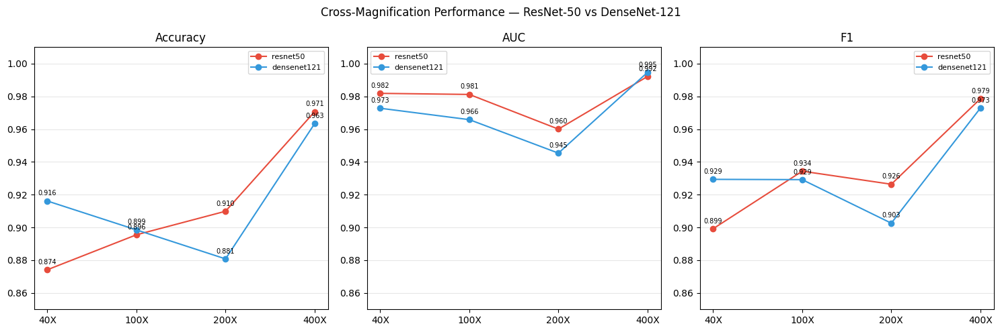

Saved: /content/drive/MyDrive/BreakHis_Results/multimag_comparison.png


In [ ]:
import os, cv2, glob, copy, time
import numpy as np
import pandas as pd
from pathlib import Path
from PIL import Image
from tqdm import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision.models as models
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt

# ── CONFIG ────────────────────────────────────────────────────────────────
MAGNIFICATIONS = ['40X', '100X', '200X']
MODEL_NAMES    = ['resnet50', 'densenet121']
BATCH_SIZE     = 32
EPOCHS         = 20
IMG_SIZE       = 224
NUM_WORKERS    = 2
SEED           = 42
MEAN           = [0.485, 0.456, 0.406]
STD            = [0.229, 0.224, 0.225]
BASE_DIR       = '/content/breakhis_all/BreaKHis_v1/BreaKHis_v1/histology_slides/breast'
CACHE_DIR      = '/content/breakhis_cached'
SAVE_DIR       = '/content/drive/MyDrive/BreakHis_Results'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(SEED)
np.random.seed(SEED)
print('Device:', device)


# ── STAIN NORMALIZATION ───────────────────────────────────────────────────
def macenko_normalize(img):
    img = img.astype(np.float32) + 1e-6
    OD  = -np.log(img / 255.0)
    OD[OD < 0] = 0
    OD_hat = OD[OD.sum(axis=2) > 0.15]
    if len(OD_hat) == 0:
        return img.astype(np.uint8)
    _, _, V = np.linalg.svd(OD_hat, full_matrices=False)
    V       = V[:2].T
    phi     = np.arctan2(OD_hat @ V[:, 1], OD_hat @ V[:, 0])
    v1      = V @ np.array([np.cos(np.percentile(phi, 1)),  np.sin(np.percentile(phi, 1))])
    v2      = V @ np.array([np.cos(np.percentile(phi, 99)), np.sin(np.percentile(phi, 99))])
    if v1[0] > v2[0]: v1, v2 = v2, v1
    HE      = np.array([v1, v2]).T
    C       = np.linalg.lstsq(HE, OD.reshape(-1, 3).T, rcond=None)[0]
    maxC    = np.percentile(C, 99, axis=1, keepdims=True)
    C_norm  = C / (maxC + 1e-6) * maxC
    OD_norm = HE @ C_norm
    out     = np.exp(-OD_norm.T.reshape(img.shape[:2] + (3,))) * 255
    return np.clip(out, 0, 255).astype(np.uint8)


# ── STEP 1: CACHE ALL NORMALIZED IMAGES ──────────────────────────────────
def cache_normalized_images(base_dir, cache_dir):
    all_imgs = glob.glob(f'{base_dir}/**/*.png', recursive=True)
    print(f'Total images to normalize and cache: {len(all_imgs)}')
    skipped, written = 0, 0
    for src in tqdm(all_imgs):
        rel = os.path.relpath(src, base_dir)
        dst = os.path.join(cache_dir, rel)
        os.makedirs(os.path.dirname(dst), exist_ok=True)
        if os.path.exists(dst):
            skipped += 1
            continue
        img = cv2.cvtColor(cv2.imread(src), cv2.COLOR_BGR2RGB)
        img = macenko_normalize(img)
        cv2.imwrite(dst, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        written += 1
    print(f'Done. Written: {written} | Skipped (already cached): {skipped}')

cache_normalized_images(BASE_DIR, CACHE_DIR)


# ── TRANSFORMS ───────────────────────────────────────────────────────────
train_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(0.2, 0.2, 0.2, 0.05),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])
val_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])


# ── DATASET (no normalization — already cached) ───────────────────────────
class BreakHisDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df        = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = cv2.cvtColor(cv2.imread(row['path']), cv2.COLOR_BGR2RGB)
        img = Image.fromarray(img)
        if self.transform:
            img = self.transform(img)
        return img, row['label']


# ── DATA LOADER ───────────────────────────────────────────────────────────
def load_mag_data(mag):
    records = []
    for label_name, label_idx in [('benign', 0), ('malignant', 1)]:
        imgs = glob.glob(f'{CACHE_DIR}/{label_name}/SOB/**/{mag}/*.png', recursive=True)
        for p in imgs:
            stem    = Path(p).stem
            parts   = stem.split('-')
            patient = '-'.join(parts[1:3]) if len(parts) >= 3 else stem
            records.append({'path': p, 'label': label_idx,
                            'label_name': label_name, 'patient': patient})

    df       = pd.DataFrame(records).sample(frac=1, random_state=SEED).reset_index(drop=True)
    patients = df['patient'].unique()

    train_pts, temp_pts = train_test_split(patients, test_size=0.30, random_state=SEED)
    val_pts,   test_pts = train_test_split(temp_pts,  test_size=0.50, random_state=SEED)

    train_df = df[df['patient'].isin(train_pts)].reset_index(drop=True)
    val_df   = df[df['patient'].isin(val_pts)].reset_index(drop=True)
    test_df  = df[df['patient'].isin(test_pts)].reset_index(drop=True)

    print(f'{mag} | Total:{len(df)} Train:{len(train_df)} Val:{len(val_df)} Test:{len(test_df)}')
    print(f'      Train dist: {train_df["label_name"].value_counts().to_dict()}')
    return train_df, val_df, test_df


# ── MODEL ─────────────────────────────────────────────────────────────────
def build_model(name):
    if name == 'resnet50':
        m    = models.resnet50(weights='DEFAULT')
        m.fc = nn.Linear(m.fc.in_features, 2)
    elif name == 'densenet121':
        m            = models.densenet121(weights='DEFAULT')
        m.classifier = nn.Linear(m.classifier.in_features, 2)
    return m.to(device)


# ── TRAIN / EVAL ──────────────────────────────────────────────────────────
def train_one_epoch(model, loader, criterion, optimizer):
    model.train()
    total_loss, preds_all, labels_all = 0, [], []
    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        out  = model(imgs)
        loss = criterion(out, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * len(imgs)
        preds_all.extend(out.argmax(1).cpu().numpy())
        labels_all.extend(labels.cpu().numpy())
    return total_loss / len(loader.dataset), accuracy_score(labels_all, preds_all)

@torch.no_grad()
def evaluate(model, loader, criterion):
    model.eval()
    total_loss, preds_all, probs_all, labels_all = 0, [], [], []
    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)
        out   = model(imgs)
        loss  = criterion(out, labels)
        total_loss += loss.item() * len(imgs)
        probs = torch.softmax(out, dim=1)[:, 1].cpu().numpy()
        preds_all.extend(out.argmax(1).cpu().numpy())
        probs_all.extend(probs)
        labels_all.extend(labels.cpu().numpy())
    acc = accuracy_score(labels_all, preds_all)
    auc = roc_auc_score(labels_all, probs_all)
    f1  = f1_score(labels_all, preds_all)
    cm  = confusion_matrix(labels_all, preds_all)
    tn, fp, fn, tp = cm.ravel()
    se  = tp / (tp + fn) if (tp + fn) > 0 else 0
    sp  = tn / (tn + fp) if (tn + fp) > 0 else 0
    return total_loss / len(loader.dataset), acc, auc, f1, se, sp

def train_model(model_name, train_loader, val_loader, mag):
    print(f'\n{"="*50}\n{mag} — Training: {model_name}\n{"="*50}')
    model     = build_model(model_name)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

    best_val_auc, best_weights = 0, None
    for epoch in range(1, EPOCHS + 1):
        t0 = time.time()
        tr_loss, tr_acc                       = train_one_epoch(model, train_loader, criterion, optimizer)
        vl_loss, vl_acc, vl_auc, vl_f1, _, _ = evaluate(model, val_loader, criterion)
        scheduler.step()
        if vl_auc > best_val_auc:
            best_val_auc = vl_auc
            best_weights = copy.deepcopy(model.state_dict())
        print(f'Ep {epoch:02d}/{EPOCHS} | Tr:{tr_loss:.4f}/{tr_acc:.4f} | '
              f'Val:{vl_loss:.4f}/{vl_acc:.4f} AUC:{vl_auc:.4f} F1:{vl_f1:.4f} | '
              f'{time.time()-t0:.1f}s')

    model.load_state_dict(best_weights)
    save_path = f'{SAVE_DIR}/{model_name}_{mag}_best.pth'
    torch.save(best_weights, save_path)
    print(f'Saved: {save_path} (Val AUC: {best_val_auc:.4f})')
    return model


# ── MAIN LOOP ─────────────────────────────────────────────────────────────
all_results = []

for mag in MAGNIFICATIONS:
    print(f'\n{"#"*60}\nMAGNIFICATION: {mag}\n{"#"*60}')

    train_df, val_df, test_df = load_mag_data(mag)

    train_ds     = BreakHisDataset(train_df, transform=train_tf)
    val_ds       = BreakHisDataset(val_df,   transform=val_tf)
    test_ds      = BreakHisDataset(test_df,  transform=val_tf)
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS)
    val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
    test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

    for mname in MODEL_NAMES:
        model     = train_model(mname, train_loader, val_loader, mag)
        criterion = nn.CrossEntropyLoss()
        _, acc, auc, f1, se, sp = evaluate(model, test_loader, criterion)
        print(f'TEST {mname}@{mag}: Acc={acc:.4f} AUC={auc:.4f} F1={f1:.4f} Se={se:.4f} Sp={sp:.4f}')
        all_results.append({'Magnification': mag, 'Model': mname,
                            'Accuracy': acc, 'AUC': auc, 'F1': f1,
                            'Sensitivity': se, 'Specificity': sp})

# ── ADD 400X RESULTS ──────────────────────────────────────────────────────
for mname, acc, auc, f1, se, sp in [
    ('resnet50',    0.9706, 0.9921, 0.9785, 0.9864, 0.9375),
    ('densenet121', 0.9633, 0.9946, 0.9728, 0.9675, 0.9545),
]:
    all_results.append({'Magnification': '400X', 'Model': mname,
                        'Accuracy': acc, 'AUC': auc, 'F1': f1,
                        'Sensitivity': se, 'Specificity': sp})

# ── FINAL TABLE ───────────────────────────────────────────────────────────
results_df = pd.DataFrame(all_results)
results_df = results_df.sort_values(['Model', 'Magnification']).reset_index(drop=True)
print('\n=== CROSS-MAGNIFICATION RESULTS ===')
print(results_df.to_string(index=False))
results_df.to_csv(f'{SAVE_DIR}/multimag_results.csv', index=False)
print(f'Saved: {SAVE_DIR}/multimag_results.csv')

# ── PLOT ──────────────────────────────────────────────────────────────────
mag_order    = ['40X', '100X', '200X', '400X']
model_colors = {'resnet50': '#e74c3c', 'densenet121': '#3498db'}
metrics      = ['Accuracy', 'AUC', 'F1']

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, metric in zip(axes, metrics):
    for mname, color in model_colors.items():
        subset = results_df[results_df['Model'] == mname].set_index('Magnification').reindex(mag_order)
        ax.plot(mag_order, subset[metric], marker='o', color=color, label=mname)
        for i, val in enumerate(subset[metric]):
            if not np.isnan(val):
                ax.annotate(f'{val:.3f}', (i, val), textcoords='offset points',
                            xytext=(0, 6), ha='center', fontsize=7)
    ax.set_title(metric)
    ax.set_ylim(0.85, 1.01)
    ax.legend(fontsize=8)
    ax.grid(axis='y', alpha=0.3)

plt.suptitle('Cross-Magnification Performance — ResNet-50 vs DenseNet-121', fontsize=12)
plt.tight_layout()
plt.savefig(f'{SAVE_DIR}/multimag_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {SAVE_DIR}/multimag_comparison.png')

In [ ]:
"""
================================================================================
 PAPER FIGURE GENERATOR — "Beyond Accuracy" (BreakHis XAI Paper)
================================================================================
HOW TO USE (Google Colab):

1. Run this cell block first:
       from google.colab import drive
       drive.mount('/content/drive')

2. Paste this ENTIRE script into a new cell and run it.
   It reads CSVs already sitting in your Drive folder:
       /content/drive/MyDrive/BreakHis_Results/
           results_table.csv
           quantus_results.csv
           multimag_results.csv
           patient_level_results.csv

3. All figures are saved to:
       /content/drive/MyDrive/BreakHis_Results/paper_figures/
   as BOTH .png (300 DPI, for Word/screen) and .pdf (vector, for LaTeX/Overleaf).

4. Just drag the .pdf files straight into your LaTeX \\includegraphics{} calls,
   or the .png files into Word — no cropping/resizing needed, they're already
   sized to journal column widths (3.3in single-col / 6.9in double-col).

If a CSV is missing, that figure is skipped with a clear warning instead of
crashing — so you can run this after each partial results save.
================================================================================
"""

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from matplotlib.patches import Patch

# ──────────────────────────────────────────────────────────────────────────
# 0. CONFIG — change SAVE_DIR only if your folder name differs
# ──────────────────────────────────────────────────────────────────────────
SAVE_DIR = '/content/drive/MyDrive/BreakHis_Results'
FIG_DIR  = os.path.join(SAVE_DIR, 'paper_figures')
os.makedirs(FIG_DIR, exist_ok=True)

# Hardcoded ensemble row from your notebook output (Table 3), since it's
# computed on the fly and not saved to its own CSV.
ENSEMBLE_ROW = {
    'Model': 'Ensemble', 'Accuracy': 0.9670, 'AUC': 0.9958,
    'F1': 0.9756, 'Sensitivity': 0.9756, 'Specificity': 0.9489
}

MODEL_DISPLAY = {
    'efficientnet_v2_s': 'EfficientNetV2-S',
    'convnext_small':    'ConvNeXt-Small',
    'resnet50':          'ResNet-50',
    'densenet121':       'DenseNet-121',
    'Ensemble':          'Ensemble',
}

# ──────────────────────────────────────────────────────────────────────────
# 1. PUBLICATION STYLE — serif font, crisp lines, journal-safe sizing
# ──────────────────────────────────────────────────────────────────────────
def setup_style():
    # Prefer Times New Roman; fall back gracefully so text never disappears
    preferred = ['Times New Roman', 'Nimbus Roman', 'Liberation Serif', 'DejaVu Serif']
    available = {f.name for f in fm.fontManager.ttflist}
    chosen = next((f for f in preferred if f in available), 'DejaVu Serif')

    plt.rcParams.update({
        'font.family': 'serif',
        'font.serif': [chosen],
        'font.size': 11,
        'axes.titlesize': 12,
        'axes.titleweight': 'bold',
        'axes.labelsize': 11,
        'xtick.labelsize': 10,
        'ytick.labelsize': 10,
        'legend.fontsize': 9.5,
        'figure.dpi': 150,
        'savefig.dpi': 300,
        'axes.linewidth': 0.9,
        'axes.edgecolor': '#333333',
        'axes.grid': True,
        'grid.alpha': 0.25,
        'grid.linewidth': 0.5,
        'axes.axisbelow': True,
        'text.color': '#1a1a1a',
        'axes.labelcolor': '#1a1a1a',
        'xtick.color': '#1a1a1a',
        'ytick.color': '#1a1a1a',
        'svg.fonttype': 'none',
        'pdf.fonttype': 42,   # embed real fonts in PDF (not Type-3 bitmaps)
        'ps.fonttype': 42,
    })
    print(f"[style] Using font family: {chosen}")

def save_fig(fig, name, tight=True):
    if tight:
        fig.tight_layout()
    png_path = os.path.join(FIG_DIR, f'{name}.png')
    pdf_path = os.path.join(FIG_DIR, f'{name}.pdf')
    fig.savefig(png_path, dpi=300, bbox_inches='tight', facecolor='white')
    fig.savefig(pdf_path, bbox_inches='tight', facecolor='white')
    print(f"[saved] {name}.png  &  {name}.pdf")
    plt.close(fig)

def safe_read_csv(path, label):
    if not os.path.exists(path):
        print(f"[SKIP] {label}: file not found at {path}")
        return None
    df = pd.read_csv(path)
    print(f"[loaded] {label}: {len(df)} rows")
    return df

# Color palette — colorblind-safe, consistent across all figures
PALETTE = {
    'efficientnet_v2_s': '#4C72B0',
    'convnext_small':    '#DD8452',
    'resnet50':          '#55A868',
    'densenet121':       '#C44E52',
    'Ensemble':          '#8172B2',
}
BENIGN_COLOR = '#3498db'
MALIGNANT_COLOR = '#e74c3c'


# ══════════════════════════════════════════════════════════════════════════
# FIGURE 1 — Primary classification performance at 400X (grouped bars)
# Maps directly to your Table 3.
# ══════════════════════════════════════════════════════════════════════════
def fig_model_comparison():
    df = safe_read_csv(os.path.join(SAVE_DIR, 'results_table.csv'), 'results_table.csv')
    if df is None:
        return
    if 'Ensemble' not in df['Model'].values:
        df = pd.concat([df, pd.DataFrame([ENSEMBLE_ROW])], ignore_index=True)

    df['Model'] = pd.Categorical(df['Model'],
        categories=['efficientnet_v2_s','convnext_small','resnet50','densenet121','Ensemble'],
        ordered=True)
    df = df.sort_values('Model')

    metrics = ['Accuracy', 'AUC', 'F1', 'Sensitivity', 'Specificity']
    x = np.arange(len(metrics))
    width = 0.15

    fig, ax = plt.subplots(figsize=(7.0, 4.2))
    for i, (_, row) in enumerate(df.iterrows()):
        vals = [row[m] for m in metrics]
        bars = ax.bar(x + i*width - 2*width, vals, width=width,
                       label=MODEL_DISPLAY.get(row['Model'], row['Model']),
                       color=PALETTE.get(row['Model'], '#999999'),
                       edgecolor='white', linewidth=0.6)
        for b, v in zip(bars, vals):
            ax.text(b.get_x()+b.get_width()/2, v+0.004, f'{v:.3f}',
                    ha='center', va='bottom', fontsize=6.3, rotation=90)

    ax.set_xticks(x)
    ax.set_xticklabels(metrics)
    ax.set_ylabel('Score')
    ax.set_ylim(0.90, 1.03)
    ax.set_title('Primary Classification Performance at 400X Magnification')
    ax.legend(ncol=3, loc='lower center', bbox_to_anchor=(0.5, -0.32), frameon=False)
    save_fig(fig, 'fig_model_comparison_400X')


# ══════════════════════════════════════════════════════════════════════════
# FIGURE 2 — Radar chart: holistic multi-metric model profile
# Nice "at a glance" figure for the discussion section.
# ══════════════════════════════════════════════════════════════════════════
def fig_radar_comparison():
    df = safe_read_csv(os.path.join(SAVE_DIR, 'results_table.csv'), 'results_table.csv')
    if df is None:
        return
    if 'Ensemble' not in df['Model'].values:
        df = pd.concat([df, pd.DataFrame([ENSEMBLE_ROW])], ignore_index=True)

    metrics = ['Accuracy', 'AUC', 'F1', 'Sensitivity', 'Specificity']
    angles = np.linspace(0, 2*np.pi, len(metrics), endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(5.6, 5.6), subplot_kw=dict(polar=True))
    for _, row in df.iterrows():
        vals = [row[m] for m in metrics]
        vals += vals[:1]
        color = PALETTE.get(row['Model'], '#999999')
        ax.plot(angles, vals, linewidth=1.6, label=MODEL_DISPLAY.get(row['Model'], row['Model']), color=color)
        ax.fill(angles, vals, alpha=0.06, color=color)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(metrics)
    ax.set_ylim(0.90, 1.0)
    ax.set_rlabel_position(30)
    ax.set_title('Multi-Metric Model Profile (400X)', pad=20)
    ax.legend(loc='upper right', bbox_to_anchor=(1.35, 1.1), frameon=False)
    save_fig(fig, 'fig_radar_comparison')


# ══════════════════════════════════════════════════════════════════════════
# FIGURE 3 — ★ NOVELTY FIGURE ★
# Accuracy (AUC) vs. Explanation Faithfulness — visualizes the paper's
# central claim: best classifier ≠ most faithful explainer.
# ══════════════════════════════════════════════════════════════════════════
def fig_accuracy_vs_faithfulness():
    perf = safe_read_csv(os.path.join(SAVE_DIR, 'results_table.csv'), 'results_table.csv')
    qtus = safe_read_csv(os.path.join(SAVE_DIR, 'quantus_results.csv'), 'quantus_results.csv')
    if perf is None or qtus is None:
        return

    # average faithfulness correlation across gradcam + gradcam++ per model
    fc_avg = qtus.groupby('Model')['Faithfulness_Correlation'].mean().reset_index()
    merged = perf.merge(fc_avg, on='Model', how='inner')
    if merged.empty:
        print("[SKIP] fig_accuracy_vs_faithfulness: no overlapping models between the two CSVs")
        return

    fig, ax = plt.subplots(figsize=(6.2, 5.0))
    for _, row in merged.iterrows():
        color = PALETTE.get(row['Model'], '#999999')
        ax.scatter(row['AUC'], row['Faithfulness_Correlation'], s=180,
                   color=color, edgecolor='black', linewidth=1.0, zorder=3)
        ax.annotate(MODEL_DISPLAY.get(row['Model'], row['Model']),
                    (row['AUC'], row['Faithfulness_Correlation']),
                    xytext=(8, 6), textcoords='offset points', fontsize=9.5)

    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.set_xlabel('Classification AUC')
    ax.set_ylabel('Mean Faithfulness Correlation\n(Grad-CAM + Grad-CAM++)')
    ax.set_title('Classification Performance vs.\nExplanation Faithfulness')

    # shade the "danger zone": high accuracy, low/negative faithfulness
    ax.axhspan(ax.get_ylim()[0], 0, color='red', alpha=0.05, zorder=0)
    ax.text(0.99, 0.03, 'less faithful', transform=ax.transAxes,
            ha='right', va='bottom', fontsize=8, color='#a33', style='italic')
    save_fig(fig, 'fig_accuracy_vs_faithfulness')


# ══════════════════════════════════════════════════════════════════════════
# FIGURE 4 — Quantus Faithfulness & Complexity, clean grouped bars
# ══════════════════════════════════════════════════════════════════════════
def fig_quantus_metrics():
    df = safe_read_csv(os.path.join(SAVE_DIR, 'quantus_results.csv'), 'quantus_results.csv')
    if df is None:
        return

    models = [m for m in ['convnext_small', 'resnet50', 'densenet121'] if m in df['Model'].unique()]
    xai_methods = ['gradcam', 'gradcam++']
    x = np.arange(len(models))
    width = 0.35
    colors = {'gradcam': '#2ecc71', 'gradcam++': '#e67e22'}

    fig, axes = plt.subplots(1, 2, figsize=(8.6, 3.8))
    for ax, metric, ylabel in zip(
        axes, ['Faithfulness_Correlation', 'Complexity'],
        ['Faithfulness Correlation', 'Complexity (entropy)']
    ):
        for i, method in enumerate(xai_methods):
            sub = df[df['XAI_Method'] == method]
            vals = [sub[sub['Model'] == m][metric].values[0] if m in sub['Model'].values else np.nan
                    for m in models]
            bars = ax.bar(x + i*width - width/2, vals, width=width,
                          label=method, color=colors[method], edgecolor='white')
            for b, v in zip(bars, vals):
                if not np.isnan(v):
                    ax.text(b.get_x()+b.get_width()/2, b.get_height() +
                            (0.003 if metric == 'Faithfulness_Correlation' else 0.08),
                            f'{v:.3f}', ha='center', va='bottom', fontsize=8)
        ax.axhline(0, color='#555', linewidth=0.7)
        ax.set_xticks(x)
        ax.set_xticklabels([MODEL_DISPLAY.get(m, m) for m in models], rotation=12)
        ax.set_ylabel(ylabel)
        ax.set_title(ylabel)
        ax.legend(frameon=False, fontsize=8.5)

    fig.suptitle('Quantitative XAI Evaluation (Quantus Toolkit)', y=1.03, fontsize=12, fontweight='bold')
    save_fig(fig, 'fig_quantus_metrics')


# ══════════════════════════════════════════════════════════════════════════
# FIGURE 5 — Patch-level vs. Patient-level performance
# ══════════════════════════════════════════════════════════════════════════
def fig_patch_vs_patient():
    pat = safe_read_csv(os.path.join(SAVE_DIR, 'patient_level_results.csv'), 'patient_level_results.csv')
    perf = safe_read_csv(os.path.join(SAVE_DIR, 'results_table.csv'), 'results_table.csv')
    if pat is None:
        return

    from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, confusion_matrix
    y_true = pat['true_label'].values
    y_pred = pat['majority_vote'].values
    y_prob = pat['mean_prob'].values

    pt_acc = accuracy_score(y_true, y_pred)
    pt_auc = roc_auc_score(y_true, y_prob)
    pt_f1  = f1_score(y_true, y_pred)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    pt_se = tp / (tp + fn)
    pt_sp = tn / (tn + fp)

    # patch-level = best model row from results_table (DenseNet-121 used for aggregation)
    patch_row = None
    if perf is not None and 'densenet121' in perf['Model'].values:
        patch_row = perf[perf['Model'] == 'densenet121'].iloc[0]

    metrics = ['Accuracy', 'AUC', 'F1', 'Sensitivity', 'Specificity']
    patient_vals = [pt_acc, pt_auc, pt_f1, pt_se, pt_sp]
    patch_vals = ([patch_row[m] for m in metrics] if patch_row is not None
                  else [np.nan]*5)

    x = np.arange(len(metrics))
    width = 0.32
    fig, ax = plt.subplots(figsize=(6.6, 4.0))
    b1 = ax.bar(x - width/2, patch_vals, width, label='Patch-level (DenseNet-121)',
                color='#95a5a6', edgecolor='white')
    b2 = ax.bar(x + width/2, patient_vals, width, label='Patient-level (Majority Vote)',
                color='#2c3e50', edgecolor='white')
    for bars in (b1, b2):
        for b in bars:
            h = b.get_height()
            if not np.isnan(h):
                ax.text(b.get_x()+b.get_width()/2, h+0.003, f'{h:.3f}',
                        ha='center', va='bottom', fontsize=8)

    ax.set_xticks(x)
    ax.set_xticklabels(metrics)
    ax.set_ylim(0.90, 1.02)
    ax.set_ylabel('Score')
    ax.set_title('Patch-Level vs. Patient-Level Diagnostic Performance')
    ax.legend(frameon=False, loc='lower center', bbox_to_anchor=(0.5, -0.28), ncol=2)
    save_fig(fig, 'fig_patch_vs_patient')


# ══════════════════════════════════════════════════════════════════════════
# FIGURE 6 — Per-subtype patient-level accuracy (horizontal bars)
# ══════════════════════════════════════════════════════════════════════════
def fig_subtype_accuracy():
    pat = safe_read_csv(os.path.join(SAVE_DIR, 'patient_level_results.csv'), 'patient_level_results.csv')
    if pat is None or 'subtype' not in pat.columns:
        print("[SKIP] fig_subtype_accuracy: 'subtype' column missing")
        return

    MALIGNANT_SUBTYPES = {'Ductal Carcinoma', 'Lobular Carcinoma', 'Mucinous Carcinoma', 'Papillary Carcinoma'}

    grp = pat.groupby('subtype').agg(
        N=('correct', 'size'),
        Accuracy=('correct', 'mean'),
    ).reset_index().sort_values('Accuracy')

    grp['Class'] = grp['subtype'].apply(lambda s: 'Malignant' if s in MALIGNANT_SUBTYPES else 'Benign')
    colors = [MALIGNANT_COLOR if c == 'Malignant' else BENIGN_COLOR for c in grp['Class']]

    fig, ax = plt.subplots(figsize=(6.6, 4.4))
    bars = ax.barh(grp['subtype'], grp['Accuracy'], color=colors, edgecolor='white')
    ax.axvline(0.95, color='gray', linestyle='--', linewidth=1, label='95% threshold')
    ax.set_xlim(0.5, 1.02)
    ax.set_xlabel('Patient-Level Accuracy')
    ax.set_title('Per-Subtype Patient-Level Diagnostic Accuracy')
    for b, v, n in zip(bars, grp['Accuracy'], grp['N']):
        ax.text(b.get_width()+0.005, b.get_y()+b.get_height()/2,
                f'{v:.3f} (n={n})', va='center', fontsize=8)

    legend_elements = [Patch(facecolor=MALIGNANT_COLOR, label='Malignant'),
                        Patch(facecolor=BENIGN_COLOR, label='Benign')]
    ax.legend(handles=legend_elements, loc='lower right', frameon=False)
    save_fig(fig, 'fig_subtype_accuracy')


# ══════════════════════════════════════════════════════════════════════════
# FIGURE 7 — Cross-magnification performance (40X → 400X)
# ══════════════════════════════════════════════════════════════════════════
def fig_cross_magnification():
    df = safe_read_csv(os.path.join(SAVE_DIR, 'multimag_results.csv'), 'multimag_results.csv')
    if df is None:
        return

    # ensure 400X row exists (it's appended manually in your notebook)
    if '400X' not in df['Magnification'].unique():
        extra = pd.DataFrame([
            {'Magnification': '400X', 'Model': 'resnet50', 'Accuracy': 0.9706, 'AUC': 0.9921,
             'F1': 0.9785, 'Sensitivity': 0.9864, 'Specificity': 0.9375},
            {'Magnification': '400X', 'Model': 'densenet121', 'Accuracy': 0.9633, 'AUC': 0.9946,
             'F1': 0.9728, 'Sensitivity': 0.9675, 'Specificity': 0.9545},
        ])
        df = pd.concat([df, extra], ignore_index=True)

    mag_order = ['40X', '100X', '200X', '400X']
    metrics = ['Accuracy', 'AUC', 'F1']
    colors = {'resnet50': '#e74c3c', 'densenet121': '#3498db'}
    markers = {'resnet50': 'o', 'densenet121': 's'}

    fig, axes = plt.subplots(1, 3, figsize=(10.5, 3.6), sharey=False)
    for ax, metric in zip(axes, metrics):
        for mname, color in colors.items():
            sub = df[df['Model'] == mname].set_index('Magnification').reindex(mag_order)
            ax.plot(mag_order, sub[metric], marker=markers[mname], color=color,
                    linewidth=1.8, markersize=6, label=MODEL_DISPLAY.get(mname, mname))
            for i, v in enumerate(sub[metric]):
                if not pd.isna(v):
                    ax.annotate(f'{v:.3f}', (i, v), textcoords='offset points',
                               xytext=(0, 7), ha='center', fontsize=7)
        ax.set_title(metric)
        ax.set_xlabel('Magnification')
        ax.set_ylim(0.55, 1.02)
        ax.grid(axis='y', alpha=0.3)

    axes[0].set_ylabel('Score')
    axes[-1].legend(loc='lower right', frameon=False, fontsize=8.5)
    fig.suptitle('Cross-Magnification Performance — ResNet-50 vs. DenseNet-121',
                 y=1.04, fontsize=12, fontweight='bold')
    save_fig(fig, 'fig_cross_magnification')


# ══════════════════════════════════════════════════════════════════════════
# FIGURE 8 — Confusion matrix at patient level (best model)
# ══════════════════════════════════════════════════════════════════════════
def fig_patient_confusion_matrix():
    pat = safe_read_csv(os.path.join(SAVE_DIR, 'patient_level_results.csv'), 'patient_level_results.csv')
    if pat is None:
        return
    from sklearn.metrics import confusion_matrix
    cm = confusion_matrix(pat['true_label'], pat['majority_vote'])
    labels = ['Benign', 'Malignant']

    fig, ax = plt.subplots(figsize=(4.2, 3.8))
    im = ax.imshow(cm, cmap='Blues')
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center',
                    fontsize=14, color='white' if cm[i, j] > cm.max()/2 else 'black')
    ax.set_xticks([0, 1]); ax.set_xticklabels([f'Pred: {l}' for l in labels])
    ax.set_yticks([0, 1]); ax.set_yticklabels([f'True: {l}' for l in labels])
    ax.set_title('Patient-Level Confusion Matrix\n(DenseNet-121, Majority Vote)')
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    save_fig(fig, 'fig_patient_confusion_matrix')


# ══════════════════════════════════════════════════════════════════════════
# MAIN — run everything, skip gracefully what's missing
# ══════════════════════════════════════════════════════════════════════════
if __name__ == '__main__':
    setup_style()
    print(f"\nReading from: {SAVE_DIR}")
    print(f"Saving to:    {FIG_DIR}\n" + "="*60)

    fig_model_comparison()
    fig_radar_comparison()
    fig_accuracy_vs_faithfulness()
    fig_quantus_metrics()
    fig_patch_vs_patient()
    fig_subtype_accuracy()
    fig_cross_magnification()
    fig_patient_confusion_matrix()

    print("="*60)
    print(f"Done. Check: {FIG_DIR}")

[style] Using font family: Liberation Serif

Reading from: /content/drive/MyDrive/BreakHis_Results
Saving to:    /content/drive/MyDrive/BreakHis_Results/paper_figures
[loaded] results_table.csv: 4 rows
[saved] fig_model_comparison_400X.png  &  fig_model_comparison_400X.pdf
[loaded] results_table.csv: 4 rows
[saved] fig_radar_comparison.png  &  fig_radar_comparison.pdf
[loaded] results_table.csv: 4 rows
[loaded] quantus_results.csv: 6 rows
[saved] fig_accuracy_vs_faithfulness.png  &  fig_accuracy_vs_faithfulness.pdf
[loaded] quantus_results.csv: 6 rows
[saved] fig_quantus_metrics.png  &  fig_quantus_metrics.pdf
[loaded] patient_level_results.csv: 80 rows
[loaded] results_table.csv: 4 rows
[saved] fig_patch_vs_patient.png  &  fig_patch_vs_patient.pdf
[loaded] patient_level_results.csv: 80 rows
[saved] fig_subtype_accuracy.png  &  fig_subtype_accuracy.pdf
[loaded] multimag_results.csv: 8 rows
[saved] fig_cross_magnification.png  &  fig_cross_magnification.pdf
[loaded] patient_level_result

In [ ]:
"""
================================================================================
 SESSION RESTORE — run this FIRST, in every fresh Colab runtime,
 before running generate_xai_figures.py or generate_dataset_and_prediction_figures.py
================================================================================
This rebuilds, from your saved Drive files, everything those scripts expect:
    trained_models   (dict: model_name -> loaded model, eval mode)
    test_df          (with 'path', 'label', 'label_name', 'subtype', 'patient')
    val_tf, MEAN, STD, device, IMG_SIZE, SAVE_DIR

Requires in your Drive BreakHis_Results folder (per your screenshot):
    efficientnet_v2_s_best.pth, convnext_small_best.pth,
    resnet50_best.pth, densenet121_best.pth

Requires your BreaKHis_v1.zip (400X-only dataset) to be extracted, OR will
extract it automatically from Drive if not already extracted this session.
================================================================================
"""

from google.colab import drive
drive.mount('/content/drive')

import os, glob, random, zipfile, warnings
warnings.filterwarnings('ignore')

import cv2
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torchvision.models as models
from PIL import Image
from pathlib import Path
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

# ── CONFIG — edit these two paths only if your Drive layout differs ────────
SAVE_DIR   = '/content/drive/MyDrive/BreakHis_Results'   # where .pth + csv files live
ZIP_PATH   = '/content/drive/MyDrive/BreaKHis_v1.zip'    # the 400X-only zip
EXTRACT_TO = '/content/breakhis'

BATCH_SIZE, IMG_SIZE, NUM_WORKERS, SEED = 32, 224, 2, 42
MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
print('Device:', device)

# ── extract dataset if not already done this session ───────────────────────
DATA_ROOT = f'{EXTRACT_TO}/BreaKHis 400X'
if not os.path.exists(DATA_ROOT):
    print('Extracting dataset...')
    os.makedirs(EXTRACT_TO, exist_ok=True)
    with zipfile.ZipFile(ZIP_PATH, 'r') as zf:
        zf.extractall(EXTRACT_TO)
    print('Done.')
else:
    print('Dataset already extracted.')

val_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])

# ── subtype parsing (from BreakHis filename convention) ────────────────────
SUBTYPE_MAP = {
    'A': 'Adenosis', 'F': 'Fibroadenoma',
    'PT': 'Phyllodes Tumor', 'TA': 'Tubular Adenoma',
    'DC': 'Ductal Carcinoma', 'LC': 'Lobular Carcinoma',
    'MC': 'Mucinous Carcinoma', 'PC': 'Papillary Carcinoma',
}
def extract_subtype(p):
    parts = Path(p).stem.split('_')
    code = parts[2].split('-')[0] if len(parts) > 2 else ''
    return SUBTYPE_MAP.get(code, f'Unknown({code})')

# ── rebuild train/val/test split (same SEED => same split as training) ─────
def load_split(split):
    records = []
    for label_name, label_idx in [('benign', 0), ('malignant', 1)]:
        imgs = (glob.glob(f'{DATA_ROOT}/{split}/{label_name}/*.png') +
                glob.glob(f'{DATA_ROOT}/{split}/{label_name}/*.jpg'))
        for p in imgs:
            records.append({'path': p, 'label': label_idx, 'label_name': label_name})
    if not records:
        raise ValueError(f'No images found in {DATA_ROOT}/{split}. Check ZIP_PATH/EXTRACT_TO.')
    return pd.DataFrame(records).sample(frac=1, random_state=SEED).reset_index(drop=True)

train_df = load_split('train')
test_df  = load_split('test')
train_df, val_df = train_test_split(train_df, test_size=0.15,
                                     stratify=train_df['label'], random_state=SEED)
train_df = train_df.reset_index(drop=True)
val_df   = val_df.reset_index(drop=True)
test_df  = test_df.reset_index(drop=True)

test_df['subtype'] = test_df['path'].apply(extract_subtype)
test_df['patient'] = test_df['path'].apply(lambda p: '-'.join(Path(p).stem.split('-')[1:3]))

print(f'Train: {len(train_df)} | Val: {len(val_df)} | Test: {len(test_df)}')
print(f'Test subtype counts: {test_df["subtype"].value_counts().to_dict()}')

# ── rebuild model architectures (must match training-time heads exactly) ───
def build_model_v1(name, num_classes=2):
    if name == 'efficientnet_v2_s':
        m = models.efficientnet_v2_s(weights=None)
        m.classifier[1] = nn.Linear(m.classifier[1].in_features, num_classes)
    elif name == 'convnext_small':
        m = models.convnext_small(weights=None)
        m.classifier[2] = nn.Linear(m.classifier[2].in_features, num_classes)
    elif name == 'resnet50':
        m = models.resnet50(weights=None)
        m.fc = nn.Linear(m.fc.in_features, num_classes)
    elif name == 'densenet121':
        m = models.densenet121(weights=None)
        m.classifier = nn.Linear(m.classifier.in_features, num_classes)
    else:
        raise ValueError(f'Unknown model: {name}')
    return m.to(device)

MODEL_NAMES = ['efficientnet_v2_s', 'convnext_small', 'resnet50', 'densenet121']

trained_models = {}
for mname in MODEL_NAMES:
    path = f'{SAVE_DIR}/{mname}_best.pth'
    if not os.path.exists(path):
        print(f'NOT FOUND (skipping): {path}')
        continue
    model = build_model_v1(mname)
    model.load_state_dict(torch.load(path, map_location=device))
    model.eval()
    trained_models[mname] = model
    print(f'Loaded: {mname}')

print(f'\nReady. Models loaded: {list(trained_models.keys())}')
print(f'SAVE_DIR = {SAVE_DIR}')
print('\nYou can now run generate_xai_figures.py or generate_dataset_and_prediction_figures.py in this same session.')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Device: cuda
Extracting dataset...
Done.
Train: 975 | Val: 173 | Test: 545
Test subtype counts: {'Ductal Carcinoma': 248, 'Fibroadenoma': 74, 'Mucinous Carcinoma': 50, 'Papillary Carcinoma': 44, 'Phyllodes Tumor': 39, 'Tubular Adenoma': 33, 'Adenosis': 30, 'Lobular Carcinoma': 27}
Loaded: efficientnet_v2_s
Loaded: convnext_small
Loaded: resnet50
Loaded: densenet121

Ready. Models loaded: ['efficientnet_v2_s', 'convnext_small', 'resnet50', 'densenet121']
SAVE_DIR = /content/drive/MyDrive/BreakHis_Results

You can now run generate_xai_figures.py or generate_dataset_and_prediction_figures.py in this same session.


In [ ]:
"""
================================================================================
 XAI QUALITATIVE FIGURES — Grad-CAM, Grad-CAM++, LIME, SHAP (publication style)
================================================================================
RUN IN THE SAME COLAB SESSION where you already have:
    trained_models   (dict: model_name -> loaded model, 4 models)
    test_df          (with 'path', 'label', 'subtype' columns)
    val_tf, MEAN, STD, device, IMG_SIZE
    SAVE_DIR         (e.g. '/content/drive/MyDrive/BreakHis_Results')

If any of these aren't in memory, run your "full restore" cell first.

Produces, in SAVE_DIR/paper_figures/:
    fig_gradcam_comparison        — Grad-CAM & Grad-CAM++, all 4 models
    fig_lime_comparison           — LIME, all 4 models
    fig_shap_comparison           — SHAP, ResNet-50 & DenseNet-121 only
    fig_xai_methods_unified       — ★ all 4 methods side-by-side, 1 model ★
================================================================================
"""

!pip install -q grad-cam lime shap

import os
import numpy as np
import pandas as pd
import cv2
import torch
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from PIL import Image

from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from lime import lime_image
from skimage.segmentation import mark_boundaries
import shap

FIG_DIR = os.path.join(SAVE_DIR, 'paper_figures')
os.makedirs(FIG_DIR, exist_ok=True)
SEED = 42

MODEL_DISPLAY = {
    'efficientnet_v2_s': 'EfficientNetV2-S',
    'convnext_small':    'ConvNeXt-Small',
    'resnet50':          'ResNet-50',
    'densenet121':       'DenseNet-121',
}

# ──────────────────────────────────────────────────────────────────────────
# STYLE — same setup as the main figure script, kept consistent across paper
# ──────────────────────────────────────────────────────────────────────────
def setup_style():
    preferred = ['Times New Roman', 'Nimbus Roman', 'Liberation Serif', 'DejaVu Serif']
    available = {f.name for f in fm.fontManager.ttflist}
    chosen = next((f for f in preferred if f in available), 'DejaVu Serif')
    plt.rcParams.update({
        'font.family': 'serif', 'font.serif': [chosen],
        'font.size': 11, 'axes.titlesize': 10, 'axes.titleweight': 'bold',
        'figure.dpi': 150, 'savefig.dpi': 300,
        'pdf.fonttype': 42, 'ps.fonttype': 42,
    })
    print(f"[style] Using font family: {chosen}")

def save_fig(fig, name):
    fig.tight_layout()
    fig.savefig(os.path.join(FIG_DIR, f'{name}.png'), dpi=300, bbox_inches='tight', facecolor='white')
    fig.savefig(os.path.join(FIG_DIR, f'{name}.pdf'), bbox_inches='tight', facecolor='white')
    print(f"[saved] {name}.png  &  {name}.pdf")
    plt.close(fig)

setup_style()

# ──────────────────────────────────────────────────────────────────────────
# TARGET LAYERS — must match how each model was fine-tuned
# ──────────────────────────────────────────────────────────────────────────
def get_target_layer(model, mname):
    if mname == 'efficientnet_v2_s':
        return [model.features[-1]]
    elif mname == 'convnext_small':
        return [model.features[-1][-1].block[-1]]
    elif mname == 'resnet50':
        return [model.layer4[-1]]
    elif mname == 'densenet121':
        return [model.features.denseblock4]

def disable_inplace(model):
    for module in model.modules():
        if hasattr(module, 'inplace'):
            module.inplace = False

# ──────────────────────────────────────────────────────────────────────────
# SAMPLE SELECTION — 2 benign + 2 malignant, reused across all figures for
# a fair like-for-like comparison
# ──────────────────────────────────────────────────────────────────────────
sample_rows = pd.concat([
    test_df[test_df['label'] == 0].sample(2, random_state=SEED),
    test_df[test_df['label'] == 1].sample(2, random_state=SEED)
]).reset_index(drop=True)

sample_imgs, sample_rgbs = [], []
for _, row in sample_rows.iterrows():
    img_raw = cv2.cvtColor(cv2.imread(row['path']), cv2.COLOR_BGR2RGB)
    img_raw = cv2.resize(img_raw, (IMG_SIZE, IMG_SIZE))
    sample_rgbs.append(img_raw.astype(np.float32) / 255.0)
    sample_imgs.append(val_tf(Image.fromarray(img_raw)))

n_samples = len(sample_imgs)
MODEL_NAMES = list(trained_models.keys())
for m in trained_models.values():
    disable_inplace(m)


# ══════════════════════════════════════════════════════════════════════════
# FIGURE 1 — Grad-CAM & Grad-CAM++, all models
# ══════════════════════════════════════════════════════════════════════════
def fig_gradcam_comparison():
    n_cols = len(MODEL_NAMES) * 2 + 1
    fig, axes = plt.subplots(n_samples, n_cols, figsize=(n_cols * 2.0, n_samples * 2.2))

    col_headers = ['Original']
    for m in MODEL_NAMES:
        col_headers += [f'{MODEL_DISPLAY[m]}\nGrad-CAM', f'{MODEL_DISPLAY[m]}\nGrad-CAM++']
    for col_idx, header in enumerate(col_headers):
        axes[0, col_idx].set_title(header, fontsize=7.5)

    for row_idx in range(n_samples):
        rgb = sample_rgbs[row_idx]
        inp = sample_imgs[row_idx].unsqueeze(0).to(device)
        label_name = sample_rows.iloc[row_idx]['label_name'] if 'label_name' in sample_rows.columns \
                     else ('Malignant' if sample_rows.iloc[row_idx]['label'] == 1 else 'Benign')

        axes[row_idx, 0].imshow(rgb)
        axes[row_idx, 0].set_ylabel(str(label_name).capitalize(), fontsize=9, fontweight='bold')
        axes[row_idx, 0].set_xticks([]); axes[row_idx, 0].set_yticks([])

        col = 1
        for mname in MODEL_NAMES:
            model = trained_models[mname]
            target_layers = get_target_layer(model, mname)
            target_class = [ClassifierOutputTarget(int(sample_rows.iloc[row_idx]['label']))]
            for CAMClass in [GradCAM, GradCAMPlusPlus]:
                cam = CAMClass(model=model, target_layers=target_layers)
                grayscale_cam = cam(input_tensor=inp, targets=target_class)[0]
                viz = show_cam_on_image(rgb, grayscale_cam, use_rgb=True)
                axes[row_idx, col].imshow(viz)
                axes[row_idx, col].axis('off')
                col += 1

    fig.suptitle('Grad-CAM and Grad-CAM++ Explanations Across All Four Architectures',
                 fontsize=13, fontweight='bold', y=1.02)
    save_fig(fig, 'fig_gradcam_comparison')

fig_gradcam_comparison()


# ══════════════════════════════════════════════════════════════════════════
# FIGURE 2 — LIME, all models
# ══════════════════════════════════════════════════════════════════════════
def lime_predict_fn(model):
    def predict(images):
        batch = []
        for img in images:
            t = val_tf(Image.fromarray((img * 255).astype(np.uint8)))
            batch.append(t)
        batch = torch.stack(batch).to(device)
        with torch.no_grad():
            probs = torch.softmax(model(batch), dim=1).cpu().numpy()
        return probs
    return predict

def fig_lime_comparison():
    explainer = lime_image.LimeImageExplainer()
    n_cols = len(MODEL_NAMES) + 1
    fig, axes = plt.subplots(n_samples, n_cols, figsize=(n_cols * 2.3, n_samples * 2.3))

    for col_idx, mname in enumerate(['Original'] + MODEL_NAMES):
        title = 'Original' if col_idx == 0 else MODEL_DISPLAY[mname]
        axes[0, col_idx].set_title(title, fontsize=9)

    for row_idx in range(n_samples):
        rgb = sample_rgbs[row_idx]
        label_name = 'Malignant' if sample_rows.iloc[row_idx]['label'] == 1 else 'Benign'

        axes[row_idx, 0].imshow(rgb)
        axes[row_idx, 0].set_ylabel(label_name, fontsize=9, fontweight='bold')
        axes[row_idx, 0].set_xticks([]); axes[row_idx, 0].set_yticks([])

        for col_idx, mname in enumerate(MODEL_NAMES, start=1):
            model = trained_models[mname]
            explanation = explainer.explain_instance(
                (rgb * 255).astype(np.uint8), lime_predict_fn(model),
                top_labels=2, hide_color=0, num_samples=500
            )
            img_lime, mask = explanation.get_image_and_mask(
                explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False
            )
            axes[row_idx, col_idx].imshow(mark_boundaries(img_lime.astype(np.float32) / 255, mask))
            axes[row_idx, col_idx].axis('off')

    fig.suptitle('LIME Explanations Across All Four Architectures', fontsize=13, fontweight='bold', y=1.02)
    save_fig(fig, 'fig_lime_comparison')

fig_lime_comparison()


# ══════════════════════════════════════════════════════════════════════════
# FIGURE 3 — SHAP, ResNet-50 & DenseNet-121 only
# (EfficientNetV2-S / ConvNeXt-Small excluded: in-place ops break the
#  gradient hooks SHAP needs — same limitation noted in your Methods 3.5)
# ══════════════════════════════════════════════════════════════════════════
def fig_shap_comparison():
    SHAP_MODELS = [m for m in ['resnet50', 'densenet121'] if m in trained_models]
    if not SHAP_MODELS:
        print("[SKIP] fig_shap_comparison: neither resnet50 nor densenet121 found in trained_models")
        return

    bg_imgs = []
    for _, row in test_df.sample(50, random_state=SEED).iterrows():
        img = cv2.cvtColor(cv2.imread(row['path']), cv2.COLOR_BGR2RGB)
        bg_imgs.append(val_tf(Image.fromarray(img)))
    background = torch.stack(bg_imgs).to(device)
    test_input = torch.stack(sample_imgs).to(device)

    n_cols = len(SHAP_MODELS) + 1
    fig, axes = plt.subplots(n_samples, n_cols, figsize=(n_cols * 2.3, n_samples * 2.3))

    for col_idx, mname in enumerate(['Original'] + SHAP_MODELS):
        title = 'Original' if col_idx == 0 else MODEL_DISPLAY[mname]
        axes[0, col_idx].set_title(title, fontsize=9)

    for row_idx in range(n_samples):
        label_name = 'Malignant' if sample_rows.iloc[row_idx]['label'] == 1 else 'Benign'
        axes[row_idx, 0].imshow(sample_rgbs[row_idx])
        axes[row_idx, 0].set_ylabel(label_name, fontsize=9, fontweight='bold')
        axes[row_idx, 0].set_xticks([]); axes[row_idx, 0].set_yticks([])

    for col_idx, mname in enumerate(SHAP_MODELS, start=1):
        model = trained_models[mname]
        model.eval()
        disable_inplace(model)
        explainer = shap.GradientExplainer(model, background)
        shap_vals = explainer.shap_values(test_input)

        for row_idx in range(n_samples):
            label = int(sample_rows.iloc[row_idx]['label'])
            sv = shap_vals[label][row_idx] if isinstance(shap_vals, list) else shap_vals[row_idx, :, :, :, label]
            sv = np.array(sv)
            sv_mean = np.abs(sv).mean(axis=0) if sv.ndim == 3 else np.abs(sv)
            sv_norm = (sv_mean - sv_mean.min()) / (sv_mean.max() - sv_mean.min() + 1e-8)
            sv_resized = cv2.resize(sv_norm.astype(np.float32), (IMG_SIZE, IMG_SIZE))

            axes[row_idx, col_idx].imshow(sample_rgbs[row_idx])
            axes[row_idx, col_idx].imshow(sv_resized, cmap='hot', alpha=0.5)
            axes[row_idx, col_idx].axis('off')

    fig.suptitle('SHAP GradientExplainer — ResNet-50 vs. DenseNet-121', fontsize=13, fontweight='bold', y=1.02)
    save_fig(fig, 'fig_shap_comparison')

fig_shap_comparison()


# ══════════════════════════════════════════════════════════════════════════
# FIGURE 4 — ★ UNIFIED COMPARISON ★
# All 4 XAI methods, side by side, for ONE model (best-performing / most
# discussed in your paper — default DenseNet-121). This is the strongest
# single qualitative figure for Section 4.3: shows a reader in one glance
# how the four attribution methods agree/disagree on the same decision.
# ══════════════════════════════════════════════════════════════════════════
def fig_xai_methods_unified(focus_model='densenet121'):
    if focus_model not in trained_models:
        print(f"[SKIP] fig_xai_methods_unified: '{focus_model}' not in trained_models")
        return
    model = trained_models[focus_model]
    model.eval()
    disable_inplace(model)

    target_layers = get_target_layer(model, focus_model)
    explainer_lime = lime_image.LimeImageExplainer()

    bg_imgs = []
    for _, row in test_df.sample(50, random_state=SEED).iterrows():
        img = cv2.cvtColor(cv2.imread(row['path']), cv2.COLOR_BGR2RGB)
        bg_imgs.append(val_tf(Image.fromarray(img)))
    background = torch.stack(bg_imgs).to(device)
    test_input = torch.stack(sample_imgs).to(device)
    explainer_shap = shap.GradientExplainer(model, background)
    shap_vals = explainer_shap.shap_values(test_input)

    method_names = ['Original', 'Grad-CAM', 'Grad-CAM++', 'LIME', 'SHAP']
    fig, axes = plt.subplots(n_samples, len(method_names),
                              figsize=(len(method_names) * 2.4, n_samples * 2.5))

    for col_idx, name in enumerate(method_names):
        axes[0, col_idx].set_title(name, fontsize=11, fontweight='bold')

    for row_idx in range(n_samples):
        rgb = sample_rgbs[row_idx]
        inp = sample_imgs[row_idx].unsqueeze(0).to(device)
        label = int(sample_rows.iloc[row_idx]['label'])
        label_name = 'Malignant' if label == 1 else 'Benign'
        target = [ClassifierOutputTarget(label)]

        # Original
        axes[row_idx, 0].imshow(rgb)
        axes[row_idx, 0].set_ylabel(label_name, fontsize=10, fontweight='bold')
        axes[row_idx, 0].set_xticks([]); axes[row_idx, 0].set_yticks([])

        # Grad-CAM
        cam = GradCAM(model=model, target_layers=target_layers)
        gc = cam(input_tensor=inp, targets=target)[0]
        axes[row_idx, 1].imshow(show_cam_on_image(rgb, gc, use_rgb=True))
        axes[row_idx, 1].axis('off')

        # Grad-CAM++
        campp = GradCAMPlusPlus(model=model, target_layers=target_layers)
        gcpp = campp(input_tensor=inp, targets=target)[0]
        axes[row_idx, 2].imshow(show_cam_on_image(rgb, gcpp, use_rgb=True))
        axes[row_idx, 2].axis('off')

        # LIME
        explanation = explainer_lime.explain_instance(
            (rgb * 255).astype(np.uint8), lime_predict_fn(model),
            top_labels=2, hide_color=0, num_samples=500
        )
        img_lime, mask = explanation.get_image_and_mask(
            explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False
        )
        axes[row_idx, 3].imshow(mark_boundaries(img_lime.astype(np.float32) / 255, mask))
        axes[row_idx, 3].axis('off')

        # SHAP
        sv = shap_vals[label][row_idx] if isinstance(shap_vals, list) else shap_vals[row_idx, :, :, :, label]
        sv = np.array(sv)
        sv_mean = np.abs(sv).mean(axis=0) if sv.ndim == 3 else np.abs(sv)
        sv_norm = (sv_mean - sv_mean.min()) / (sv_mean.max() - sv_mean.min() + 1e-8)
        sv_resized = cv2.resize(sv_norm.astype(np.float32), (IMG_SIZE, IMG_SIZE))
        axes[row_idx, 4].imshow(rgb)
        axes[row_idx, 4].imshow(sv_resized, cmap='hot', alpha=0.5)
        axes[row_idx, 4].axis('off')

    fig.suptitle(f'Cross-Method Explainability Comparison — {MODEL_DISPLAY.get(focus_model, focus_model)}',
                 fontsize=13, fontweight='bold', y=1.02)
    save_fig(fig, 'fig_xai_methods_unified')

fig_xai_methods_unified(focus_model='densenet121')

print("\nAll XAI figures done. Check:", FIG_DIR)

[style] Using font family: Liberation Serif
[saved] fig_gradcam_comparison.png  &  fig_gradcam_comparison.pdf


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

[saved] fig_lime_comparison.png  &  fig_lime_comparison.pdf
[saved] fig_shap_comparison.png  &  fig_shap_comparison.pdf


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

[saved] fig_xai_methods_unified.png  &  fig_xai_methods_unified.pdf

All XAI figures done. Check: /content/drive/MyDrive/BreakHis_Results/paper_figures


In [ ]:
"""
================================================================================
 PAPER-READY SIZING FIXES + CROSS-MAGNIFICATION GRAD-CAM
================================================================================
RUN IN THE SAME SESSION, after generate_xai_figures.py has already run once
(so `sample_rows`, `sample_imgs`, `sample_rgbs`, `trained_models`, etc. exist).

Part 1: splits the 9-column Grad-CAM figure into two 5-column figures that
        actually fit a Springer LNCS single-column page (~12.2cm / 4.8in)
        without the labels shrinking to illegible size.

Part 2: the cross-magnification Grad-CAM figure — same physical slide shown
        at 40X/100X/200X/400X, each with its OWN magnification-specific
        model's Grad-CAM overlay (resnet50_40X_best.pth, _100X_, _200X_,
        and resnet50_best.pth for 400X — matches your saved checkpoints).
================================================================================
"""

import os, glob, random
import numpy as np
import torch
import torch.nn as nn
import torchvision.models as models
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

FIG_DIR = os.path.join(SAVE_DIR, 'paper_figures')

# LNCS single-column text width ≈ 4.8in. Cap total figure width there so
# nothing needs shrinking (and thus nothing goes blurry) when placed in the paper.
MAX_PAGE_WIDTH_IN = 4.8


# ══════════════════════════════════════════════════════════════════════════
# PART 1 — split Grad-CAM into two paper-width-safe figures
# ══════════════════════════════════════════════════════════════════════════
def fig_gradcam_split():
    per_col_width = MAX_PAGE_WIDTH_IN / 5   # 5 cols: Original + 4 models
    fig_w = per_col_width * 5
    fig_h = per_col_width * n_samples * 1.05

    for method_name, CAMClass in [('gradcam', None), ('gradcam++', None)]:
        pass  # placeholder, real loop below to keep one CAM object per model

    from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
    for suffix, CAMClass, label in [('gradcam', GradCAM, 'Grad-CAM'),
                                     ('gradcampp', GradCAMPlusPlus, 'Grad-CAM++')]:
        fig, axes = plt.subplots(n_samples, len(MODEL_NAMES) + 1,
                                  figsize=(fig_w, fig_h))
        axes[0, 0].set_title('Original', fontsize=9, fontweight='bold')
        for col_idx, mname in enumerate(MODEL_NAMES, start=1):
            axes[0, col_idx].set_title(MODEL_DISPLAY[mname], fontsize=9, fontweight='bold')

        for row_idx in range(n_samples):
            rgb = sample_rgbs[row_idx]
            inp = sample_imgs[row_idx].unsqueeze(0).to(device)
            label_name = 'Malignant' if sample_rows.iloc[row_idx]['label'] == 1 else 'Benign'

            axes[row_idx, 0].imshow(rgb)
            axes[row_idx, 0].set_ylabel(label_name, fontsize=9, fontweight='bold')
            axes[row_idx, 0].set_xticks([]); axes[row_idx, 0].set_yticks([])

            for col_idx, mname in enumerate(MODEL_NAMES, start=1):
                model = trained_models[mname]
                target_layers = get_target_layer(model, mname)
                target = [ClassifierOutputTarget(int(sample_rows.iloc[row_idx]['label']))]
                cam = CAMClass(model=model, target_layers=target_layers)
                gc = cam(input_tensor=inp, targets=target)[0]
                axes[row_idx, col_idx].imshow(show_cam_on_image(rgb, gc, use_rgb=True))
                axes[row_idx, col_idx].axis('off')

        fig.suptitle(f'{label} Explanations Across All Four Architectures',
                     fontsize=11, fontweight='bold', y=1.03)
        fig.tight_layout()
        fig.savefig(os.path.join(FIG_DIR, f'fig_{suffix}_only.png'), dpi=300, bbox_inches='tight', facecolor='white')
        fig.savefig(os.path.join(FIG_DIR, f'fig_{suffix}_only.pdf'), bbox_inches='tight', facecolor='white')
        print(f"[saved] fig_{suffix}_only.png/pdf  (width={fig_w:.1f}in — fits LNCS single column)")
        plt.close(fig)

fig_gradcam_split()


# ══════════════════════════════════════════════════════════════════════════
# PART 2 — Cross-magnification Grad-CAM
# Same physical tissue slide at 40X/100X/200X/400X, each magnification
# explained by ITS OWN model checkpoint trained at that magnification.
# ══════════════════════════════════════════════════════════════════════════
def build_model_v1(name, num_classes=2):
    if name == 'resnet50':
        m = models.resnet50(weights=None)
        m.fc = nn.Linear(m.fc.in_features, num_classes)
    elif name == 'densenet121':
        m = models.densenet121(weights=None)
        m.classifier = nn.Linear(m.classifier.in_features, num_classes)
    else:
        raise ValueError(f'Cross-mag figure only supports resnet50/densenet121, got {name}')
    return m.to(device)

def get_target_layer_mag(model, mname):
    if mname == 'resnet50':
        return [model.layer4[-1]]
    elif mname == 'densenet121':
        return [model.features.denseblock4]

def load_mag_model(mname, mag):
    # 400X checkpoint has no magnification suffix in your saved files
    fname = f'{mname}_best.pth' if mag == '400X' else f'{mname}_{mag}_best.pth'
    path = os.path.join(SAVE_DIR, fname)
    if not os.path.exists(path):
        return None
    model = build_model_v1(mname)
    model.load_state_dict(torch.load(path, map_location=device))
    model.eval()
    for module in model.modules():
        if hasattr(module, 'inplace'):
            module.inplace = False
    return model

def fig_cross_magnification_gradcam(
    model_name='resnet50',
    base_dir='/content/breakhis_all/BreaKHis_v1/BreaKHis_v1/histology_slides/breast',
    n_rows=2, seed=42, img_size=224):

    mags = ['40X', '100X', '200X', '400X']

    # load one model per magnification
    mag_models = {mag: load_mag_model(model_name, mag) for mag in mags}
    missing = [mag for mag, m in mag_models.items() if m is None]
    if missing:
        print(f"[SKIP] fig_cross_magnification_gradcam: missing checkpoints for {model_name} at {missing}. "
              f"Expected files like '{model_name}_40X_best.pth' in {SAVE_DIR}")
        return

    # find slide folders with all 4 magnifications present
    random.seed(seed)
    candidate_slides = []
    for cls, label in [('benign', 0), ('malignant', 1)]:
        for sd in glob.glob(f'{base_dir}/{cls}/SOB/*/*'):
            if all(os.path.isdir(os.path.join(sd, m)) and
                   len(glob.glob(os.path.join(sd, m, '*.png'))) > 0 for m in mags):
                candidate_slides.append((cls, label, sd))
    if not candidate_slides:
        print(f"[SKIP] fig_cross_magnification_gradcam: no slide folders with all 4 magnifications "
              f"found under {base_dir}. Check the path matches your extracted BreaKHis_all.zip.")
        return

    random.shuffle(candidate_slides)
    chosen, seen = [], set()
    for cls, label, sd in candidate_slides:
        if cls not in seen or len(chosen) < n_rows:
            chosen.append((cls, label, sd)); seen.add(cls)
        if len(chosen) >= n_rows:
            break

    per_col_width = MAX_PAGE_WIDTH_IN / len(mags)
    fig, axes = plt.subplots(len(chosen), len(mags),
                              figsize=(MAX_PAGE_WIDTH_IN, per_col_width * len(chosen) * 1.05))
    if len(chosen) == 1:
        axes = axes[np.newaxis, :]

    from torchvision import transforms
    MEAN = [0.485, 0.456, 0.406]; STD = [0.229, 0.224, 0.225]
    tf = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(MEAN, STD),
    ])

    for col_idx, mag in enumerate(mags):
        axes[0, col_idx].set_title(mag, fontsize=10, fontweight='bold')

    for row_idx, (cls, label, sd) in enumerate(chosen):
        subtype = Path(sd).parent.name.replace('_', ' ').title()
        for col_idx, mag in enumerate(mags):
            img_path = sorted(glob.glob(os.path.join(sd, mag, '*.png')))[0]
            img_raw = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
            img_raw = cv2.resize(img_raw, (img_size, img_size))
            rgb = img_raw.astype(np.float32) / 255.0
            inp = tf(Image.fromarray(img_raw)).unsqueeze(0).to(device)

            model = mag_models[mag]
            target_layers = get_target_layer_mag(model, model_name)
            cam = GradCAM(model=model, target_layers=target_layers)
            gc = cam(input_tensor=inp, targets=[ClassifierOutputTarget(label)])[0]
            viz = show_cam_on_image(rgb, gc, use_rgb=True)

            axes[row_idx, col_idx].imshow(viz)
            axes[row_idx, col_idx].axis('off')
            if col_idx == 0:
                axes[row_idx, col_idx].text(
                    -0.18, 0.5, f'{cls.capitalize()}\n({subtype})',
                    transform=axes[row_idx, col_idx].transAxes,
                    fontsize=8, rotation=90, va='center', ha='center')

    fig.suptitle(f'Cross-Magnification Grad-CAM — {MODEL_DISPLAY.get(model_name, model_name)}',
                 fontsize=11, fontweight='bold', y=1.05)
    fig.tight_layout()
    fig.savefig(os.path.join(FIG_DIR, 'fig_cross_magnification_gradcam.png'),
                dpi=300, bbox_inches='tight', facecolor='white')
    fig.savefig(os.path.join(FIG_DIR, 'fig_cross_magnification_gradcam.pdf'),
                bbox_inches='tight', facecolor='white')
    print("[saved] fig_cross_magnification_gradcam.png/pdf")
    plt.close(fig)

fig_cross_magnification_gradcam(model_name='resnet50')

[saved] fig_gradcam_only.png/pdf  (width=4.8in — fits LNCS single column)
[saved] fig_gradcampp_only.png/pdf  (width=4.8in — fits LNCS single column)
[SKIP] fig_cross_magnification_gradcam: no slide folders with all 4 magnifications found under /content/breakhis_all/BreaKHis_v1/BreaKHis_v1/histology_slides/breast. Check the path matches your extracted BreaKHis_all.zip.


In [ ]:
import zipfile, os

os.makedirs('/content/breakhis_all', exist_ok=True)
with zipfile.ZipFile('/content/drive/MyDrive/BreaKHis_all.zip', 'r') as zf:
    zf.extractall('/content/breakhis_all')

print("Extraction done.")
print(os.listdir('/content/breakhis_all'))

Extraction done.
['Folds.csv', 'BreaKHis_v1']


In [ ]:
"""
================================================================================
 MAGNIFICATION SAMPLE GRID + SPRINGER LNCS DATASET TABLE
================================================================================
RUN IN COLAB after extracting your full multi-magnification dataset:

    import zipfile, os
    os.makedirs('/content/breakhis_all', exist_ok=True)
    with zipfile.ZipFile('/content/drive/MyDrive/BreaKHis_all.zip', 'r') as zf:
        zf.extractall('/content/breakhis_all')

Then set SAVE_DIR to your results folder and run this script.

Produces:
    paper_figures/fig_magnification_samples.png / .pdf
        — same tissue slide shown at 40X/100X/200X/400X

    paper_figures/table_magnification_distribution.csv
        — raw counts, for your own reference

    paper_figures/table_magnification_distribution.tex
        — ready-to-paste Springer LNCS LaTeX table (booktabs style)
        — also printed directly to the console so you can copy from there
================================================================================
"""

import os, glob, random
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from pathlib import Path

# ── CONFIG ───────────────────────────────────────────────────────────────
SAVE_DIR = '/content/drive/MyDrive/BreakHis_Results'
FIG_DIR  = os.path.join(SAVE_DIR, 'paper_figures')
os.makedirs(FIG_DIR, exist_ok=True)

BASE_DIR = '/content/breakhis_all/BreaKHis_v1/BreaKHis_v1/histology_slides/breast'
MAX_PAGE_WIDTH_IN = 4.8   # Springer LNCS single-column text width

SUBTYPE_MAP = {
    'A': 'Adenosis', 'F': 'Fibroadenoma',
    'PT': 'Phyllodes Tumor', 'TA': 'Tubular Adenoma',
    'DC': 'Ductal Carcinoma', 'LC': 'Lobular Carcinoma',
    'MC': 'Mucinous Carcinoma', 'PC': 'Papillary Carcinoma',
}

def setup_style():
    preferred = ['Times New Roman', 'Nimbus Roman', 'Liberation Serif', 'DejaVu Serif']
    available = {f.name for f in fm.fontManager.ttflist}
    chosen = next((f for f in preferred if f in available), 'DejaVu Serif')
    plt.rcParams.update({
        'font.family': 'serif', 'font.serif': [chosen],
        'font.size': 10, 'pdf.fonttype': 42, 'ps.fonttype': 42,
    })
    print(f"[style] Using font family: {chosen}")

setup_style()


# ══════════════════════════════════════════════════════════════════════════
# Detect whether magnification folders are named '40X' or '40' on disk
# ══════════════════════════════════════════════════════════════════════════
def detect_mag_folder_names(base_dir):
    for sd in glob.glob(f'{base_dir}/*/SOB/*/*'):
        subdirs = {d for d in os.listdir(sd) if os.path.isdir(os.path.join(sd, d))}
        for candidate in [['40X', '100X', '200X', '400X'], ['40', '100', '200', '400']]:
            if set(candidate).issubset(subdirs):
                return candidate
    return None

def to_display_mag(m):
    return m if m.endswith('X') else f'{m}X'


# ══════════════════════════════════════════════════════════════════════════
# FIGURE — same slide across all magnifications
# ══════════════════════════════════════════════════════════════════════════
def fig_magnification_samples(n_rows=2, seed=42, img_size=224):
    mags = detect_mag_folder_names(BASE_DIR)
    if mags is None:
        print(f"[SKIP] fig_magnification_samples: couldn't detect magnification folders under {BASE_DIR}")
        return
    print(f"[info] on-disk magnification folders: {mags}")

    random.seed(seed)
    candidate_slides = []
    for cls in ['benign', 'malignant']:
        for sd in glob.glob(f'{BASE_DIR}/{cls}/SOB/*/*'):
            if all(os.path.isdir(os.path.join(sd, m)) and
                   len(glob.glob(os.path.join(sd, m, '*.png'))) > 0 for m in mags):
                candidate_slides.append((cls, sd))
    if not candidate_slides:
        print("[SKIP] fig_magnification_samples: no slide has all 4 magnifications present.")
        return

    random.shuffle(candidate_slides)
    chosen, seen = [], set()
    for cls, sd in candidate_slides:
        if cls not in seen or len(chosen) < n_rows:
            chosen.append((cls, sd)); seen.add(cls)
        if len(chosen) >= n_rows:
            break

    per_col = MAX_PAGE_WIDTH_IN / len(mags)
    fig, axes = plt.subplots(len(chosen), len(mags),
                              figsize=(MAX_PAGE_WIDTH_IN, per_col * len(chosen) * 1.15))
    if len(chosen) == 1:
        axes = axes[np.newaxis, :]

    for col_idx, mag in enumerate(mags):
        axes[0, col_idx].set_title(to_display_mag(mag), fontsize=10, fontweight='bold')

    for row_idx, (cls, sd) in enumerate(chosen):
        subtype = Path(sd).parent.name.replace('_', ' ').title()
        for col_idx, mag in enumerate(mags):
            img_path = sorted(glob.glob(os.path.join(sd, mag, '*.png')))[0]
            img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (img_size, img_size))
            axes[row_idx, col_idx].imshow(img)
            axes[row_idx, col_idx].axis('off')
            if col_idx == 0:
                axes[row_idx, col_idx].text(
                    -0.18, 0.5, f'{cls.capitalize()}\n({subtype})',
                    transform=axes[row_idx, col_idx].transAxes,
                    fontsize=8, rotation=90, va='center', ha='center')

    fig.suptitle('Sample Histopathology Images Across Magnifications',
                 fontsize=11, fontweight='bold', y=1.05)
    fig.tight_layout()
    fig.savefig(os.path.join(FIG_DIR, 'fig_magnification_samples.png'),
                dpi=300, bbox_inches='tight', facecolor='white')
    fig.savefig(os.path.join(FIG_DIR, 'fig_magnification_samples.pdf'),
                bbox_inches='tight', facecolor='white')
    print("[saved] fig_magnification_samples.png/pdf")
    plt.close(fig)


# ══════════════════════════════════════════════════════════════════════════
# TABLE — dataset composition by magnification (Benign / Malignant / Total)
# ══════════════════════════════════════════════════════════════════════════
def compute_magnification_table():
    mags = detect_mag_folder_names(BASE_DIR)
    if mags is None:
        print(f"[SKIP] compute_magnification_table: couldn't detect magnification folders under {BASE_DIR}")
        return None

    rows = []
    for mag in mags:
        for cls, label in [('benign', 'Benign'), ('malignant', 'Malignant')]:
            n = len(glob.glob(f'{BASE_DIR}/{cls}/SOB/*/*/{mag}/*.png'))
            rows.append({'Magnification': to_display_mag(mag), 'Class': label, 'Count': n})

    df = pd.DataFrame(rows)
    pivot = df.pivot(index='Magnification', columns='Class', values='Count')
    # order rows 40X -> 400X regardless of dict/glob order
    mag_order = [to_display_mag(m) for m in ['40', '100', '200', '400']]
    pivot = pivot.reindex(mag_order)
    pivot['Total'] = pivot['Benign'] + pivot['Malignant']
    pivot.loc['Overall'] = pivot.sum()

    csv_path = os.path.join(FIG_DIR, 'table_magnification_distribution.csv')
    pivot.to_csv(csv_path)
    print(f"[saved] {csv_path}")
    print("\n--- Dataset Composition by Magnification ---")
    print(pivot.to_string())
    return pivot


def make_springer_latex_table(pivot, caption='Dataset composition by magnification level.',
                               label='tab:magnification'):
    if pivot is None:
        return None

    lines = []
    lines.append(r'\begin{table}')
    lines.append(rf'\caption{{{caption}}}')
    lines.append(rf'\label{{{label}}}')
    lines.append(r'\centering')
    lines.append(r'\begin{tabular}{lrrr}')
    lines.append(r'\toprule')
    lines.append(r'Magnification & Benign & Malignant & Total \\')
    lines.append(r'\midrule')
    for mag, row in pivot.iterrows():
        if mag == 'Overall':
            lines.append(r'\midrule')
        b, m, t = int(row['Benign']), int(row['Malignant']), int(row['Total'])
        style = r'\textbf{%s}' % mag if mag == 'Overall' else mag
        lines.append(rf'{style} & {b:,} & {m:,} & {t:,} \\')
    lines.append(r'\bottomrule')
    lines.append(r'\end{tabular}')
    lines.append(r'\end{table}')
    tex = '\n'.join(lines)

    tex_path = os.path.join(FIG_DIR, 'table_magnification_distribution.tex')
    with open(tex_path, 'w') as f:
        f.write(tex)
    print(f"\n[saved] {tex_path}")
    print("\n" + "="*60)
    print("COPY-PASTE THIS INTO YOUR PAPER:")
    print("="*60)
    print(tex)
    print("="*60)
    return tex


# ──────────────────────────────────────────────────────────────────────────
# RUN
# ──────────────────────────────────────────────────────────────────────────
fig_magnification_samples(n_rows=2)
pivot = compute_magnification_table()
make_springer_latex_table(pivot)

[style] Using font family: Liberation Serif
[info] on-disk magnification folders: ['40X', '100X', '200X', '400X']
[saved] fig_magnification_samples.png/pdf
[saved] /content/drive/MyDrive/BreakHis_Results/paper_figures/table_magnification_distribution.csv

--- Dataset Composition by Magnification ---
Class          Benign  Malignant  Total
Magnification                          
40X               625       1370   1995
100X              644       1437   2081
200X              623       1390   2013
400X              588       1232   1820
Overall          2480       5429   7909

[saved] /content/drive/MyDrive/BreakHis_Results/paper_figures/table_magnification_distribution.tex

COPY-PASTE THIS INTO YOUR PAPER:
\begin{table}
\caption{Dataset composition by magnification level.}
\label{tab:magnification}
\centering
\begin{tabular}{lrrr}
\toprule
Magnification & Benign & Malignant & Total \\
\midrule
40X & 625 & 1,370 & 1,995 \\
100X & 644 & 1,437 & 2,081 \\
200X & 623 & 1,390 & 2,013 \\
400X 

'\\begin{table}\n\\caption{Dataset composition by magnification level.}\n\\label{tab:magnification}\n\\centering\n\\begin{tabular}{lrrr}\n\\toprule\nMagnification & Benign & Malignant & Total \\\\\n\\midrule\n40X & 625 & 1,370 & 1,995 \\\\\n100X & 644 & 1,437 & 2,081 \\\\\n200X & 623 & 1,390 & 2,013 \\\\\n400X & 588 & 1,232 & 1,820 \\\\\n\\midrule\n\\textbf{Overall} & 2,480 & 5,429 & 7,909 \\\\\n\\bottomrule\n\\end{tabular}\n\\end{table}'

In [ ]:
import os
import torch
import torch.nn as nn
import torchvision.models as tv_models

NUM_CLASSES = 2

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

CHECKPOINT_NAMES = {
    'efficientnet_v2_s': 'efficientnet_v2_s_best.pth',
    'convnext_small':    'convnext_small_best.pth',
    'resnet50':          'resnet50_best.pth',
    'densenet121':       'densenet121_best.pth',
}


def build_model_arch(name, num_classes=NUM_CLASSES):
    if name == 'efficientnet_v2_s':
        m = tv_models.efficientnet_v2_s(weights=None)
        m.classifier[-1] = nn.Linear(m.classifier[-1].in_features, num_classes)
    elif name == 'convnext_small':
        m = tv_models.convnext_small(weights=None)
        m.classifier[-1] = nn.Linear(m.classifier[-1].in_features, num_classes)
    elif name == 'resnet50':
        m = tv_models.resnet50(weights=None)
        m.fc = nn.Linear(m.fc.in_features, num_classes)
    elif name == 'densenet121':
        m = tv_models.densenet121(weights=None)
        m.classifier = nn.Linear(m.classifier.in_features, num_classes)
    else:
        raise ValueError(f"Unknown architecture: {name}")
    return m


trained_models = {}
missing = []
for mname, fname in CHECKPOINT_NAMES.items():
    path = os.path.join(SAVE_DIR, fname)
    if not os.path.exists(path):
        missing.append(path)
        continue
    model = build_model_arch(mname).to(device)
    state = torch.load(path, map_location=device)
    model.load_state_dict(state)
    model.eval()
    trained_models[mname] = model
    print(f"[loaded] {mname} <- {fname}")

if missing:
    print("\n[WARNING] Could not find these checkpoint files:")
    for p in missing:
        print(f"    {p}")
    print("Check the actual filenames in SAVE_DIR (e.g. run: os.listdir(SAVE_DIR))")
    print("and update CHECKPOINT_NAMES above to match, then re-run this cell.")

print(f"\ntrained_models now has {len(trained_models)}/{len(CHECKPOINT_NAMES)} models loaded.")

NameError: name 'device' is not defined

In [ ]:
"""
================================================================================
 GRAD-CAM + LIME — COMBINED, NO-HEADER, LARGE-TEXT FIGURE
================================================================================
STANDALONE — only needs your base restore variables in memory:
    trained_models   (dict: model_name -> loaded model, 4 models)
    test_df          (with 'path', 'label', 'subtype' columns)
    val_tf, device, IMG_SIZE
    SAVE_DIR         (e.g. '/content/drive/MyDrive/BreakHis_Results')

RUN THIS AS ONE SINGLE CELL, top to bottom, in one go. Everything (imports,
setup, sample selection, and the figure itself) lives inside ONE function
below, specifically so nothing can get out of sync if you split it across
cells or re-run only part of it.

What this does differently from your two existing scripts:
  - Puts Grad-CAM and LIME in ONE figure, side by side, instead of two.
  - NO fig.suptitle (that big title bar is gone — it just repeats what your
    LaTeX caption will already say, and it's the first thing to go blurry
    when the figure gets shrunk to fit a column).
  - Column headers (model names) and row labels (Benign/Malignant) are
    bumped to larger, bold fonts so they stay legible even minimized.
  - Width is capped to Springer LNCS single-column text width (~4.8in) so
    nothing gets rescaled/blurred when placed in the paper.
================================================================================
"""

get_ipython().system('pip install -q grad-cam lime shap')

import os
import numpy as np
import pandas as pd
import cv2
import torch
import matplotlib.pyplot as plt
from PIL import Image

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from lime import lime_image
from skimage.segmentation import mark_boundaries


def build_gradcam_lime_figure():
    # ── constants ────────────────────────────────────────────────────────
    SEED = 42
    MAX_PAGE_WIDTH_IN = 4.8   # LNCS single-column width
    COL_HEADER_FONTSIZE = 13
    ROW_LABEL_FONTSIZE  = 13
    METHOD_TAG_FONTSIZE = 12

    fig_dir = os.path.join(SAVE_DIR, 'paper_figures')
    os.makedirs(fig_dir, exist_ok=True)

    model_names = list(trained_models.keys())
    model_display = {
        'efficientnet_v2_s': 'EfficientNetV2-S',
        'convnext_small':    'ConvNeXt-Small',
        'resnet50':          'ResNet-50',
        'densenet121':       'DenseNet-121',
    }
    for m in model_names:
        model_display.setdefault(m, m)

    def get_target_layer(model, mname):
        if mname == 'efficientnet_v2_s':
            return [model.features[-1]]
        elif mname == 'convnext_small':
            return [model.features[-1][-1].block[-1]]
        elif mname == 'resnet50':
            return [model.layer4[-1]]
        elif mname == 'densenet121':
            return [model.features.denseblock4]
        else:
            raise ValueError(f"No target layer defined for '{mname}' — add one here.")

    def disable_inplace(model):
        for module in model.modules():
            if hasattr(module, 'inplace'):
                module.inplace = False

    def lime_predict_fn(model):
        def predict(images):
            batch = []
            for img in images:
                t = val_tf(Image.fromarray((img * 255).astype(np.uint8)))
                batch.append(t)
            batch = torch.stack(batch).to(device)
            with torch.no_grad():
                probs = torch.softmax(model(batch), dim=1).cpu().numpy()
            return probs
        return predict

    for m in trained_models.values():
        disable_inplace(m)

    # ── sample selection: 2 benign + 2 malignant ────────────────────────
    sample_rows = pd.concat([
        test_df[test_df['label'] == 0].sample(2, random_state=SEED),
        test_df[test_df['label'] == 1].sample(2, random_state=SEED)
    ]).reset_index(drop=True)

    sample_imgs, sample_rgbs = [], []
    for _, row in sample_rows.iterrows():
        img_raw = cv2.cvtColor(cv2.imread(row['path']), cv2.COLOR_BGR2RGB)
        img_raw = cv2.resize(img_raw, (IMG_SIZE, IMG_SIZE))
        sample_rgbs.append(img_raw.astype(np.float32) / 255.0)
        sample_imgs.append(val_tf(Image.fromarray(img_raw)))

    n_samples = len(sample_imgs)
    n_models = len(model_names)
    n_cols = 1 + n_models + n_models  # Original + GradCAM block + LIME block

    per_col_width = MAX_PAGE_WIDTH_IN / n_cols
    fig_w = MAX_PAGE_WIDTH_IN
    fig_h = per_col_width * n_samples * 1.35

    fig, axes = plt.subplots(n_samples, n_cols, figsize=(fig_w, fig_h))

    explainer = lime_image.LimeImageExplainer()

    # ── column headers: model name only, bigger + bold, no suptitle ────
    axes[0, 0].set_title('Original', fontsize=COL_HEADER_FONTSIZE, fontweight='bold')
    for i, mname in enumerate(model_names):
        axes[0, 1 + i].set_title(model_display[mname], fontsize=COL_HEADER_FONTSIZE, fontweight='bold')
        axes[0, 1 + n_models + i].set_title(model_display[mname], fontsize=COL_HEADER_FONTSIZE, fontweight='bold')

    # ── small method tags above each block, instead of a full suptitle ──
    gc_center = 1 + (n_models - 1) / 2
    lime_center = 1 + n_models + (n_models - 1) / 2
    fig.text((gc_center + 0.5) / n_cols, 1.06, 'Grad-CAM',
              ha='center', fontsize=METHOD_TAG_FONTSIZE, fontweight='bold')
    fig.text((lime_center + 0.5) / n_cols, 1.06, 'LIME',
              ha='center', fontsize=METHOD_TAG_FONTSIZE, fontweight='bold')

    for row_idx in range(n_samples):
        rgb = sample_rgbs[row_idx]
        inp = sample_imgs[row_idx].unsqueeze(0).to(device)
        label = int(sample_rows.iloc[row_idx]['label'])
        label_name = 'Malignant' if label == 1 else 'Benign'
        target = [ClassifierOutputTarget(label)]

        axes[row_idx, 0].imshow(rgb)
        axes[row_idx, 0].set_ylabel(label_name, fontsize=ROW_LABEL_FONTSIZE, fontweight='bold')
        axes[row_idx, 0].set_xticks([]); axes[row_idx, 0].set_yticks([])

        for i, mname in enumerate(model_names):
            model = trained_models[mname]

            # Grad-CAM column
            target_layers = get_target_layer(model, mname)
            cam = GradCAM(model=model, target_layers=target_layers)
            gc = cam(input_tensor=inp, targets=target)[0]
            axes[row_idx, 1 + i].imshow(show_cam_on_image(rgb, gc, use_rgb=True))
            axes[row_idx, 1 + i].axis('off')

            # LIME column
            explanation = explainer.explain_instance(
                (rgb * 255).astype(np.uint8), lime_predict_fn(model),
                top_labels=2, hide_color=0, num_samples=500
            )
            img_lime, mask = explanation.get_image_and_mask(
                explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False
            )
            axes[row_idx, 1 + n_models + i].imshow(
                mark_boundaries(img_lime.astype(np.float32) / 255, mask))
            axes[row_idx, 1 + n_models + i].axis('off')

    fig.tight_layout()
    fig.savefig(os.path.join(fig_dir, 'fig_gradcam_lime_combined.png'),
                dpi=300, bbox_inches='tight', facecolor='white')
    fig.savefig(os.path.join(fig_dir, 'fig_gradcam_lime_combined.pdf'),
                bbox_inches='tight', facecolor='white')
    print(f"[saved] fig_gradcam_lime_combined.png/pdf  (width={fig_w:.1f}in — fits LNCS single column)")
    plt.close(fig)


build_gradcam_lime_figure()

NameError: name 'trained_models' is not defined

In [ ]:
"""
================================================================================
 ALL-IN-ONE: mount Drive -> set device/SAVE_DIR -> restore models ->
             build combined Grad-CAM + LIME figure
================================================================================
EDIT THE THREE VALUES MARKED "EDIT ME" BELOW, then run this whole cell once.

Assumes checkpoints are saved as:
    SAVE_DIR/efficientnet_v2_s_best.pth
    SAVE_DIR/convnext_small_best.pth
    SAVE_DIR/resnet50_best.pth
    SAVE_DIR/densenet121_best.pth
and a test dataframe pickle/csv you can load into test_df with 'path','label'
columns (edit the TEST_DF loading line to match how you actually have it saved
— csv, pickle, etc.).
================================================================================
"""

get_ipython().system('pip install -q grad-cam lime shap')

import os
import numpy as np
import pandas as pd
import cv2
import torch
import torch.nn as nn
import torchvision.models as tv_models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from PIL import Image

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from lime import lime_image
from skimage.segmentation import mark_boundaries

# ── 0. Mount Drive ───────────────────────────────────────────────────────────
from google.colab import drive
drive.mount('/content/drive')

# ── 1. Basic config — EDIT ME ───────────────────────────────────────────────
SAVE_DIR = '/content/drive/MyDrive/BreakHis_Results'          # EDIT ME if different
TEST_DF_PATH = os.path.join(SAVE_DIR, 'test_df.csv')          # EDIT ME to your actual file
IMG_SIZE = 224                                                # EDIT ME if different

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"[device] {device}")

MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]
val_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])

# ── 2. Load test_df — EDIT the loading line if your file isn't a CSV ───────
test_df = pd.read_csv(TEST_DF_PATH)   # must have 'path' and 'label' columns
print(f"[test_df] {len(test_df)} rows loaded from {TEST_DF_PATH}")

# ── 3. Restore trained_models from checkpoints ──────────────────────────────
NUM_CLASSES = 2
CHECKPOINT_NAMES = {
    'efficientnet_v2_s': 'efficientnet_v2_s_best.pth',
    'convnext_small':    'convnext_small_best.pth',
    'resnet50':          'resnet50_best.pth',
    'densenet121':       'densenet121_best.pth',
}

def build_model_arch(name, num_classes=NUM_CLASSES):
    if name == 'efficientnet_v2_s':
        m = tv_models.efficientnet_v2_s(weights=None)
        m.classifier[-1] = nn.Linear(m.classifier[-1].in_features, num_classes)
    elif name == 'convnext_small':
        m = tv_models.convnext_small(weights=None)
        m.classifier[-1] = nn.Linear(m.classifier[-1].in_features, num_classes)
    elif name == 'resnet50':
        m = tv_models.resnet50(weights=None)
        m.fc = nn.Linear(m.fc.in_features, num_classes)
    elif name == 'densenet121':
        m = tv_models.densenet121(weights=None)
        m.classifier = nn.Linear(m.classifier.in_features, num_classes)
    else:
        raise ValueError(f"Unknown architecture: {name}")
    return m

trained_models = {}
missing = []
for mname, fname in CHECKPOINT_NAMES.items():
    path = os.path.join(SAVE_DIR, fname)
    if not os.path.exists(path):
        missing.append(path)
        continue
    model = build_model_arch(mname).to(device)
    state = torch.load(path, map_location=device)
    model.load_state_dict(state)
    model.eval()
    trained_models[mname] = model
    print(f"[loaded] {mname} <- {fname}")

if missing:
    print("\n[WARNING] Could not find these checkpoint files:")
    for p in missing:
        print(f"    {p}")
    print("Run os.listdir(SAVE_DIR) to see actual filenames, then fix CHECKPOINT_NAMES above and re-run.")

print(f"\ntrained_models: {len(trained_models)}/{len(CHECKPOINT_NAMES)} models loaded.\n")

if len(trained_models) == 0:
    raise RuntimeError("No models loaded — fix SAVE_DIR / CHECKPOINT_NAMES above before continuing.")


# ── 4. Build the combined Grad-CAM + LIME figure ────────────────────────────
def build_gradcam_lime_figure():
    SEED = 42
    MAX_PAGE_WIDTH_IN = 4.8   # LNCS single-column width
    COL_HEADER_FONTSIZE = 13
    ROW_LABEL_FONTSIZE  = 13
    METHOD_TAG_FONTSIZE = 12

    fig_dir = os.path.join(SAVE_DIR, 'paper_figures')
    os.makedirs(fig_dir, exist_ok=True)

    model_names = list(trained_models.keys())
    model_display = {
        'efficientnet_v2_s': 'EfficientNetV2-S',
        'convnext_small':    'ConvNeXt-Small',
        'resnet50':          'ResNet-50',
        'densenet121':       'DenseNet-121',
    }
    for m in model_names:
        model_display.setdefault(m, m)

    def get_target_layer(model, mname):
        if mname == 'efficientnet_v2_s':
            return [model.features[-1]]
        elif mname == 'convnext_small':
            return [model.features[-1][-1].block[-1]]
        elif mname == 'resnet50':
            return [model.layer4[-1]]
        elif mname == 'densenet121':
            return [model.features.denseblock4]
        else:
            raise ValueError(f"No target layer defined for '{mname}' — add one here.")

    def disable_inplace(model):
        for module in model.modules():
            if hasattr(module, 'inplace'):
                module.inplace = False

    def lime_predict_fn(model):
        def predict(images):
            batch = []
            for img in images:
                t = val_tf(Image.fromarray((img * 255).astype(np.uint8)))
                batch.append(t)
            batch = torch.stack(batch).to(device)
            with torch.no_grad():
                probs = torch.softmax(model(batch), dim=1).cpu().numpy()
            return probs
        return predict

    for m in trained_models.values():
        disable_inplace(m)

    sample_rows = pd.concat([
        test_df[test_df['label'] == 0].sample(2, random_state=SEED),
        test_df[test_df['label'] == 1].sample(2, random_state=SEED)
    ]).reset_index(drop=True)

    sample_imgs, sample_rgbs = [], []
    for _, row in sample_rows.iterrows():
        img_raw = cv2.cvtColor(cv2.imread(row['path']), cv2.COLOR_BGR2RGB)
        img_raw = cv2.resize(img_raw, (IMG_SIZE, IMG_SIZE))
        sample_rgbs.append(img_raw.astype(np.float32) / 255.0)
        sample_imgs.append(val_tf(Image.fromarray(img_raw)))

    n_samples = len(sample_imgs)
    n_models = len(model_names)
    n_cols = 1 + n_models + n_models  # Original + GradCAM block + LIME block

    per_col_width = MAX_PAGE_WIDTH_IN / n_cols
    fig_w = MAX_PAGE_WIDTH_IN
    fig_h = per_col_width * n_samples * 1.35

    fig, axes = plt.subplots(n_samples, n_cols, figsize=(fig_w, fig_h))

    explainer = lime_image.LimeImageExplainer()

    axes[0, 0].set_title('Original', fontsize=COL_HEADER_FONTSIZE, fontweight='bold')
    for i, mname in enumerate(model_names):
        axes[0, 1 + i].set_title(model_display[mname], fontsize=COL_HEADER_FONTSIZE, fontweight='bold')
        axes[0, 1 + n_models + i].set_title(model_display[mname], fontsize=COL_HEADER_FONTSIZE, fontweight='bold')

    gc_center = 1 + (n_models - 1) / 2
    lime_center = 1 + n_models + (n_models - 1) / 2
    fig.text((gc_center + 0.5) / n_cols, 1.06, 'Grad-CAM',
              ha='center', fontsize=METHOD_TAG_FONTSIZE, fontweight='bold')
    fig.text((lime_center + 0.5) / n_cols, 1.06, 'LIME',
              ha='center', fontsize=METHOD_TAG_FONTSIZE, fontweight='bold')

    for row_idx in range(n_samples):
        rgb = sample_rgbs[row_idx]
        inp = sample_imgs[row_idx].unsqueeze(0).to(device)
        label = int(sample_rows.iloc[row_idx]['label'])
        label_name = 'Malignant' if label == 1 else 'Benign'
        target = [ClassifierOutputTarget(label)]

        axes[row_idx, 0].imshow(rgb)
        axes[row_idx, 0].set_ylabel(label_name, fontsize=ROW_LABEL_FONTSIZE, fontweight='bold')
        axes[row_idx, 0].set_xticks([]); axes[row_idx, 0].set_yticks([])

        for i, mname in enumerate(model_names):
            model = trained_models[mname]

            target_layers = get_target_layer(model, mname)
            cam = GradCAM(model=model, target_layers=target_layers)
            gc = cam(input_tensor=inp, targets=target)[0]
            axes[row_idx, 1 + i].imshow(show_cam_on_image(rgb, gc, use_rgb=True))
            axes[row_idx, 1 + i].axis('off')

            explanation = explainer.explain_instance(
                (rgb * 255).astype(np.uint8), lime_predict_fn(model),
                top_labels=2, hide_color=0, num_samples=500
            )
            img_lime, mask = explanation.get_image_and_mask(
                explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False
            )
            axes[row_idx, 1 + n_models + i].imshow(
                mark_boundaries(img_lime.astype(np.float32) / 255, mask))
            axes[row_idx, 1 + n_models + i].axis('off')

    fig.tight_layout()
    fig.savefig(os.path.join(fig_dir, 'fig_gradcam_lime_combined.png'),
                dpi=300, bbox_inches='tight', facecolor='white')
    fig.savefig(os.path.join(fig_dir, 'fig_gradcam_lime_combined.pdf'),
                bbox_inches='tight', facecolor='white')
    print(f"[saved] fig_gradcam_lime_combined.png/pdf  (width={fig_w:.1f}in — fits LNCS single column)")
    plt.close(fig)


build_gradcam_lime_figure()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[device] cuda


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/BreakHis_Results/test_df.csv'

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib as mpl

# ------------------------------------------------------------------
# SPRINGER STYLE
# ------------------------------------------------------------------
mpl.rcParams.update({
    "font.family": "Times New Roman",
    "font.weight": "bold",
    "axes.titleweight": "bold",
    "font.size": 16,
    "figure.dpi": 300,
    "savefig.dpi": 600,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
})

def build_combined_results_figure():

    FIG_DIR = os.path.join(SAVE_DIR, "paper_figures")
    os.makedirs(FIG_DIR, exist_ok=True)

    # --------------------------------------------------------------
    # INPUT FIGURES
    # --------------------------------------------------------------
    img_left = mpimg.imread(
        os.path.join(FIG_DIR, "fig_ablation_auc.png")
        # change filename if different
    )

    img_right = mpimg.imread(
        os.path.join(FIG_DIR, "fig_patch_patient_metrics.png")
        # change filename if different
    )

    # --------------------------------------------------------------
    # LARGE FIGURE
    # --------------------------------------------------------------
    fig = plt.figure(figsize=(18,7), dpi=300)

    gs = fig.add_gridspec(
        1,
        2,
        width_ratios=[1,1],
        wspace=0.05
    )

    ax1 = fig.add_subplot(gs[0])
    ax2 = fig.add_subplot(gs[1])

    # --------------------------------------------------------------
    # LEFT
    # --------------------------------------------------------------
    ax1.imshow(img_left)
    ax1.axis("off")
    ax1.set_title(
        "(a) Ablation Study",
        fontsize=20,
        fontweight="bold",
        pad=12
    )

    # --------------------------------------------------------------
    # RIGHT
    # --------------------------------------------------------------
    ax2.imshow(img_right)
    ax2.axis("off")
    ax2.set_title(
        "(b) Patch-Level vs Patient-Level Evaluation",
        fontsize=20,
        fontweight="bold",
        pad=12
    )

    plt.tight_layout()

    plt.savefig(
        os.path.join(FIG_DIR,
                     "fig_ablation_patient_combined.pdf"),
        bbox_inches="tight",
        facecolor="white"
    )

    plt.savefig(
        os.path.join(FIG_DIR,
                     "fig_ablation_patient_combined.png"),
        dpi=600,
        bbox_inches="tight",
        facecolor="white"
    )

    print("Saved combined Springer figure.")

    plt.close()

build_combined_results_figure()

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/BreakHis_Results/paper_figures/fig_ablation_auc.png'

In [ ]:
"""
================================================================================
 CROSS-MAGNIFICATION — 4-PANEL COMBINED FIGURE (bold text, no label overlap)
================================================================================
Fixes from the last version:
  - Every text element (title, axis labels, ticks, legend, value labels) is
    bigger and bold, so it stays readable when the figure is shrunk down.
  - Value labels (e.g. "0.995"/"0.992" at 400X) were overlapping because both
    models' labels were offset the same direction. Now ResNet-50's labels
    sit ABOVE its point and DenseNet-121's sit BELOW its point, so they
    never land on the same pixels regardless of how close the two lines get.

Reads: SAVE_DIR/multimag_results.csv
Saves: SAVE_DIR/paper_figures/fig_cross_magnification_4panel.png/.pdf
================================================================================
"""

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

FIG_DIR = os.path.join(SAVE_DIR, 'paper_figures')
os.makedirs(FIG_DIR, exist_ok=True)

MODEL_DISPLAY = {'resnet50': 'ResNet-50', 'densenet121': 'DenseNet-121'}
MODEL_COLORS = {'resnet50': '#e74c3c', 'densenet121': '#3498db'}
MODEL_MARKERS = {'resnet50': 'o', 'densenet121': 's'}
# opposite vertical offsets per model so value labels never collide
LABEL_OFFSET = {'resnet50': 11, 'densenet121': -16}
MAG_ORDER = ['40X', '100X', '200X', '400X']


def setup_style():
    preferred = ['Times New Roman', 'Nimbus Roman', 'Liberation Serif', 'DejaVu Serif']
    available = {f.name for f in fm.fontManager.ttflist}
    chosen = next((f for f in preferred if f in available), 'DejaVu Serif')
    plt.rcParams.update({
        'font.family': 'serif', 'font.serif': [chosen],
        'font.weight': 'bold',
        'font.size': 13,
        'axes.titlesize': 16, 'axes.titleweight': 'bold',
        'axes.labelsize': 13, 'axes.labelweight': 'bold',
        'xtick.labelsize': 12, 'ytick.labelsize': 12,
        'legend.fontsize': 12,
        'figure.dpi': 150, 'savefig.dpi': 300,
        'pdf.fonttype': 42, 'ps.fonttype': 42,
        'axes.grid': True, 'grid.alpha': 0.25, 'grid.linewidth': 0.5,
        'axes.axisbelow': True,
        'axes.linewidth': 1.3,
    })
    print(f"[style] Using font family: {chosen}")


def build_cross_magnification_4panel():
    path = os.path.join(SAVE_DIR, 'multimag_results.csv')
    if not os.path.exists(path):
        print(f"[SKIP] multimag_results.csv not found at {path}")
        return
    df = pd.read_csv(path)

    if '400X' not in df['Magnification'].unique():
        extra = pd.DataFrame([
            {'Magnification': '400X', 'Model': 'resnet50', 'Accuracy': 0.9706, 'AUC': 0.9921,
             'F1': 0.9785, 'Sensitivity': 0.9864, 'Specificity': 0.9375},
            {'Magnification': '400X', 'Model': 'densenet121', 'Accuracy': 0.9633, 'AUC': 0.9946,
             'F1': 0.9728, 'Sensitivity': 0.9675, 'Specificity': 0.9545},
        ])
        df = pd.concat([df, extra], ignore_index=True)

    setup_style()
    fig, axes = plt.subplots(2, 2, figsize=(11.5, 9.5))
    (ax_acc, ax_auc), (ax_f1, ax_sesp) = axes

    # ── top-left: Accuracy, top-right: AUC, bottom-left: F1 ─────────────
    for ax, metric in [(ax_acc, 'Accuracy'), (ax_auc, 'AUC'), (ax_f1, 'F1')]:
        for mname, color in MODEL_COLORS.items():
            sub = df[df['Model'] == mname].set_index('Magnification').reindex(MAG_ORDER)
            ax.plot(MAG_ORDER, sub[metric], marker=MODEL_MARKERS[mname], color=color,
                    linewidth=3, markersize=10, markeredgecolor='white',
                    markeredgewidth=1.2, label=MODEL_DISPLAY[mname])
            for i, v in enumerate(sub[metric]):
                if not pd.isna(v):
                    ax.annotate(f'{v:.3f}', (i, v), textcoords='offset points',
                                xytext=(0, LABEL_OFFSET[mname]), ha='center',
                                fontsize=11, fontweight='bold', color=color)
        ax.set_title(metric, fontweight='bold')
        ax.set_xlabel('Magnification', fontweight='bold')
        ax.set_ylabel(metric, fontweight='bold')
        ax.set_ylim(0.83, 1.03)
        ax.tick_params(width=1.3)
        for label in ax.get_xticklabels() + ax.get_yticklabels():
            label.set_fontweight('bold')

    # ── bottom-right: Sensitivity & Specificity, both models ────────────
    style_map = {
        ('resnet50', 'Sensitivity'):    dict(color='#e74c3c', linestyle='-',  marker='o'),
        ('resnet50', 'Specificity'):    dict(color='#e74c3c', linestyle='--', marker='o'),
        ('densenet121', 'Sensitivity'): dict(color='#3498db', linestyle='-',  marker='s'),
        ('densenet121', 'Specificity'): dict(color='#3498db', linestyle='--', marker='s'),
    }
    for (mname, metric), style in style_map.items():
        sub = df[df['Model'] == mname].set_index('Magnification').reindex(MAG_ORDER)
        ax_sesp.plot(MAG_ORDER, sub[metric], linewidth=3, markersize=9,
                     markeredgecolor='white', markeredgewidth=1.0,
                     label=f'{MODEL_DISPLAY[mname]} — {metric}', **style)
    ax_sesp.set_title('Sensitivity & Specificity', fontweight='bold')
    ax_sesp.set_xlabel('Magnification', fontweight='bold')
    ax_sesp.set_ylabel('Score', fontweight='bold')
    ax_sesp.set_ylim(0.53, 1.08)
    ax_sesp.tick_params(width=1.3)
    for label in ax_sesp.get_xticklabels() + ax_sesp.get_yticklabels():
        label.set_fontweight('bold')
    leg = ax_sesp.legend(loc='lower left', fontsize=10.5, frameon=True,
                          framealpha=0.9, ncol=1)
    for text in leg.get_texts():
        text.set_fontweight('bold')

    # single shared legend for the top 3 panels
    handles, labels = ax_acc.get_legend_handles_labels()
    leg2 = fig.legend(handles, labels, loc='upper center', ncol=2, frameon=False,
                       bbox_to_anchor=(0.5, 1.04), fontsize=15)
    for text in leg2.get_texts():
        text.set_fontweight('bold')

    fig.suptitle('Cross-Magnification Performance — ResNet-50 vs. DenseNet-121',
                 fontsize=18, fontweight='bold', y=1.10)
    fig.tight_layout()

    png_path = os.path.join(FIG_DIR, 'fig_cross_magnification_4panel.png')
    pdf_path = os.path.join(FIG_DIR, 'fig_cross_magnification_4panel.pdf')
    fig.savefig(png_path, dpi=300, bbox_inches='tight', facecolor='white')
    fig.savefig(pdf_path, bbox_inches='tight', facecolor='white')
    print(f"[saved] {png_path}")
    print(f"[saved] {pdf_path}")
    plt.close(fig)


build_cross_magnification_4panel()

[style] Using font family: Liberation Serif
[saved] /content/drive/MyDrive/BreakHis_Results/paper_figures/fig_cross_magnification_4panel.png
[saved] /content/drive/MyDrive/BreakHis_Results/paper_figures/fig_cross_magnification_4panel.pdf


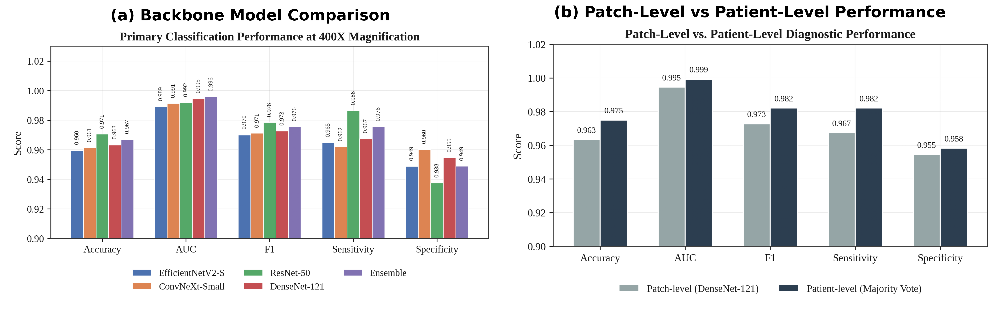

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib as mpl

mpl.rcParams.update({
    "font.family": "Times New Roman",
    "font.weight": "bold",
    "font.size": 18,
    "axes.titleweight": "bold",
    "figure.dpi": 300,
    "savefig.dpi": 600,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
})

FIG_DIR = os.path.join(SAVE_DIR, "paper_figures")

img1 = mpimg.imread(os.path.join(FIG_DIR, "fig_model_comparison_400X.png"))
img2 = mpimg.imread(os.path.join(FIG_DIR, "fig_patch_vs_patient.png"))

fig, ax = plt.subplots(
    1,
    2,
    figsize=(18,7),
    dpi=300,
    constrained_layout=True
)

ax[0].imshow(img1)
ax[0].axis("off")
ax[0].set_title("(a) Backbone Model Comparison",
                fontsize=20,
                fontweight="bold")

ax[1].imshow(img2)
ax[1].axis("off")
ax[1].set_title("(b) Patch-Level vs Patient-Level Performance",
                fontsize=20,
                fontweight="bold")

plt.savefig(
    os.path.join(FIG_DIR, "fig_combined_model_results.pdf"),
    dpi=600,
    bbox_inches="tight",
    facecolor="white"
)

plt.savefig(
    os.path.join(FIG_DIR, "fig_combined_model_results.png"),
    dpi=600,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/BreakHis_Results/sample_images/malignant_40X.png'

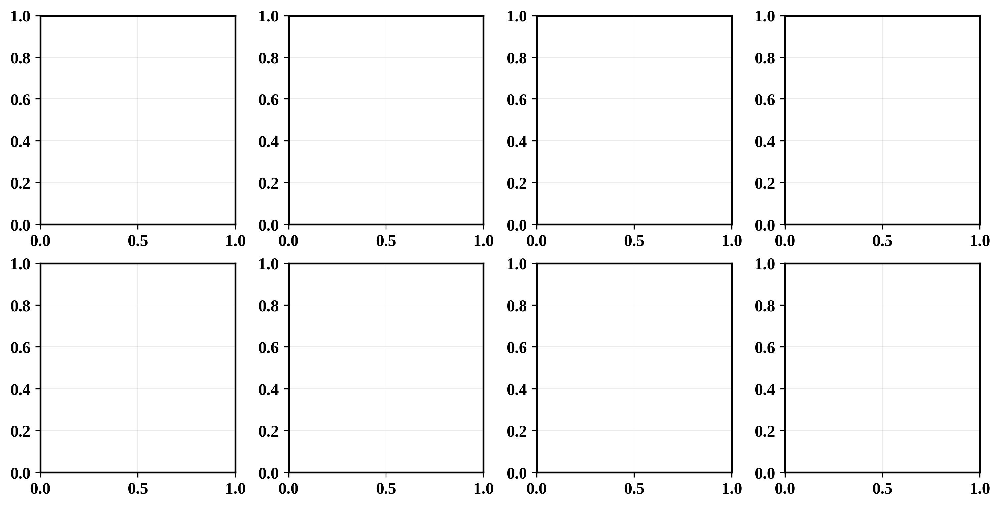

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.font_manager as fm

# =====================================================
# Paths to the original images
# =====================================================

IMG_DIR = "/content/drive/MyDrive/BreakHis_Results/sample_images"

images = {
    "40X": {
        "Malignant": os.path.join(IMG_DIR, "malignant_40X.png"),
        "Benign":    os.path.join(IMG_DIR, "benign_40X.png"),
    },
    "100X": {
        "Malignant": os.path.join(IMG_DIR, "malignant_100X.png"),
        "Benign":    os.path.join(IMG_DIR, "benign_100X.png"),
    },
    "200X": {
        "Malignant": os.path.join(IMG_DIR, "malignant_200X.png"),
        "Benign":    os.path.join(IMG_DIR, "benign_200X.png"),
    },
    "400X": {
        "Malignant": os.path.join(IMG_DIR, "malignant_400X.png"),
        "Benign":    os.path.join(IMG_DIR, "benign_400X.png"),
    },
}

# =====================================================
# Font
# =====================================================

preferred = [
    "Times New Roman",
    "Nimbus Roman",
    "Liberation Serif",
    "DejaVu Serif"
]

available = {f.name for f in fm.fontManager.ttflist}
chosen = next((x for x in preferred if x in available), "DejaVu Serif")

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": [chosen],
    "font.size": 16,
    "font.weight": "bold",
    "axes.titleweight": "bold",
    "figure.dpi": 300,
    "savefig.dpi": 600,
    "pdf.fonttype": 42,
})

# =====================================================
# Figure
# =====================================================

fig, ax = plt.subplots(
    2,
    4,
    figsize=(10,5),
    constrained_layout=True
)

cols = ["40X","100X","200X","400X"]

for j,col in enumerate(cols):

    ax[0,j].imshow(Image.open(images[col]["Malignant"]))
    ax[0,j].axis("off")
    ax[0,j].set_title(col,
                      fontsize=18,
                      fontweight="bold")

    ax[1,j].imshow(Image.open(images[col]["Benign"]))
    ax[1,j].axis("off")

ax[0,0].set_ylabel(
    "Malignant\n(Ductal Carcinoma)",
    fontsize=16,
    fontweight="bold"
)

ax[1,0].set_ylabel(
    "Benign\n(Fibroadenoma)",
    fontsize=16,
    fontweight="bold"
)

plt.savefig(
    "fig_magnification_samples.pdf",
    bbox_inches="tight",
    dpi=600
)

plt.savefig(
    "fig_magnification_samples.png",
    bbox_inches="tight",
    dpi=600
)

plt.show()

In [ ]:
import os

FIG_DIR = os.path.join(SAVE_DIR, "paper_figures")

print(FIG_DIR)
print()

for f in sorted(os.listdir(FIG_DIR)):
    print(f)

/content/drive/MyDrive/BreakHis_Results/paper_figures

fig_accuracy_vs_faithfulness.pdf
fig_accuracy_vs_faithfulness.png
fig_cross_magnification.pdf
fig_cross_magnification.png
fig_cross_magnification_4panel.pdf
fig_cross_magnification_4panel.png
fig_gradcam_comparison.pdf
fig_gradcam_comparison.png
fig_gradcam_lime_combined.pdf
fig_gradcam_lime_combined.png
fig_gradcam_only.pdf
fig_gradcam_only.png
fig_gradcampp_only.pdf
fig_gradcampp_only.png
fig_lime_comparison.pdf
fig_lime_comparison.png
fig_magnification_samples.pdf
fig_magnification_samples.png
fig_model_comparison_400X.pdf
fig_model_comparison_400X.png
fig_patch_vs_patient.pdf
fig_patch_vs_patient.png
fig_patient_confusion_matrix.pdf
fig_patient_confusion_matrix.png
fig_quantus_metrics.pdf
fig_quantus_metrics.png
fig_radar_comparison.pdf
fig_radar_comparison.png
fig_shap_comparison.pdf
fig_shap_comparison.png
fig_subtype_accuracy.pdf
fig_subtype_accuracy.png
fig_xai_methods_unified.pdf
fig_xai_methods_unified.png
table_magnifica